### Victor Oche
##### Finding Relationships between QQQ ETF Price and NASDAQ 100 Technology Stocks For Price Forecsting (Classification, Prediction

In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:

import alpaca_trade_api as alpaca
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#import yfinance as yf
import hvplot.pandas


alpaca_api = alpaca.REST()#you can insert your api keys here to fetch data.

# Set the ticker symbol and time frame
ticker = ['AAPL','MSFT','AMZN','NVDA','META','AVGO','GOOGL','TSLA','ADBE','ANSS','ZS','DDOG',
          'EBAY','WBA','SIRI','ILMN','ZM','ALGN','JD','ENPH','LCID','SMH','TLT','SGOV']
    

timeframe = "1Day"

# Set the start and end dates for the data
start_date = "2012-01-01T00:00:00-00:00"
end_date = "2023-11-01T00:00:00-00:00"

# Retrieve the data
data = alpaca_api.get_bars(ticker,  timeframe, start_date, end_date).df

# Convert the data to a Pandas dataframe
df = pd.DataFrame(data)




In [4]:
df

,close,high,low,trade_count,open,volume,vwap,symbol
timestamp,,,,,,,,
2016-01-04 05:00:00+00:00,105.35,105.3680,102.000,351452,102.61,71935339,104.007250,AAPL
2016-01-05 05:00:00+00:00,102.71,105.8500,102.410,321365,105.75,58690536,103.414304,AAPL
2016-01-06 05:00:00+00:00,100.70,102.3700,99.870,409164,100.56,71079827,100.847762,AAPL
2016-01-07 05:00:00+00:00,96.45,100.1300,96.430,462836,98.68,85996453,98.046209,AAPL
2016-01-08 05:00:00+00:00,96.96,99.1100,96.760,419555,98.55,75066292,97.916490,AAPL
...,...,...,...,...,...,...,...,...
2023-10-25 04:00:00+00:00,157.61,163.9900,157.530,29607,162.88,1390688,158.924623,ZS
2023-10-26 04:00:00+00:00,154.61,161.1000,153.080,30120,159.03,1398018,155.520587,ZS
2023-10-27 04:00:00+00:00,154.37,157.0859,153.885,25112,156.24,1089699,154.989637,ZS


In [5]:
df.to_csv('C:\\Users\\myfiles\\Downloads\\Programming Machine learning Applications\\df_stock.csv') #save dataframe. Note that I provided the saved dataset df_stock.csv for this project.

In [6]:
data2 = alpaca_api.get_bars('QQQ',  timeframe, start_date, end_date).df
dfYvar=pd.DataFrame(data2)
dfYvar['symbol']='QQQ'

In [7]:
dfYvar.head()

,close,high,low,trade_count,open,volume,vwap,symbol
timestamp,,,,,,,,
2016-01-04 05:00:00+00:00,109.50,109.60,108.12,181682,109.43,51517062,108.874273,QQQ
2016-01-05 05:00:00+00:00,109.31,110.18,108.80,151825,110.04,39065561,109.430154,QQQ
2016-01-06 05:00:00+00:00,108.26,108.89,107.41,156916,107.43,42234893,108.150107,QQQ
2016-01-07 05:00:00+00:00,104.87,107.29,104.81,241719,105.96,61742257,105.840546,QQQ
2016-01-08 05:00:00+00:00,104.01,106.29,103.90,239124,105.67,69707476,105.111070,QQQ


In [8]:
dfYvar.to_csv('C:\\Users\\ochev\\Downloads\\Programming Machine learning Applications\\dfYvar.csv')

In [9]:

#df['timestamp'] = pd.to_datetime(df['timestamp'])
#df.set_index('Date', inplace=True)
#data[stock] = df

# Load data into dataframes
stocks = ticker
data = pd.DataFrame()
#df['timestamp'] = pd.to_datetime(df['timestamp'])
df=df[['close','symbol']]
dfYvar=dfYvar[['close']]
dfYvar=pd.DataFrame(dfYvar)
dfYvar=dfYvar.rename(columns={'close':'QQQClose(YVar)'})
dctStockDfs={}

for stock in stocks:
    
    
    dfString='df'+stock
    
    data = df[df['symbol']==stock]
    
    data=data[['close']]
    #data=data['close'].pct_change()
    #data=data.dropna()
    data=pd.DataFrame(data)
    data=data.rename(columns={'close':stock+'close'})
    
    #display(data.tail())
    #display(data.shape)
    #exec(f"df{stock}=data")
    dctStockDfs[f'df{stock}']=data
    
for key, value in dctStockDfs.items():

    print(f'Key: {key},Value: {value}')
    




Key: dfAAPL,Value:                            AAPLclose
timestamp                           
2016-01-04 05:00:00+00:00     105.35
2016-01-05 05:00:00+00:00     102.71
2016-01-06 05:00:00+00:00     100.70
2016-01-07 05:00:00+00:00      96.45
2016-01-08 05:00:00+00:00      96.96
...                              ...
2023-10-25 04:00:00+00:00     171.10
2023-10-26 04:00:00+00:00     166.89
2023-10-27 04:00:00+00:00     168.22
2023-10-30 04:00:00+00:00     170.29
2023-10-31 04:00:00+00:00     170.77

[1971 rows x 1 columns]
Key: dfMSFT,Value:                            MSFTclose
timestamp                           
2016-01-04 05:00:00+00:00      54.80
2016-01-05 05:00:00+00:00      55.05
2016-01-06 05:00:00+00:00      54.05
2016-01-07 05:00:00+00:00      52.17
2016-01-08 05:00:00+00:00      52.33
...                              ...
2023-10-25 04:00:00+00:00     340.67
2023-10-26 04:00:00+00:00     327.89
2023-10-27 04:00:00+00:00     329.81
2023-10-30 04:00:00+00:00     337.31
2023-10-31 0

,QQQClose(YVar)
timestamp,
2016-01-04 05:00:00+00:00,109.50
2016-01-05 05:00:00+00:00,109.31
2016-01-06 05:00:00+00:00,108.26
2016-01-07 05:00:00+00:00,104.87
2016-01-08 05:00:00+00:00,104.01
...,...
2023-10-25 04:00:00+00:00,350.34
2023-10-26 04:00:00+00:00,343.66
2023-10-27 04:00:00+00:00,345.31


Pct Change Period is 5


<Figure size 640x480 with 0 Axes>

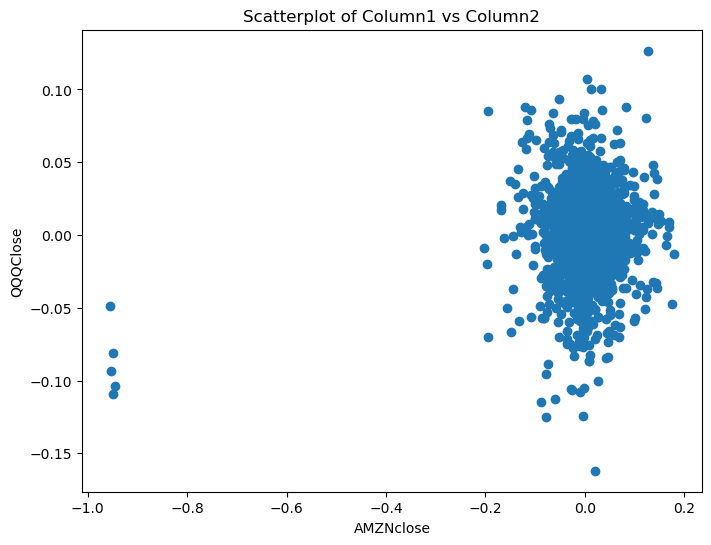

Correlation between QQQ and dfAMZN: 0.10349861961400313

Pct Change Period is 10


<Figure size 640x480 with 0 Axes>

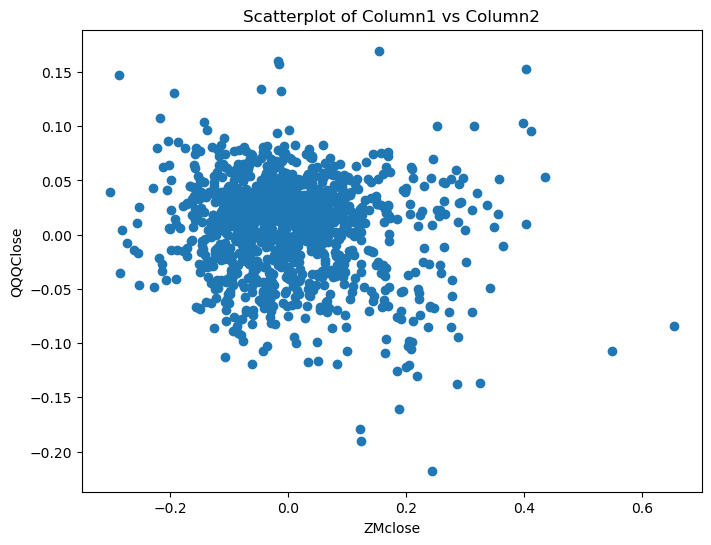

Correlation between QQQ and dfZM: -0.12293086027806627

Pct Change Period is 10


<Figure size 640x480 with 0 Axes>

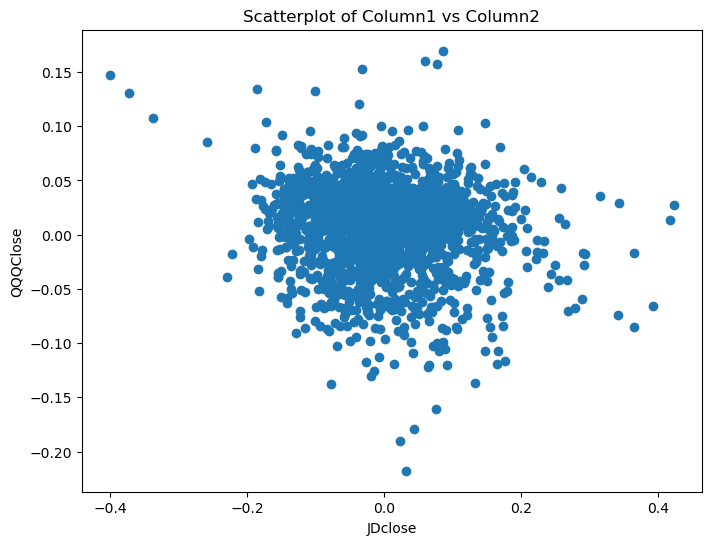

Correlation between QQQ and dfJD: -0.10713885063416004

Pct Change Period is 10


<Figure size 640x480 with 0 Axes>

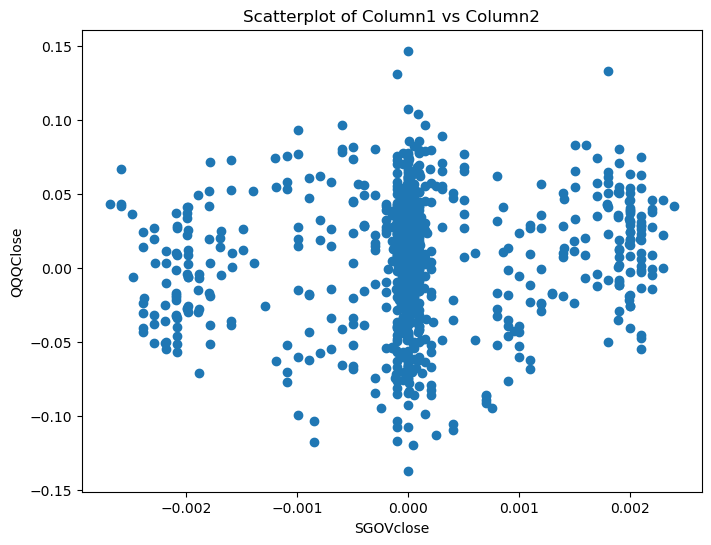

Correlation between QQQ and dfSGOV: 0.11347948694918845

Pct Change Period is 15


<Figure size 640x480 with 0 Axes>

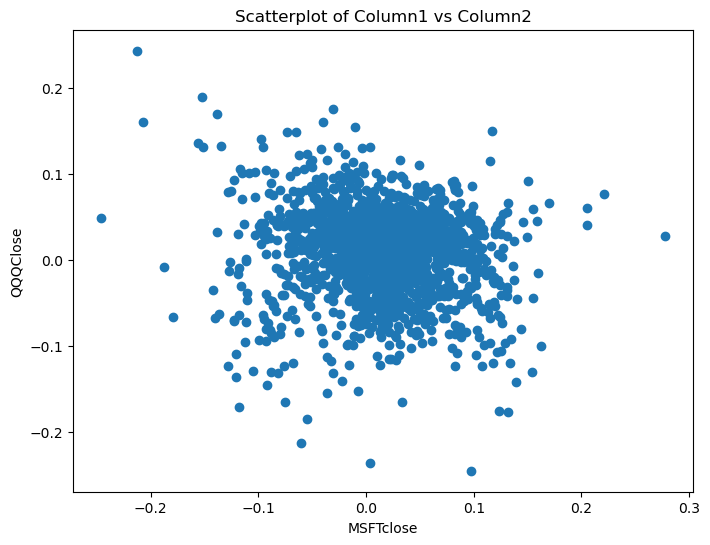

Correlation between QQQ and dfMSFT: -0.10918141914739546

Pct Change Period is 15


<Figure size 640x480 with 0 Axes>

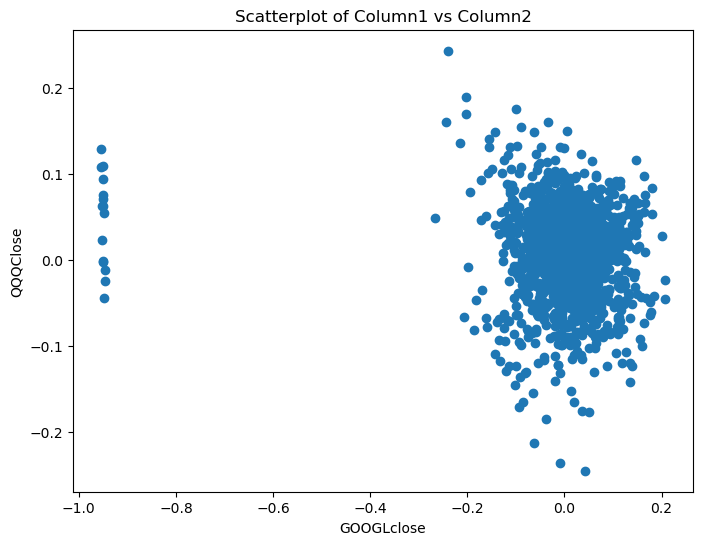

Correlation between QQQ and dfGOOGL: -0.10262485854678952

Pct Change Period is 15


<Figure size 640x480 with 0 Axes>

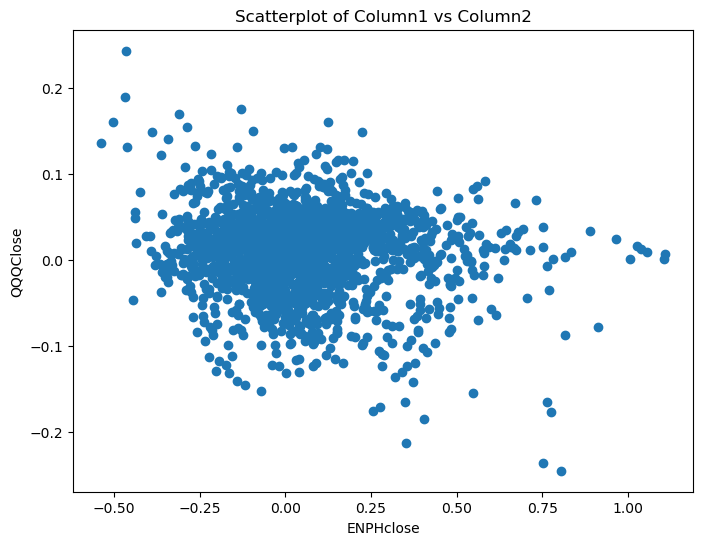

Correlation between QQQ and dfENPH: -0.11417956199739764

Pct Change Period is 15


<Figure size 640x480 with 0 Axes>

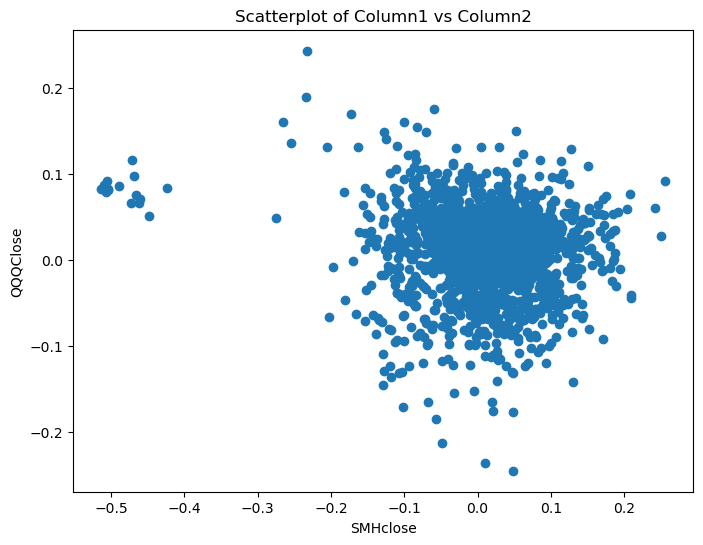

Correlation between QQQ and dfSMH: -0.1193172488900793

Pct Change Period is 15


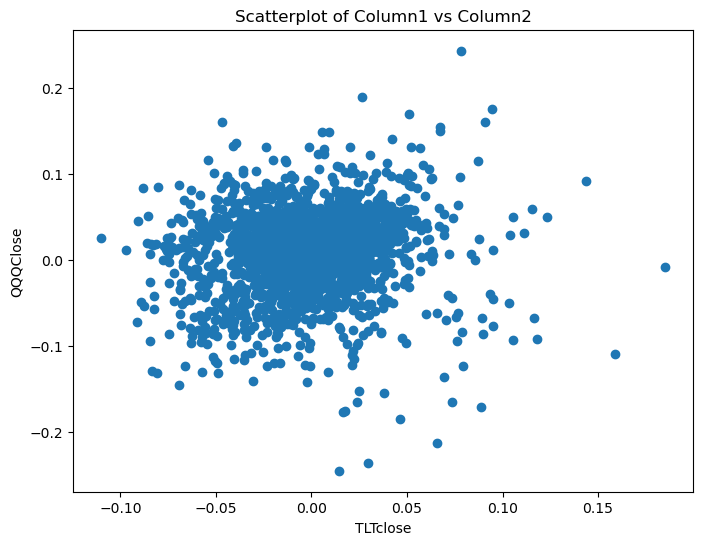

Correlation between QQQ and dfTLT: 0.10800582794192623

Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

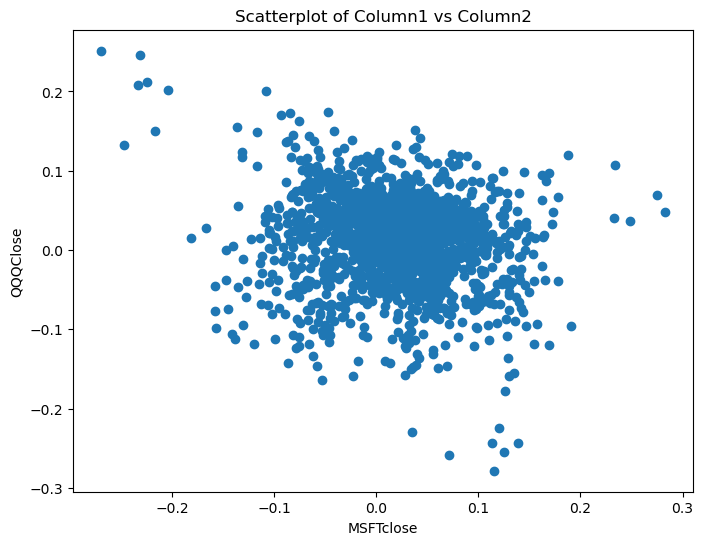

Correlation between QQQ and dfMSFT: -0.15163940437708737

Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

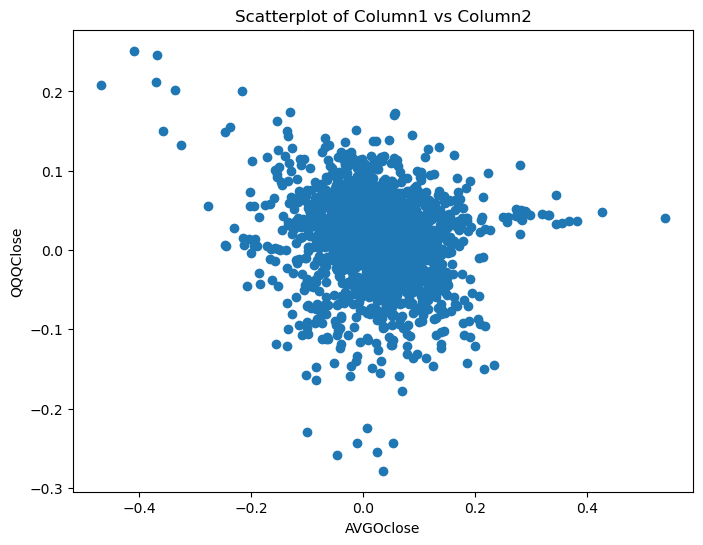

Correlation between QQQ and dfAVGO: -0.15579619142806556

Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

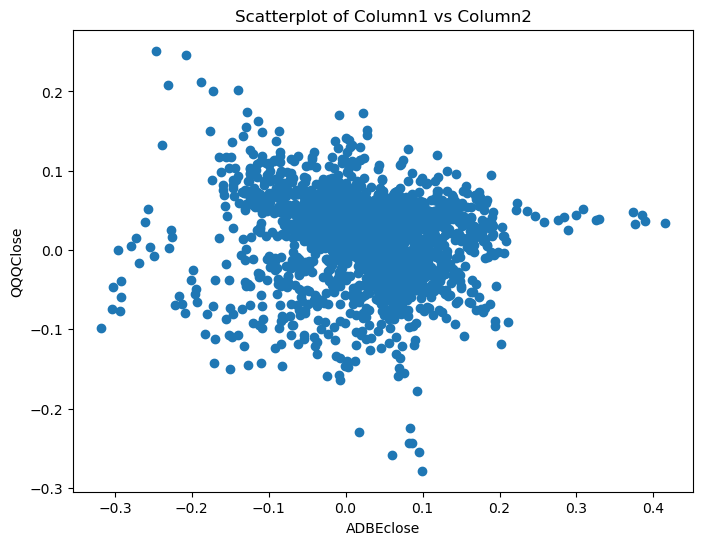

Correlation between QQQ and dfADBE: -0.11351224784495562

Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

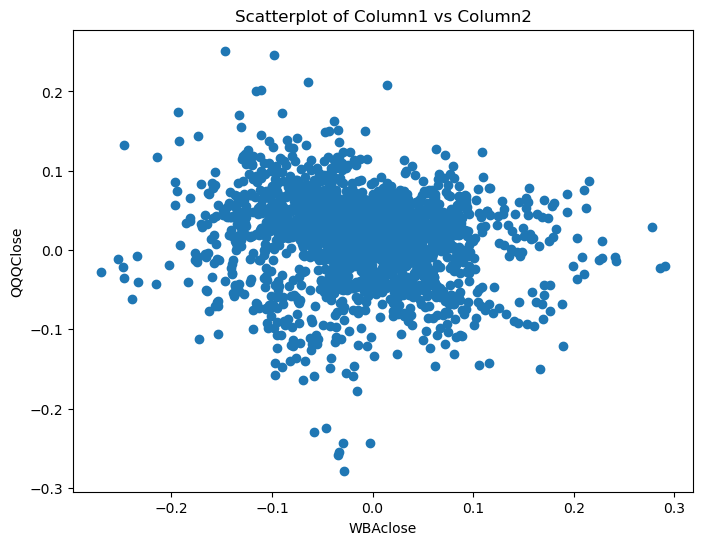

Correlation between QQQ and dfWBA: -0.1341662624347488

Pct Change Period is 20


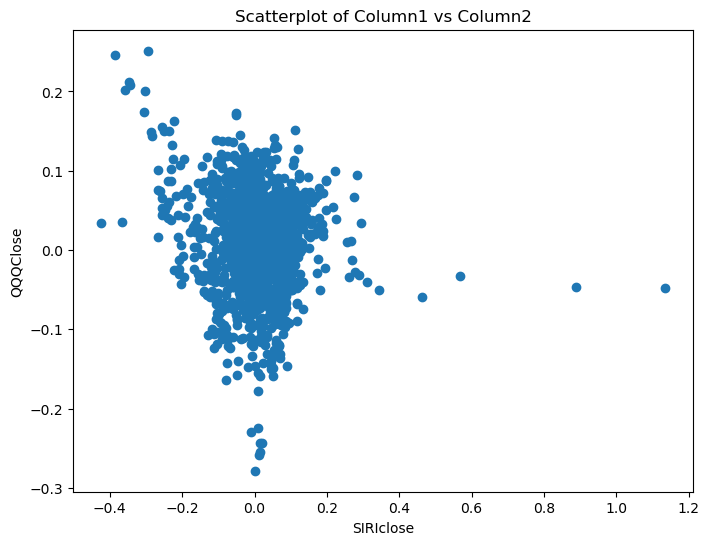

Correlation between QQQ and dfSIRI: -0.13104995782459272

Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

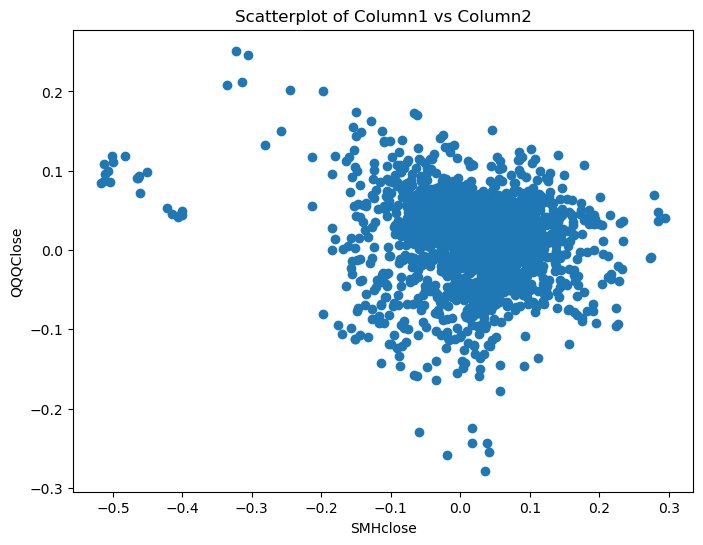

Correlation between QQQ and dfSMH: -0.1761030507380383

Pct Change Period is 20


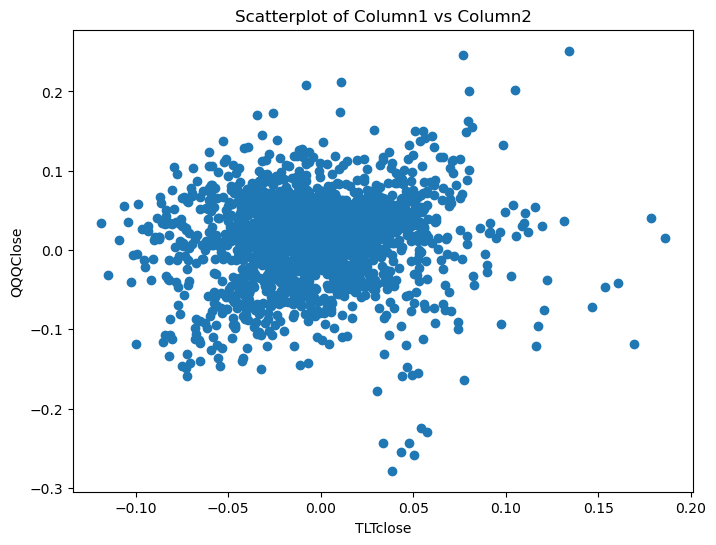

Correlation between QQQ and dfTLT: 0.10650037828747627

Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

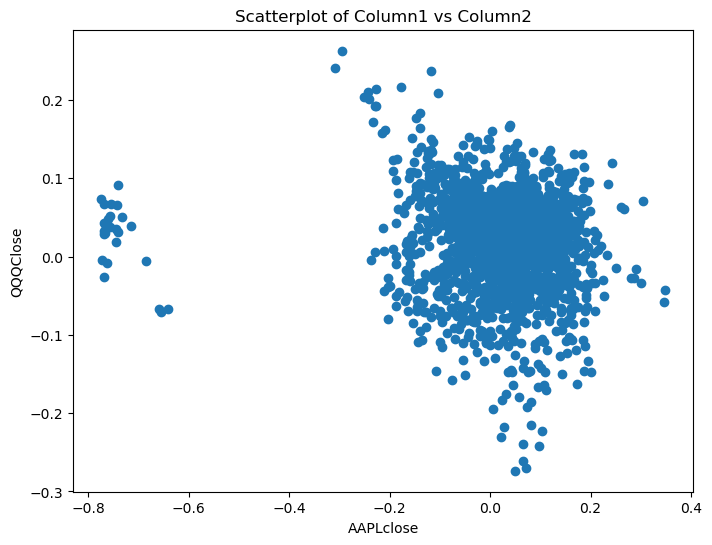

Correlation between QQQ and dfAAPL: -0.1288593160950597

Pct Change Period is 25


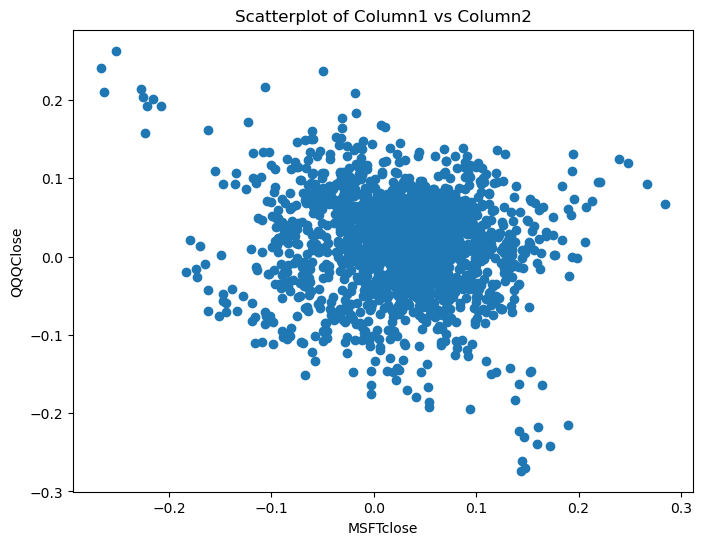

Correlation between QQQ and dfMSFT: -0.1395039977103462

Pct Change Period is 25


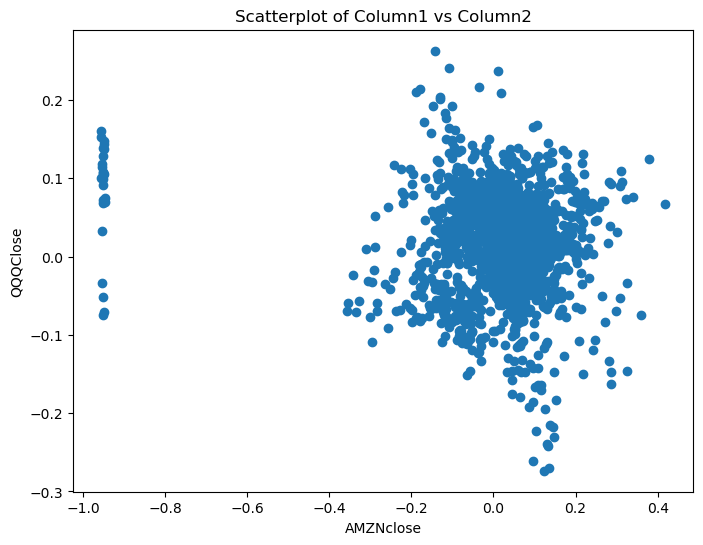

Correlation between QQQ and dfAMZN: -0.13243841041956997

Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

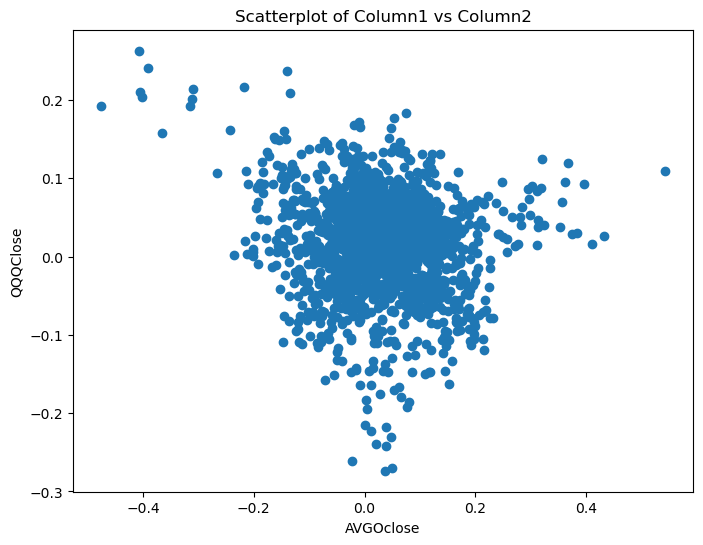

Correlation between QQQ and dfAVGO: -0.1700243355060001

Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

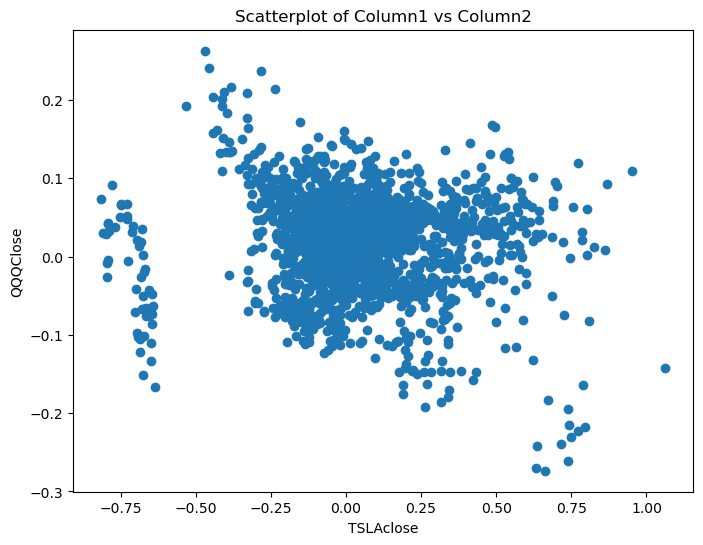

Correlation between QQQ and dfTSLA: -0.11021515198303983

Pct Change Period is 25


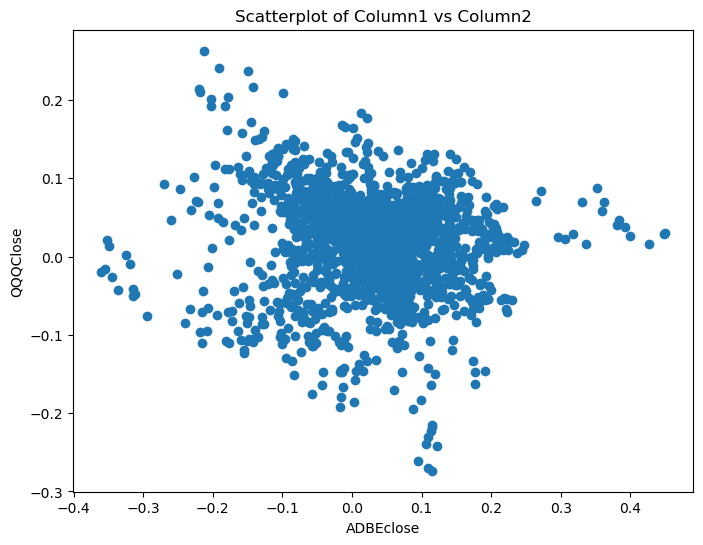

Correlation between QQQ and dfADBE: -0.1137473181666935

Pct Change Period is 25


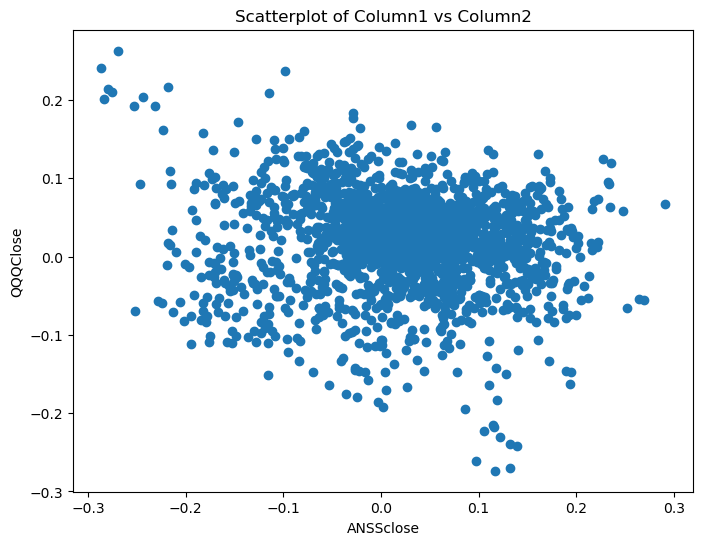

Correlation between QQQ and dfANSS: -0.1265147276295677

Pct Change Period is 25


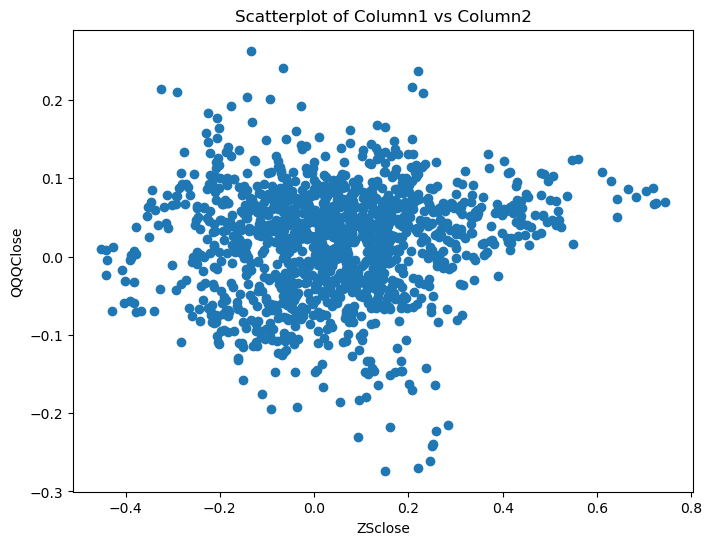

Correlation between QQQ and dfZS: 0.10327110892855146

Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

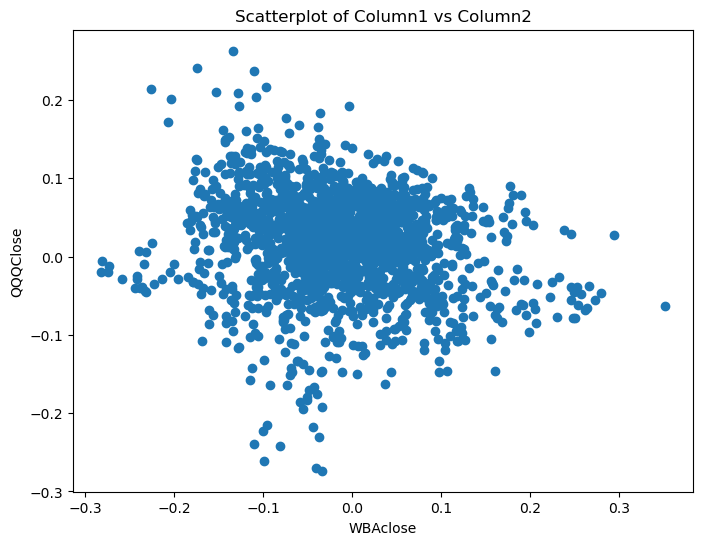

Correlation between QQQ and dfWBA: -0.16440775140299116

Pct Change Period is 25


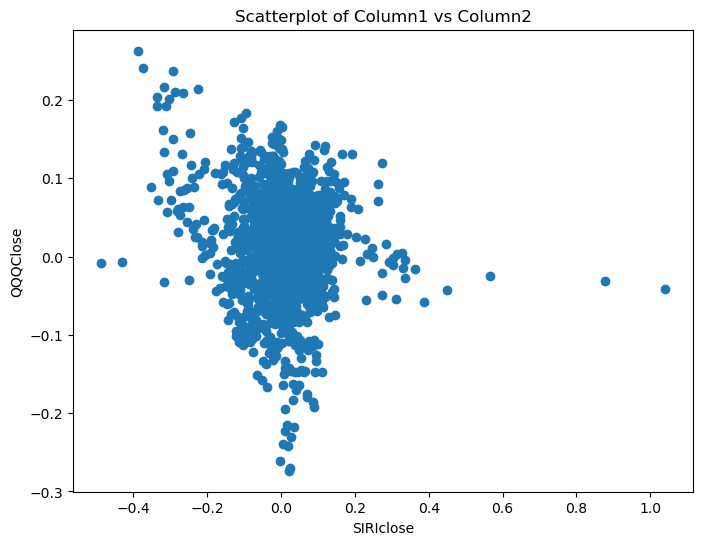

Correlation between QQQ and dfSIRI: -0.1505282330513803

Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

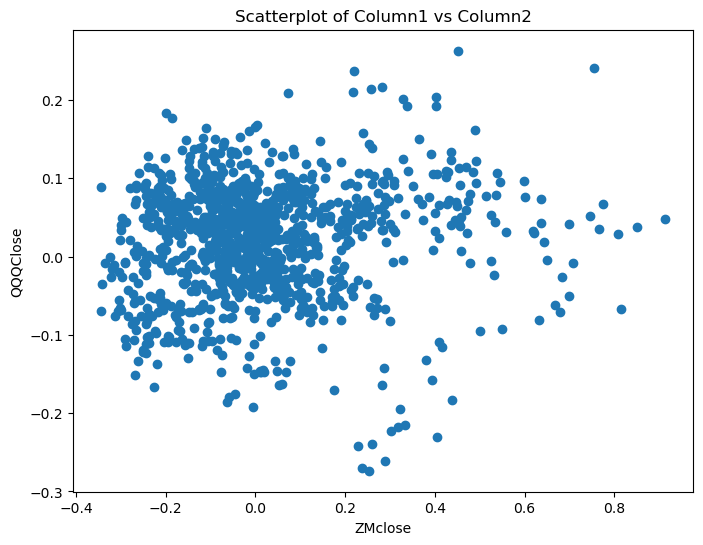

Correlation between QQQ and dfZM: 0.1017771030205772

Pct Change Period is 25


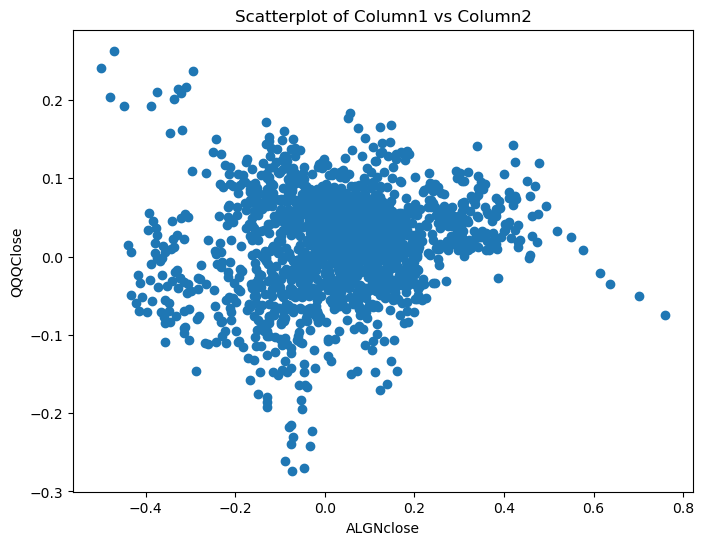

Correlation between QQQ and dfALGN: 0.1203902894701853

Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

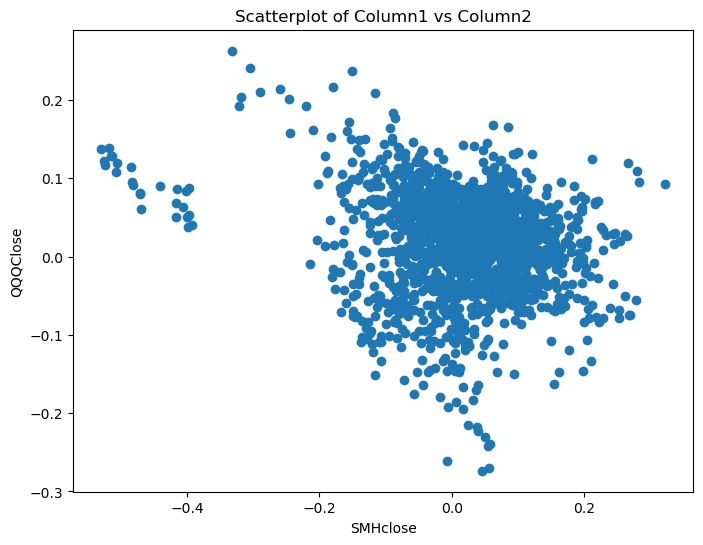

Correlation between QQQ and dfSMH: -0.19984927459944893

Pct Change Period is 25


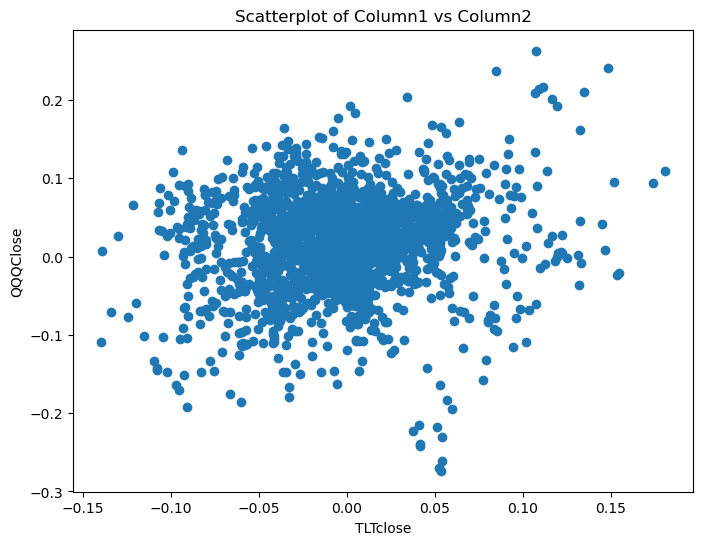

Correlation between QQQ and dfTLT: 0.14734198580710178

Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

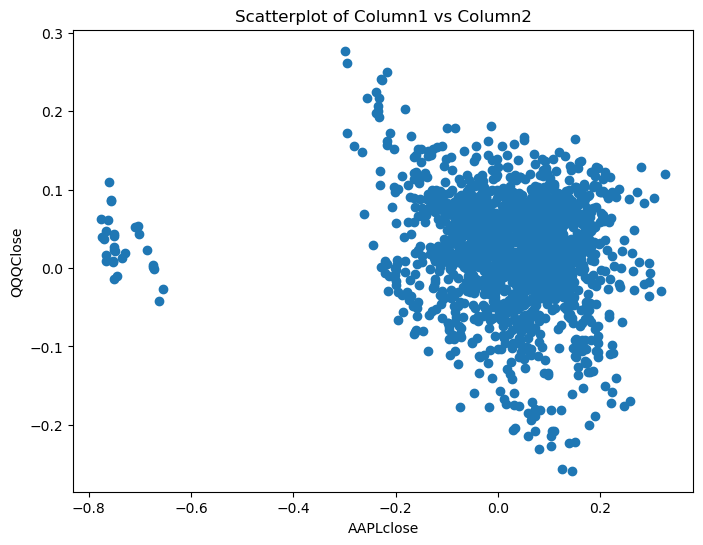

Correlation between QQQ and dfAAPL: -0.14297590239218422

Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

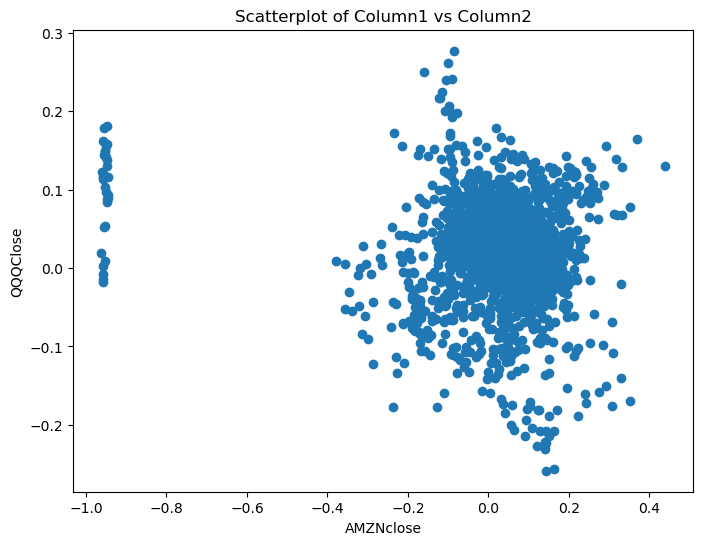

Correlation between QQQ and dfAMZN: -0.13067408580950968

Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

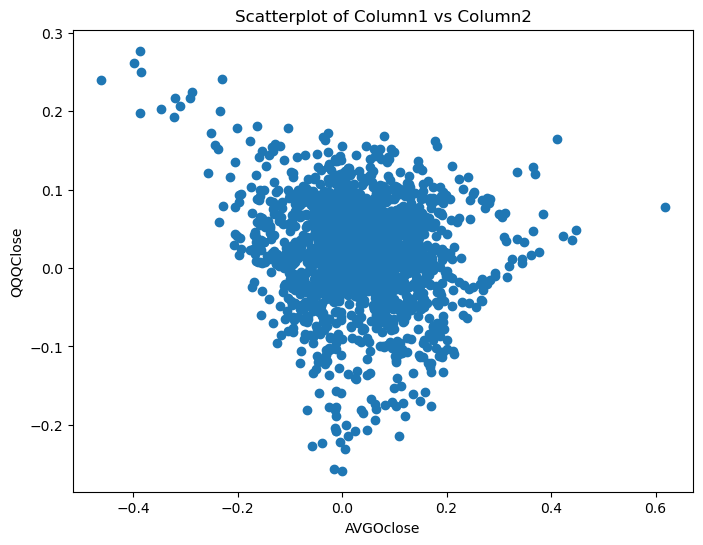

Correlation between QQQ and dfAVGO: -0.1434178182729381

Pct Change Period is 30


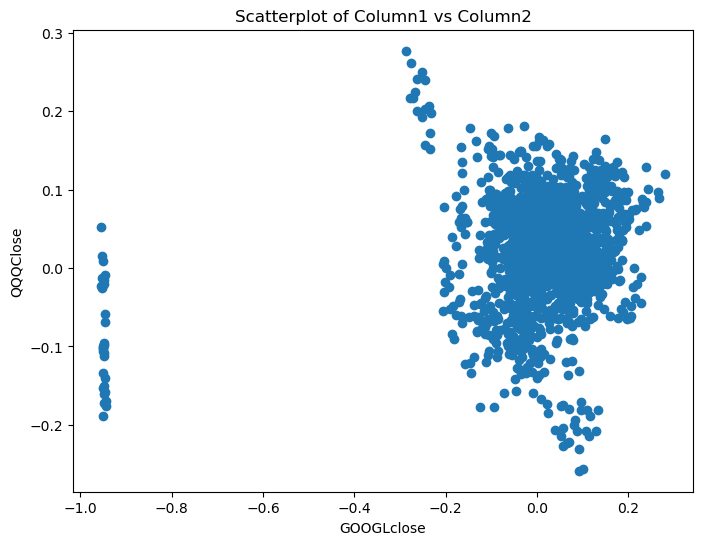

Correlation between QQQ and dfGOOGL: 0.1691757818475793

Pct Change Period is 30


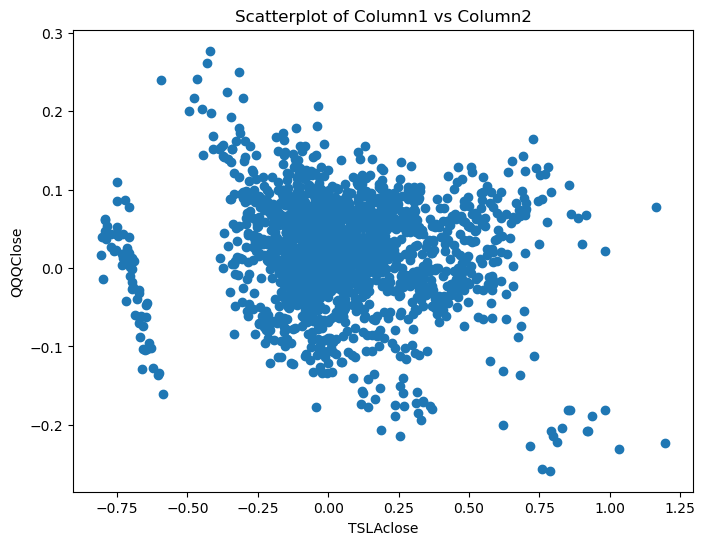

Correlation between QQQ and dfTSLA: -0.12387099105171753

Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

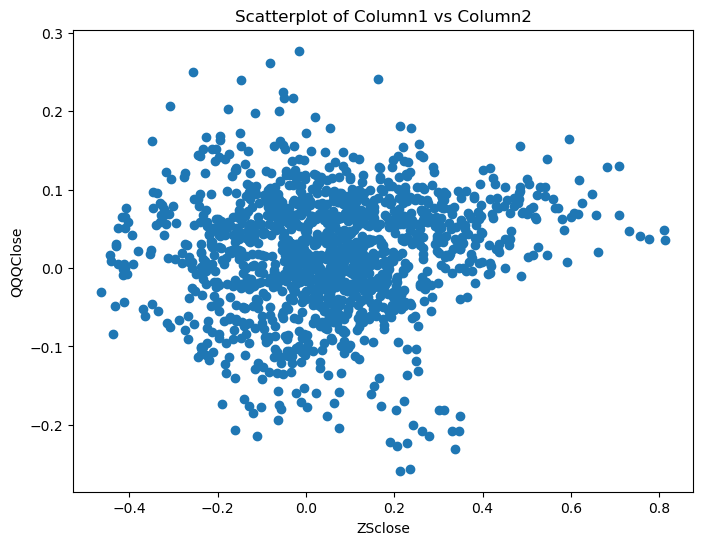

Correlation between QQQ and dfZS: 0.10216807498622593

Pct Change Period is 30


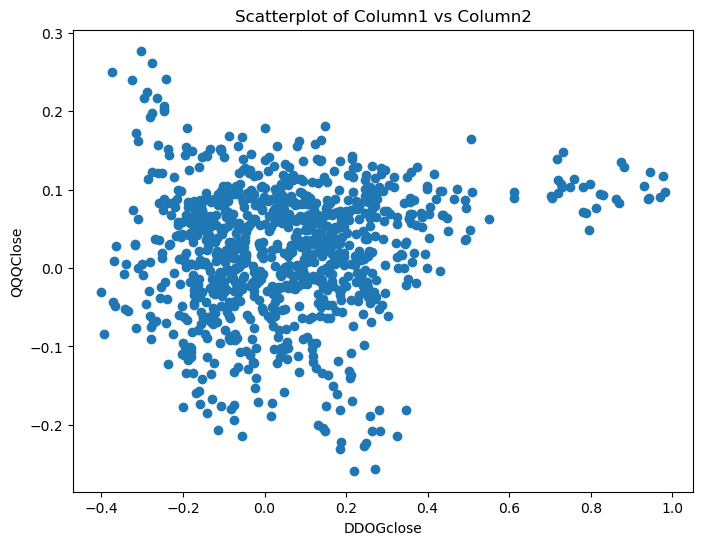

Correlation between QQQ and dfDDOG: 0.12430373466714763

Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

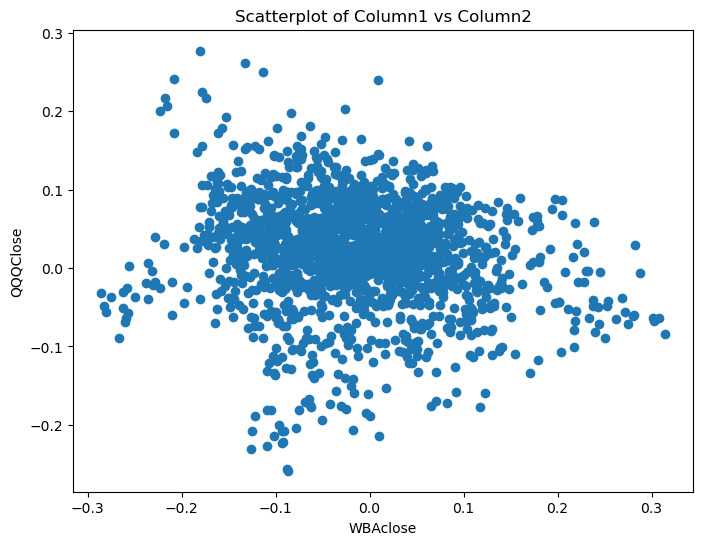

Correlation between QQQ and dfWBA: -0.13953302402706183

Pct Change Period is 30


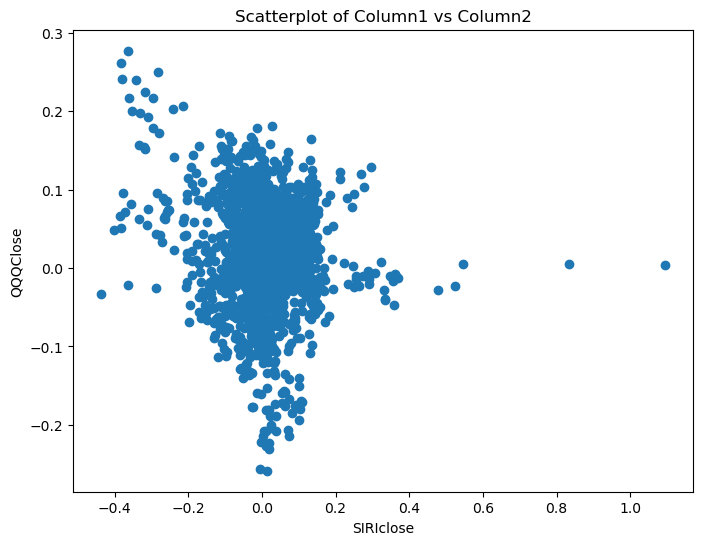

Correlation between QQQ and dfSIRI: -0.1574063696936522

Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

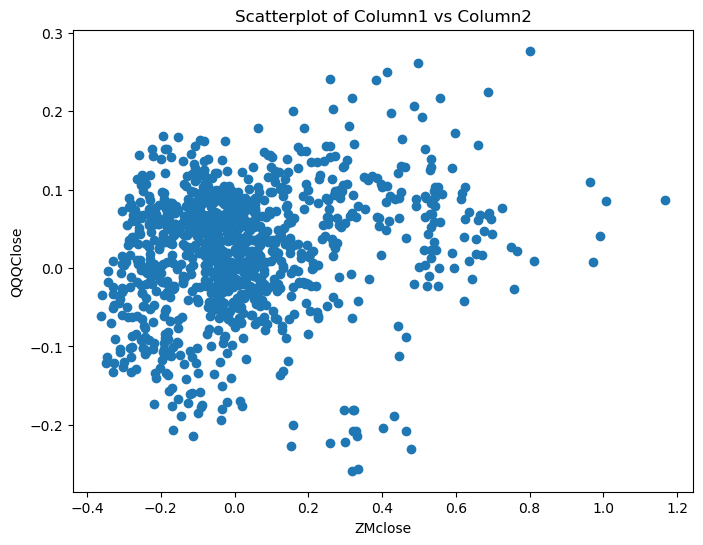

Correlation between QQQ and dfZM: 0.20702186011189713

Pct Change Period is 30


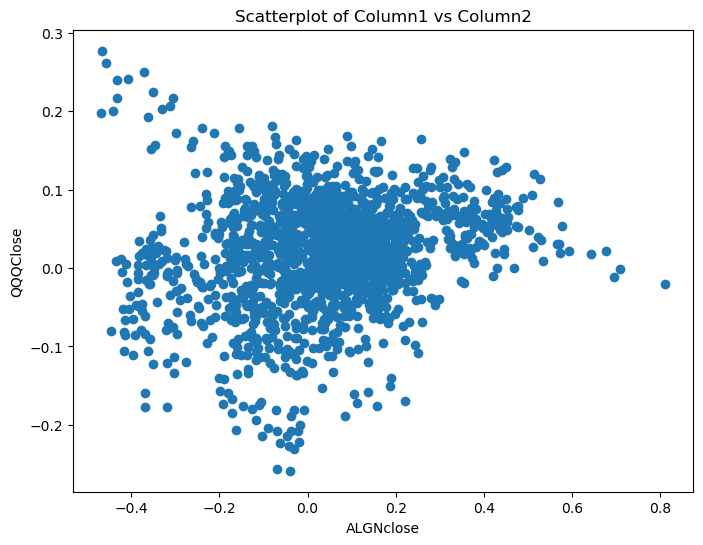

Correlation between QQQ and dfALGN: 0.15716252798421307

Pct Change Period is 30


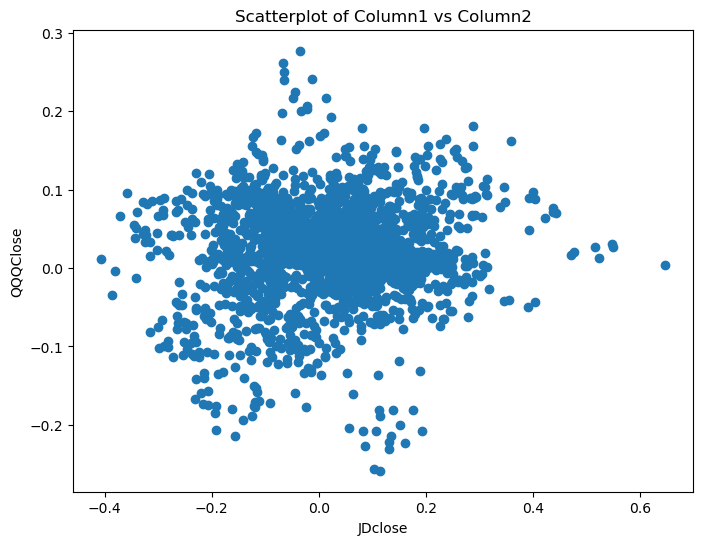

Correlation between QQQ and dfJD: 0.1053836484788434

Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

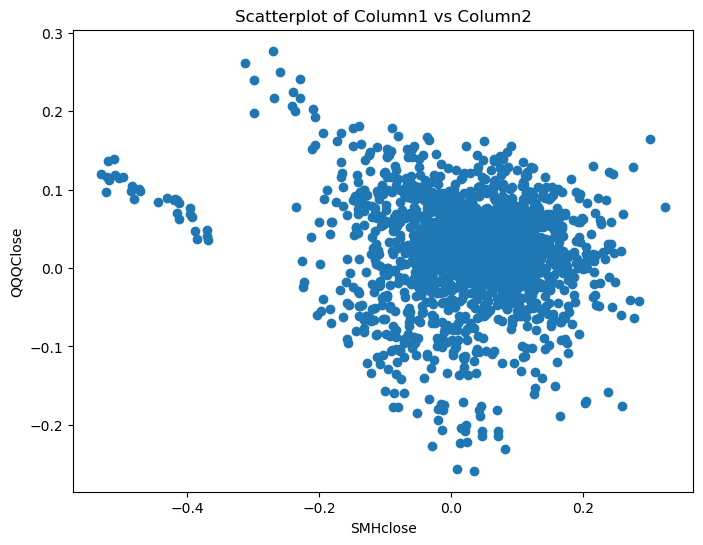

Correlation between QQQ and dfSMH: -0.15628423490105275

Pct Change Period is 30


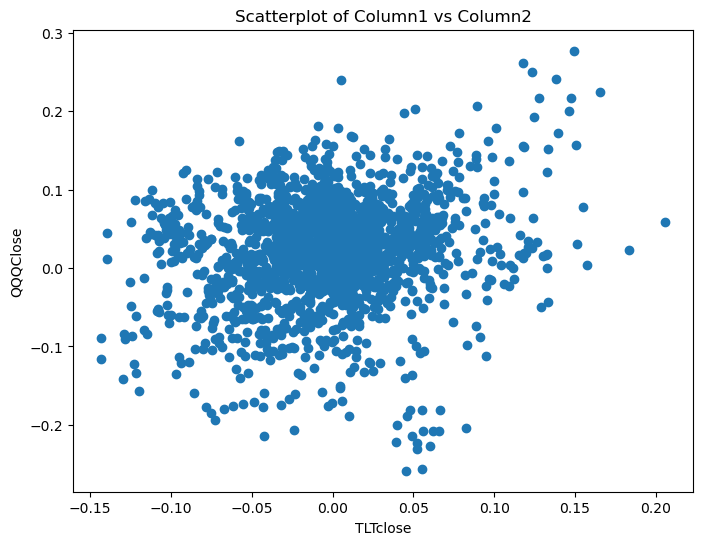

Correlation between QQQ and dfTLT: 0.19769400608462334

Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

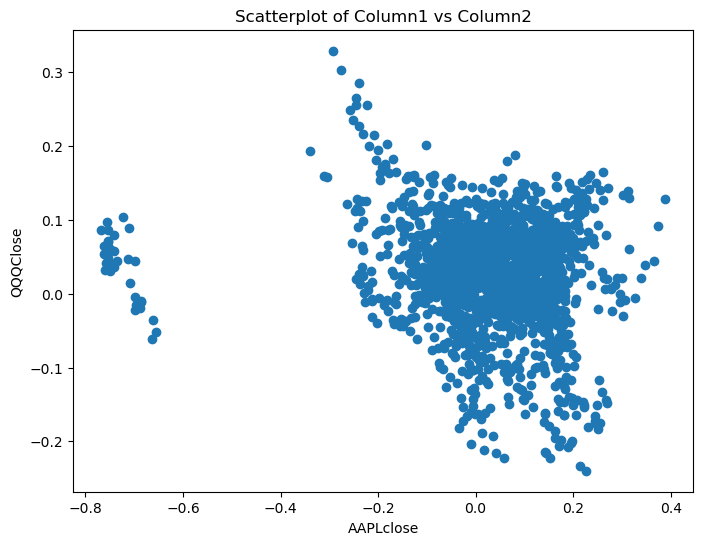

Correlation between QQQ and dfAAPL: -0.17151994844911336

Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

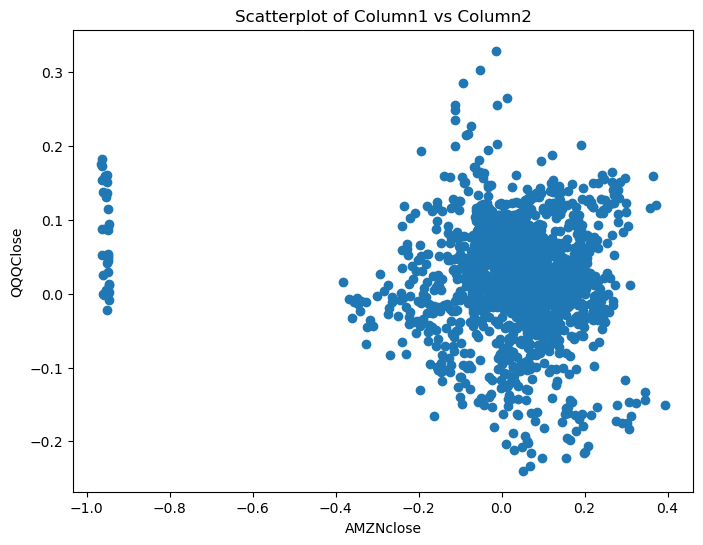

Correlation between QQQ and dfAMZN: -0.11116080503285818

Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

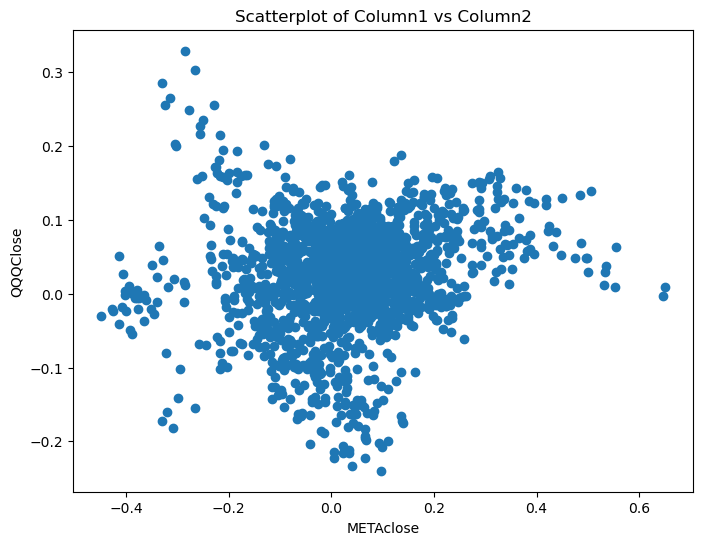

Correlation between QQQ and dfMETA: 0.12755111766246643

Pct Change Period is 35


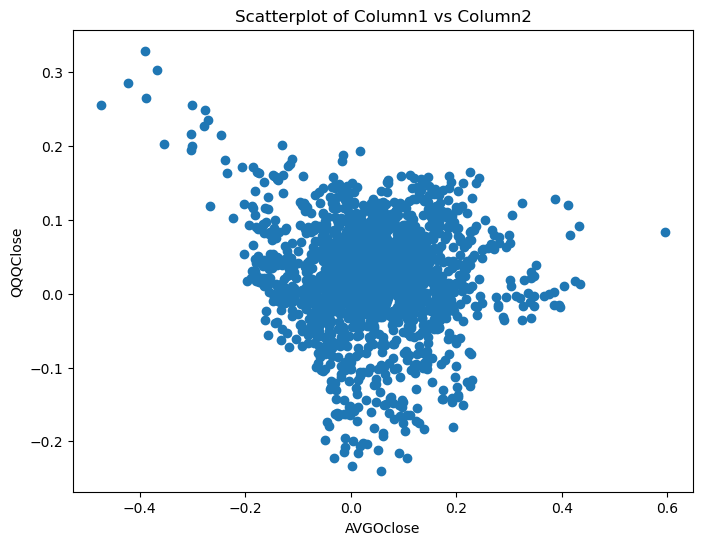

Correlation between QQQ and dfAVGO: -0.11090277736838637

Pct Change Period is 35


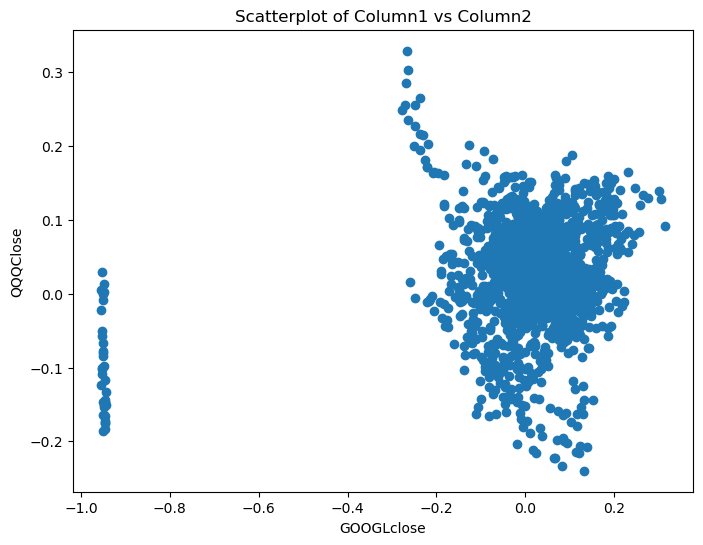

Correlation between QQQ and dfGOOGL: 0.21007393394669396

Pct Change Period is 35


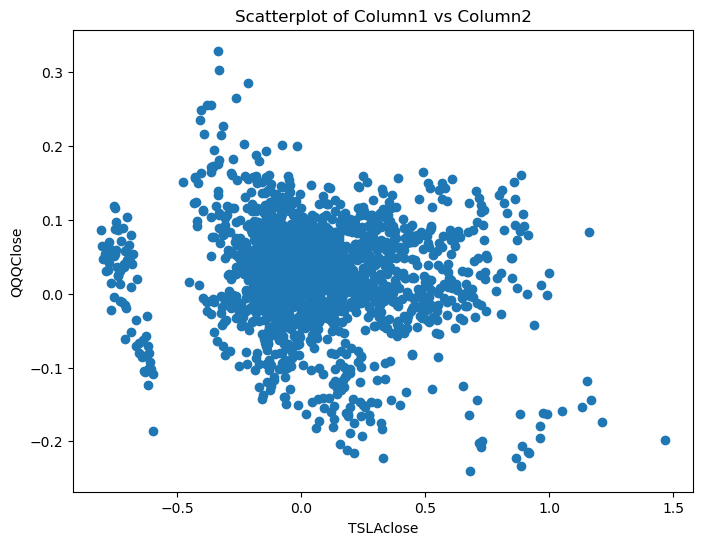

Correlation between QQQ and dfTSLA: -0.14259072306271914

Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

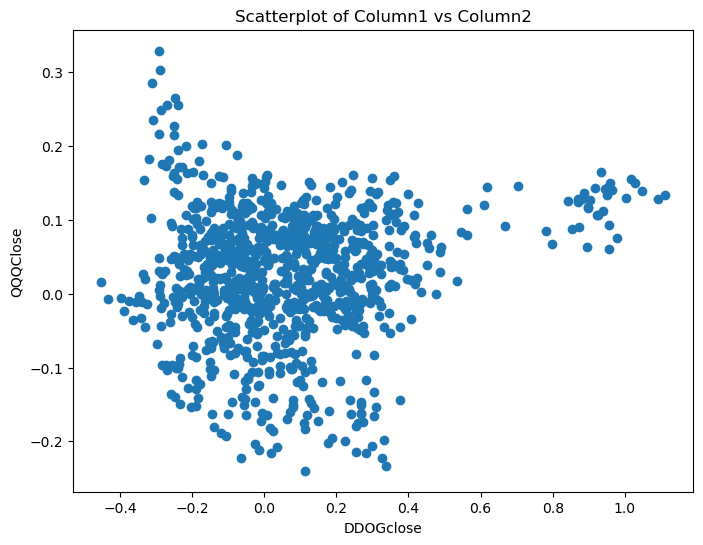

Correlation between QQQ and dfDDOG: 0.10630687295695809

Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

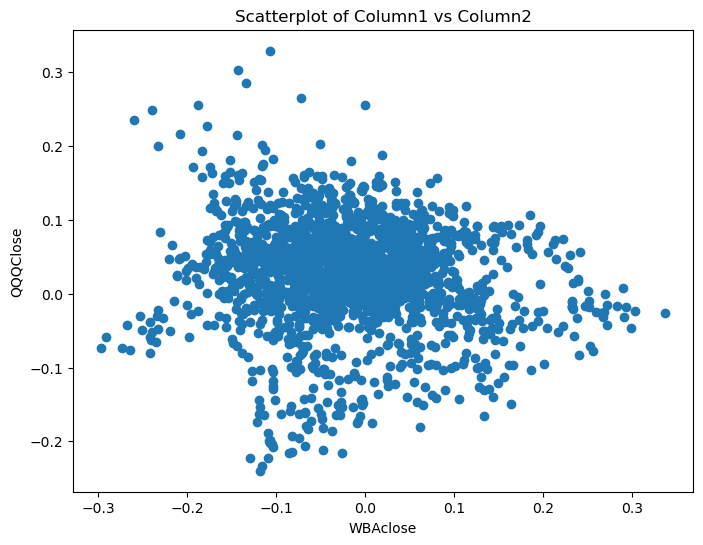

Correlation between QQQ and dfWBA: -0.1058085354377311

Pct Change Period is 35


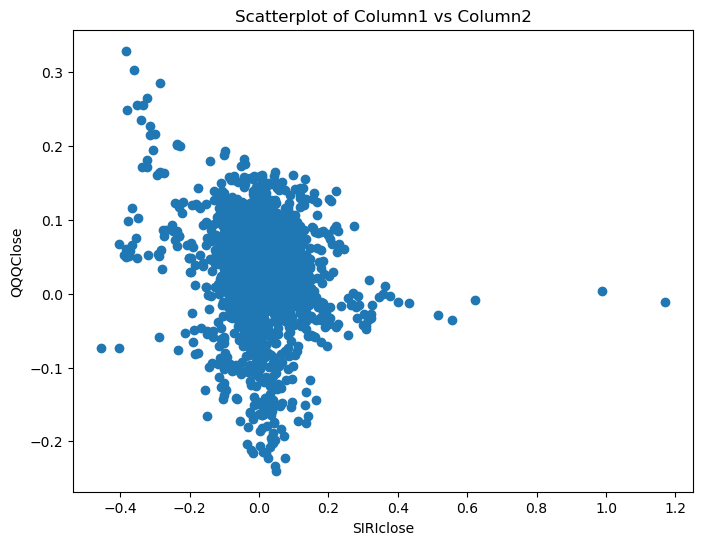

Correlation between QQQ and dfSIRI: -0.16913613042580591

Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

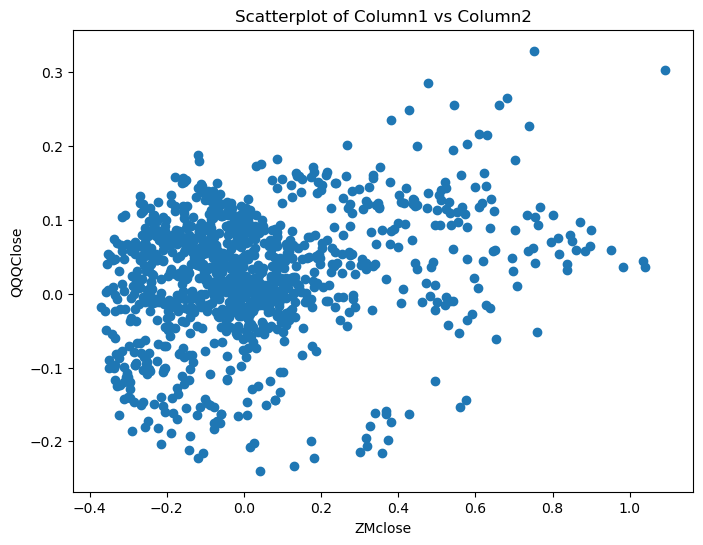

Correlation between QQQ and dfZM: 0.26740314406727

Pct Change Period is 35


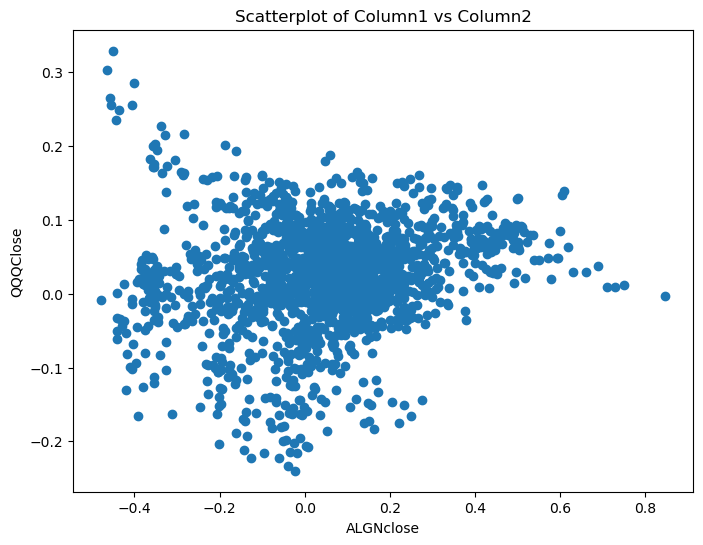

Correlation between QQQ and dfALGN: 0.15818127289272801

Pct Change Period is 35


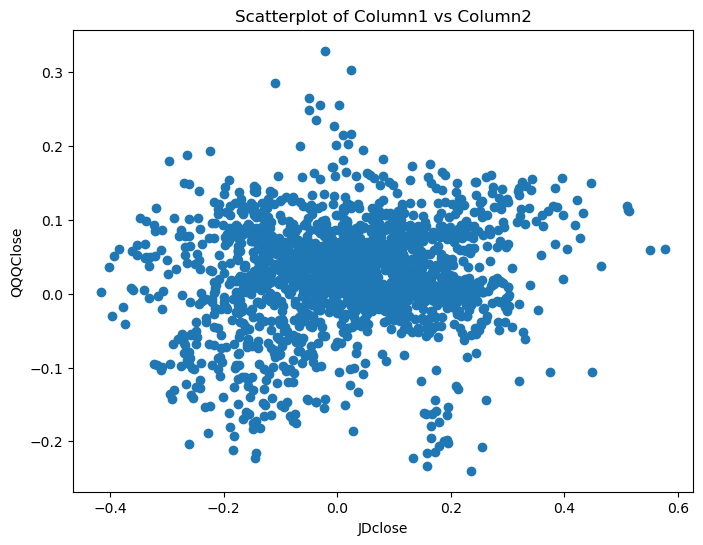

Correlation between QQQ and dfJD: 0.12205021806143938

Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

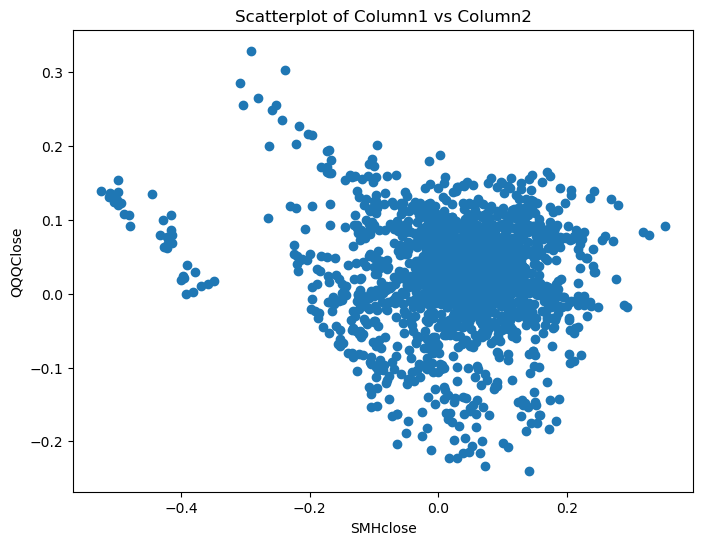

Correlation between QQQ and dfSMH: -0.1179018371637163

Pct Change Period is 35


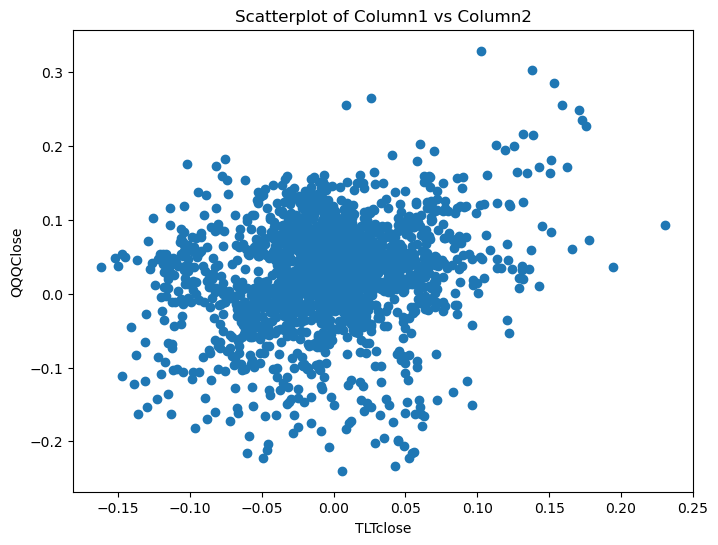

Correlation between QQQ and dfTLT: 0.22364844754259372

Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

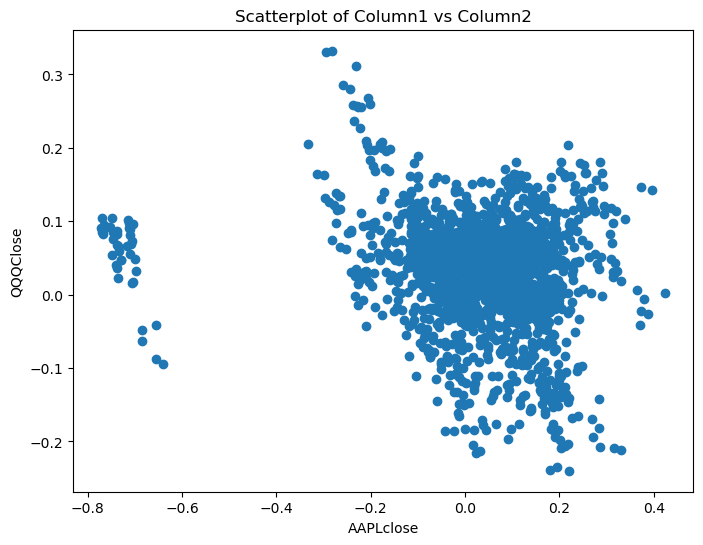

Correlation between QQQ and dfAAPL: -0.1994788842588679

Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

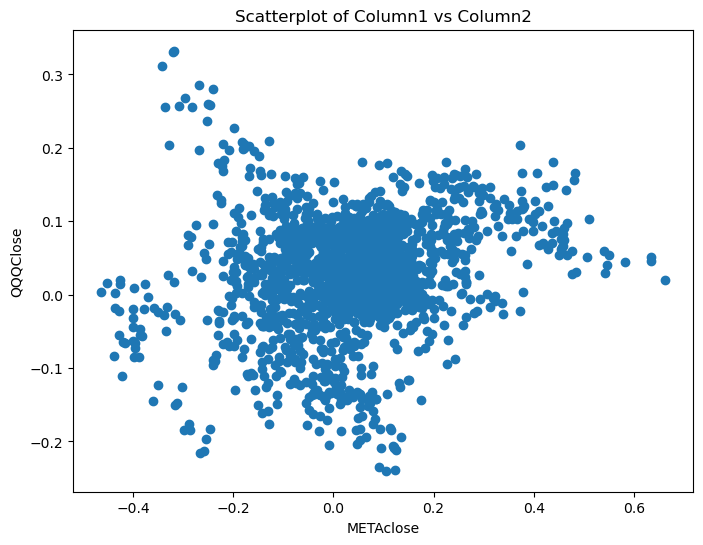

Correlation between QQQ and dfMETA: 0.17363804471955946

Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

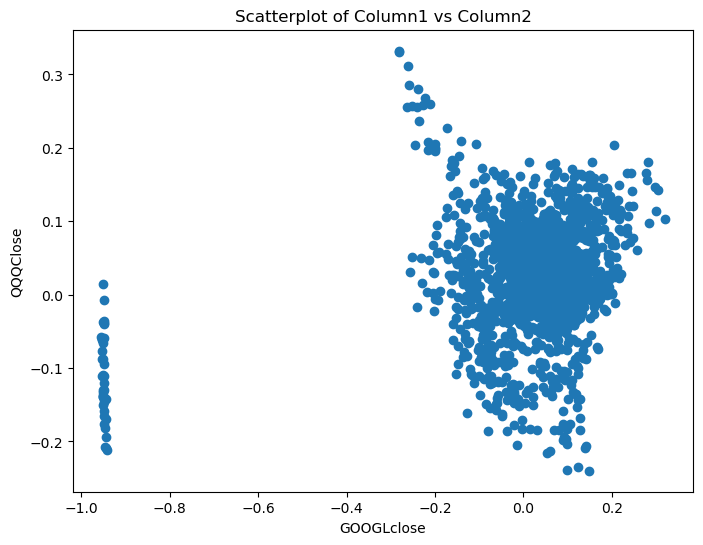

Correlation between QQQ and dfGOOGL: 0.22965707795871376

Pct Change Period is 40


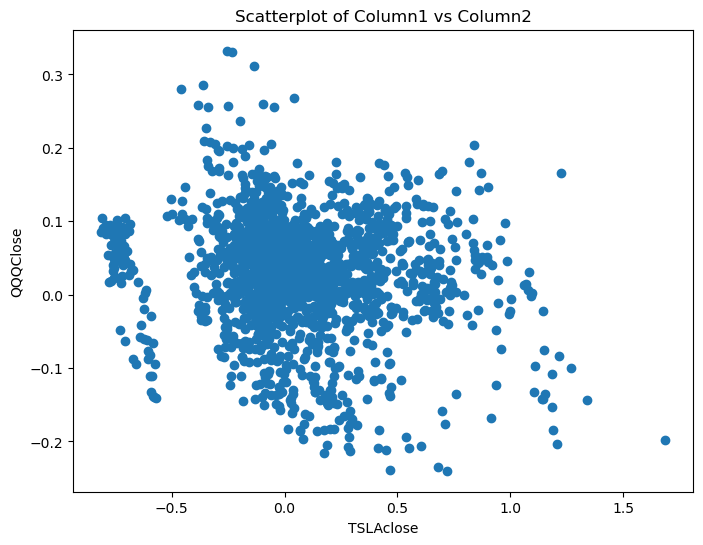

Correlation between QQQ and dfTSLA: -0.14843234879499498

Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

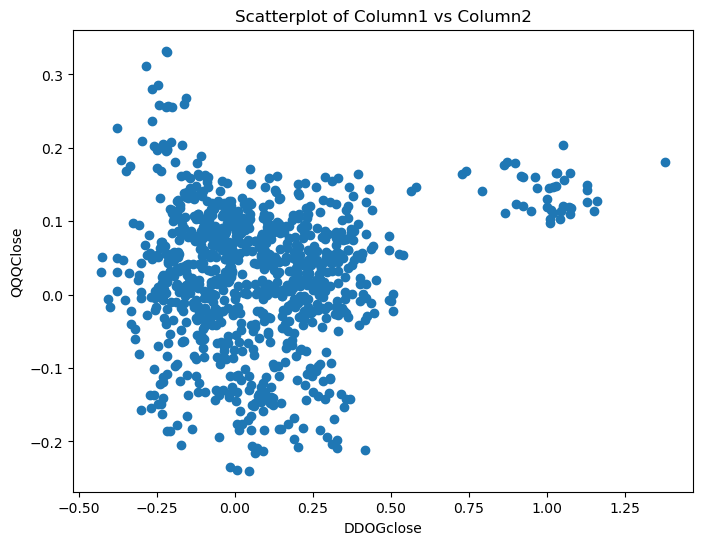

Correlation between QQQ and dfDDOG: 0.1000863052695159

Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

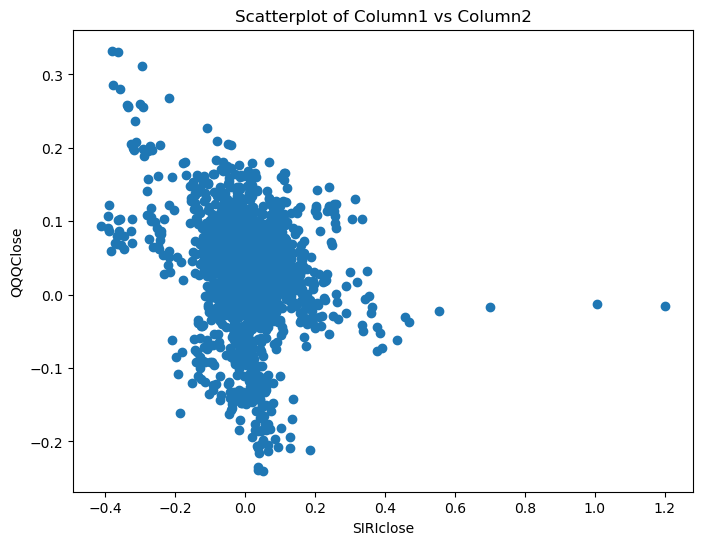

Correlation between QQQ and dfSIRI: -0.2061041651033381

Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

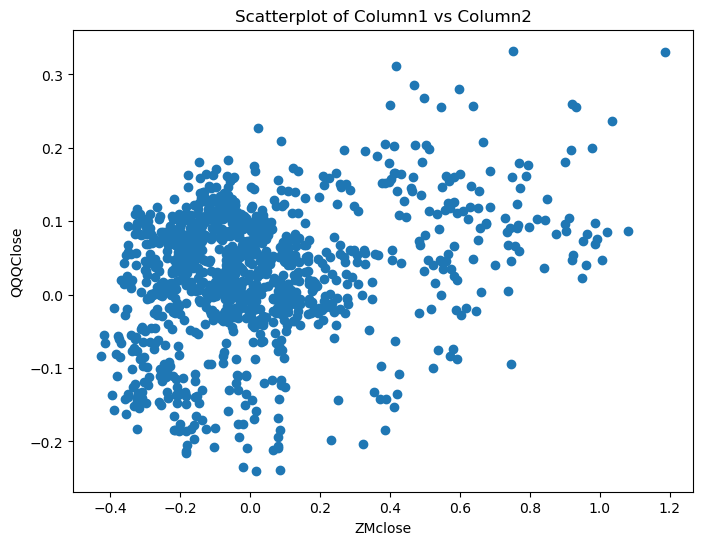

Correlation between QQQ and dfZM: 0.31014688569236926

Pct Change Period is 40


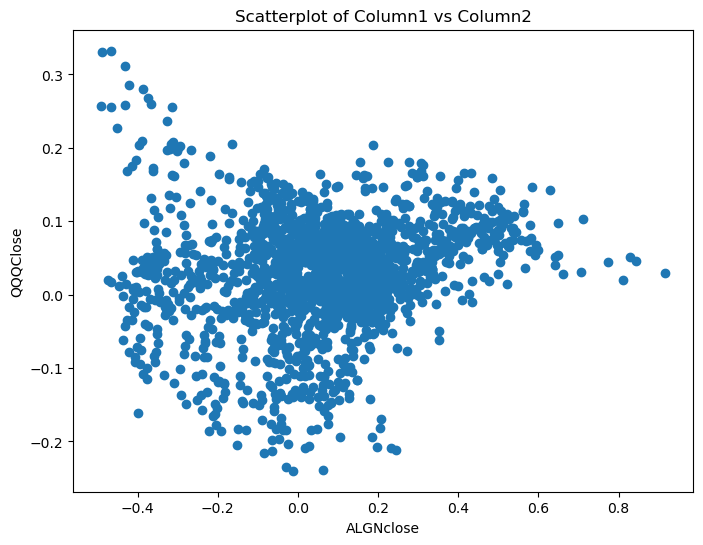

Correlation between QQQ and dfALGN: 0.15223419084213244

Pct Change Period is 40


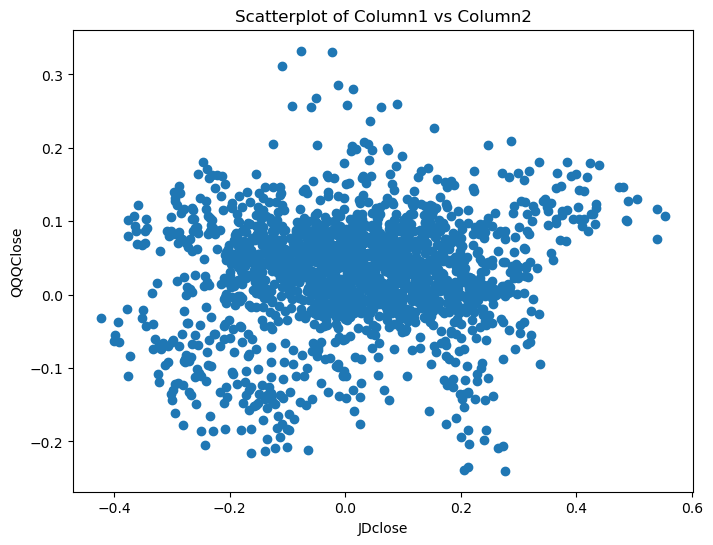

Correlation between QQQ and dfJD: 0.11940291944632285

Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

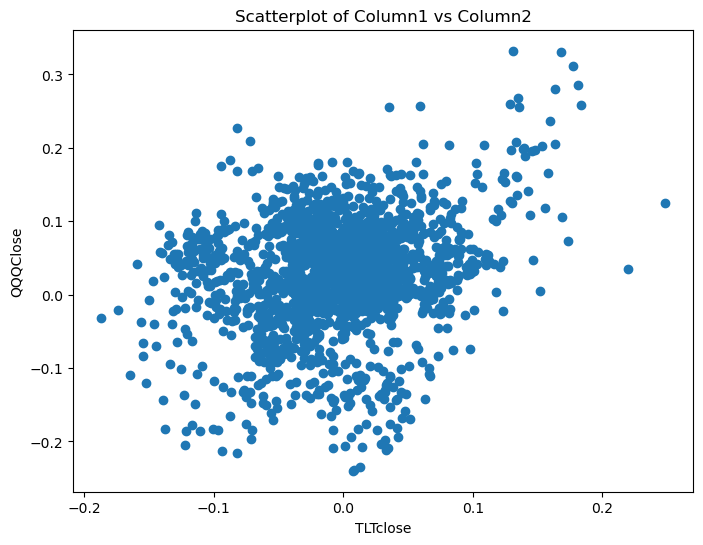

Correlation between QQQ and dfTLT: 0.2421918239141636

Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

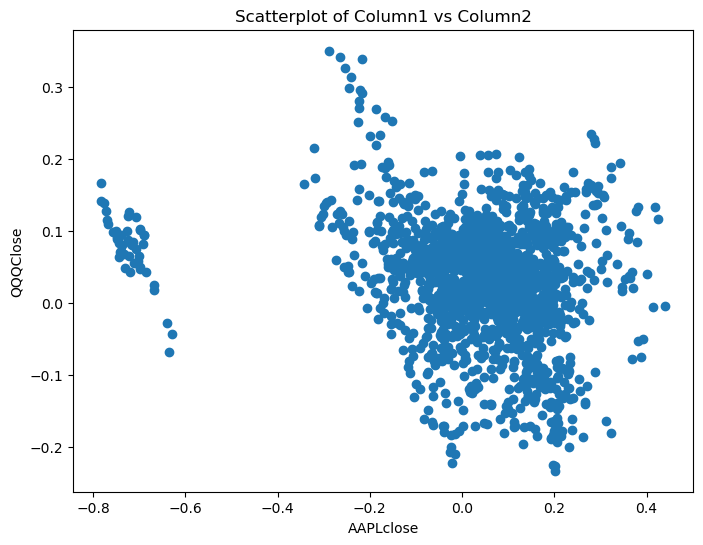

Correlation between QQQ and dfAAPL: -0.22384461187925067

Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

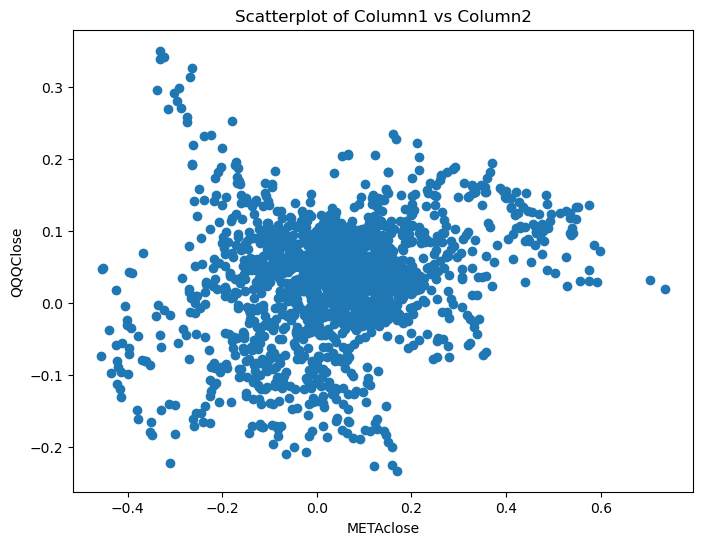

Correlation between QQQ and dfMETA: 0.21581021372580567

Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

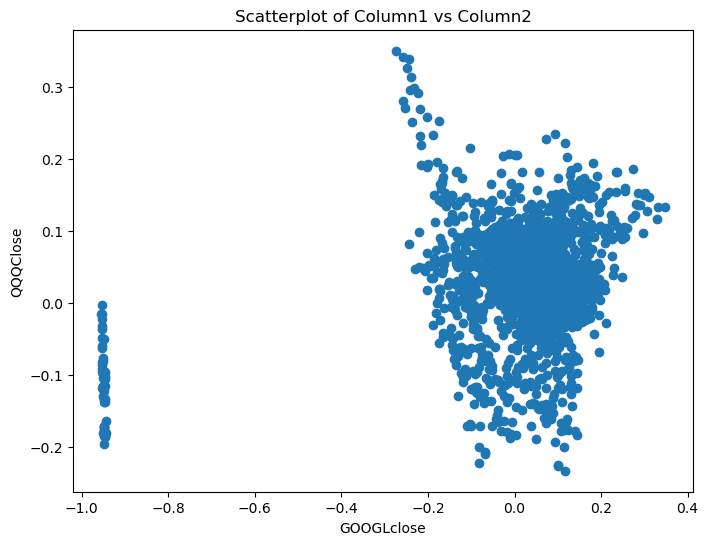

Correlation between QQQ and dfGOOGL: 0.22417222444211254

Pct Change Period is 45


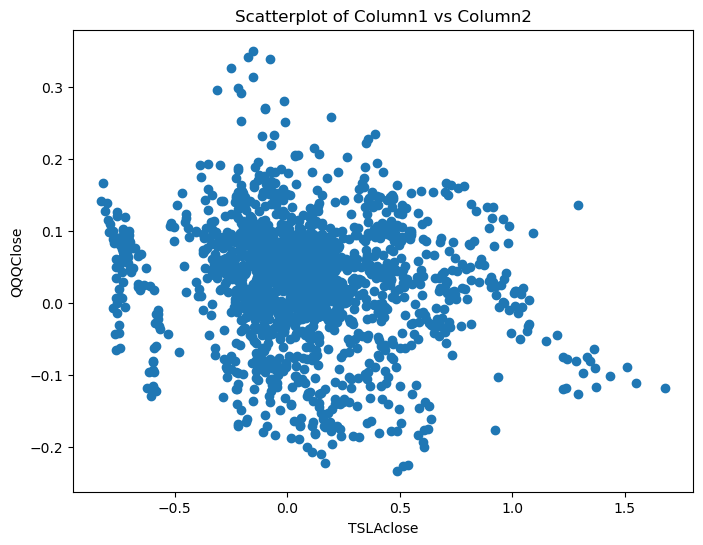

Correlation between QQQ and dfTSLA: -0.1460381725571443

Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

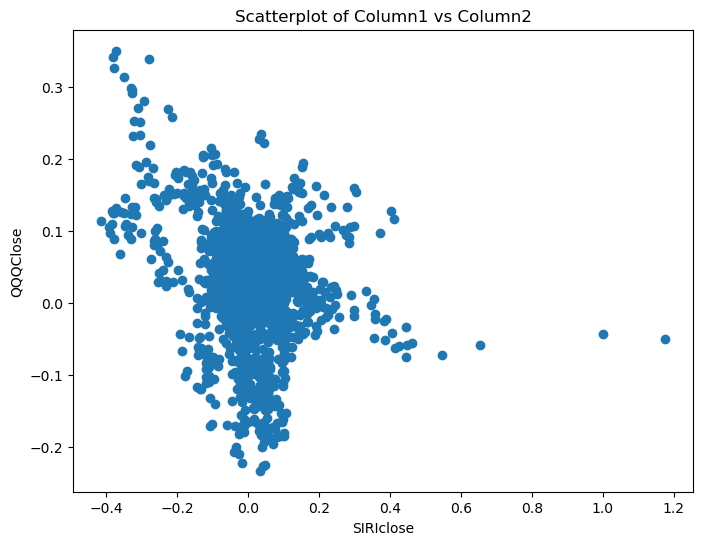

Correlation between QQQ and dfSIRI: -0.24316068537766786

Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

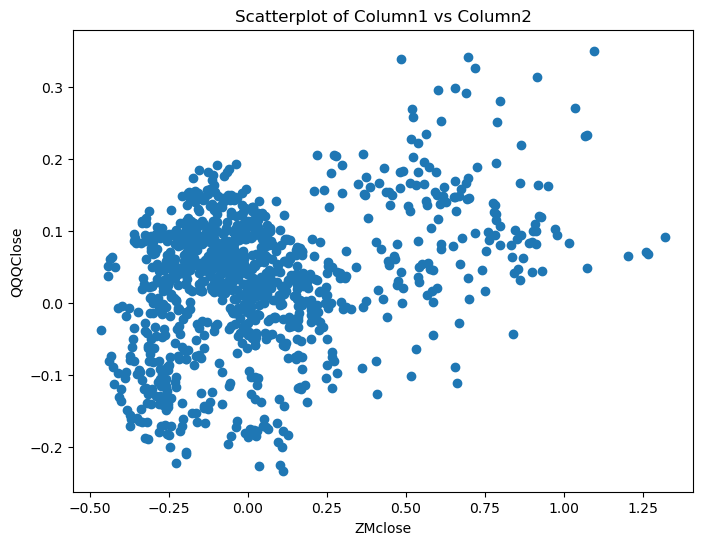

Correlation between QQQ and dfZM: 0.3484827277008808

Pct Change Period is 45


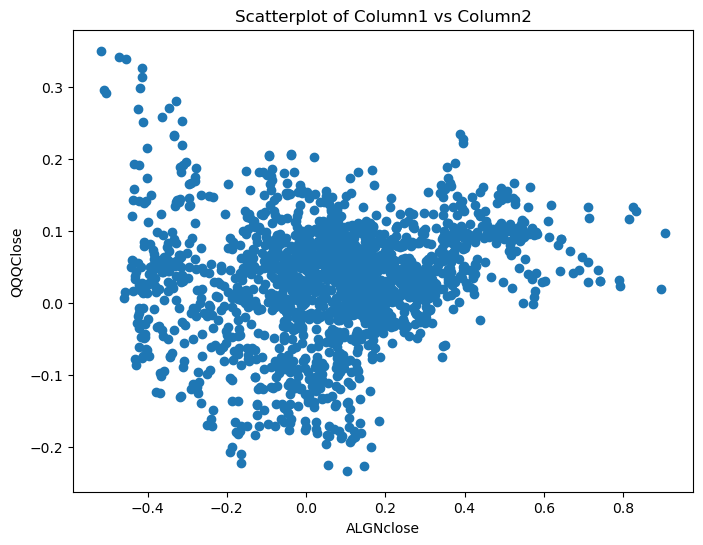

Correlation between QQQ and dfALGN: 0.1306037114172102

Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

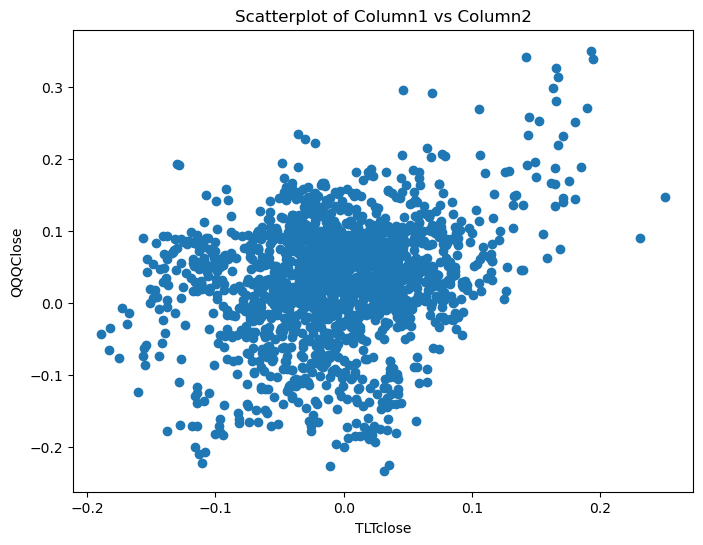

Correlation between QQQ and dfTLT: 0.2598470109973729

Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

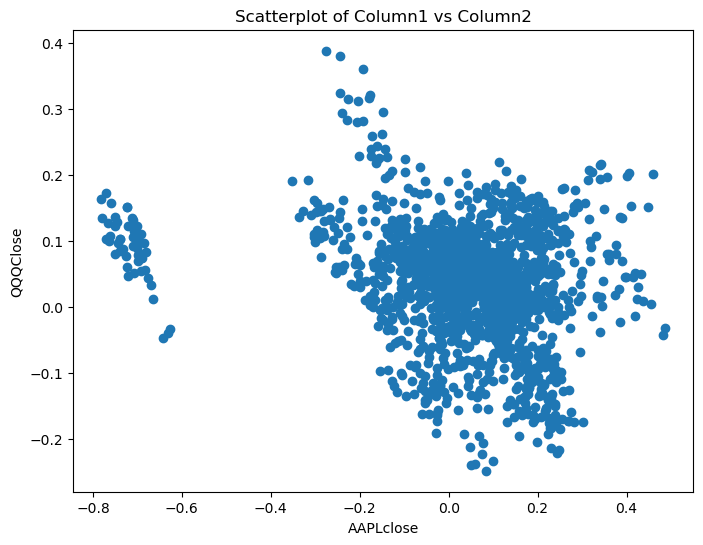

Correlation between QQQ and dfAAPL: -0.2390303321623371

Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

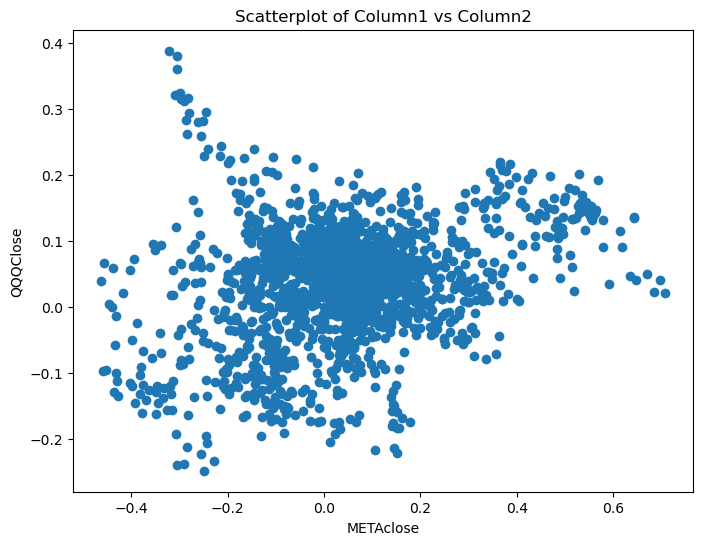

Correlation between QQQ and dfMETA: 0.2546824667620073

Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

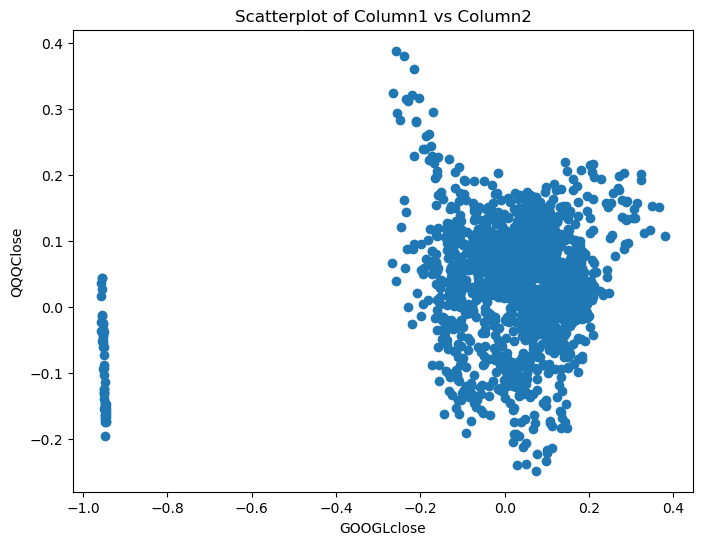

Correlation between QQQ and dfGOOGL: 0.19047180174600137

Pct Change Period is 50


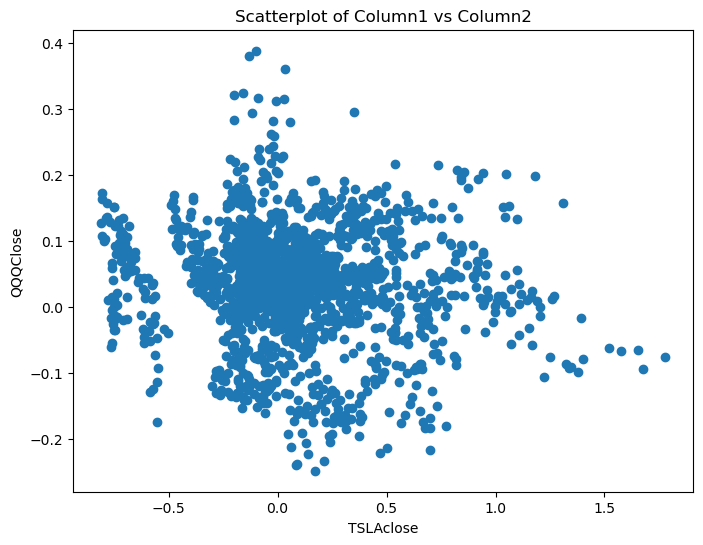

Correlation between QQQ and dfTSLA: -0.12040418788645511

Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

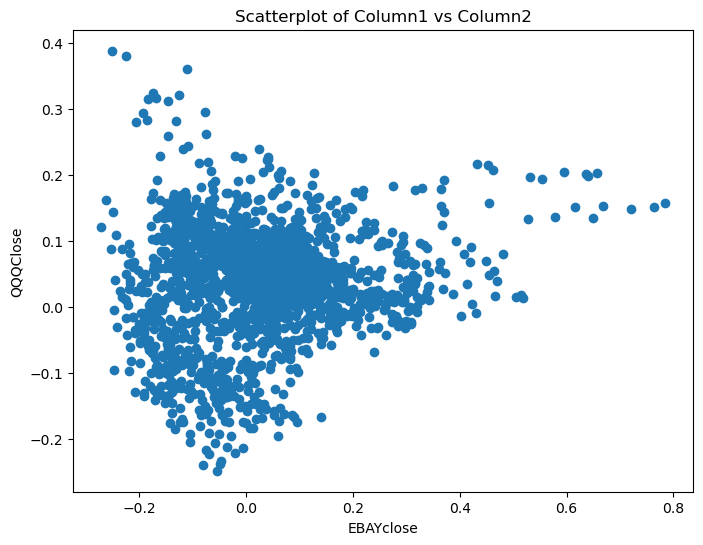

Correlation between QQQ and dfEBAY: 0.11550166903286858

Pct Change Period is 50


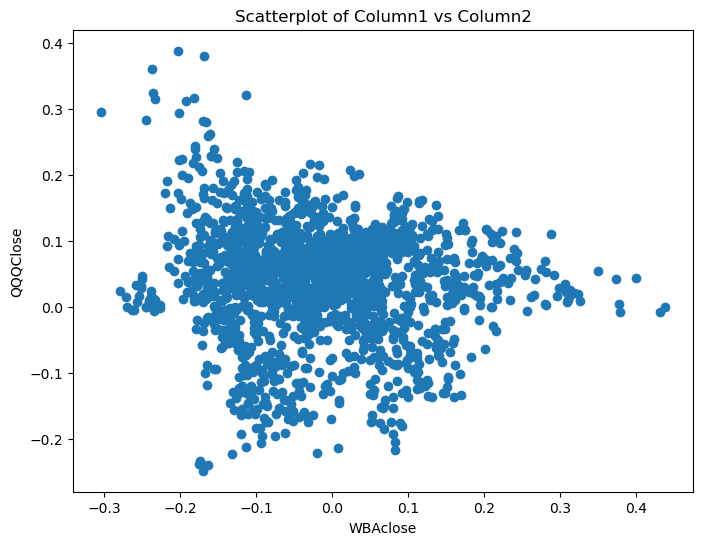

Correlation between QQQ and dfWBA: -0.11479471364680563

Pct Change Period is 50


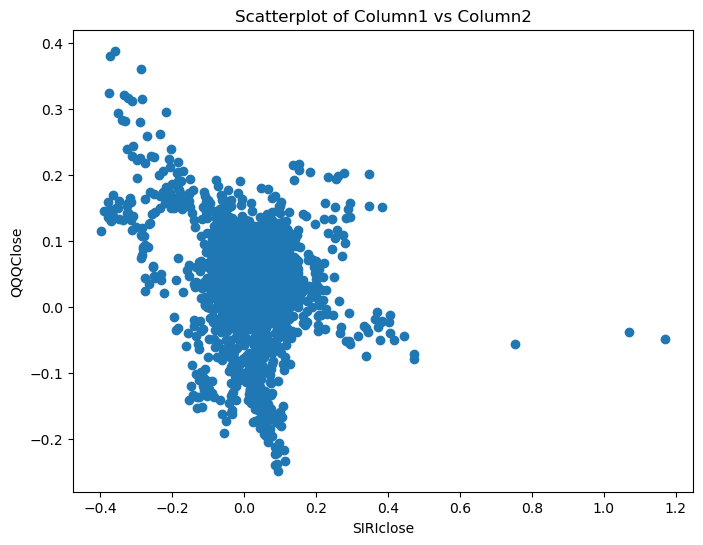

Correlation between QQQ and dfSIRI: -0.26649692154560484

Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

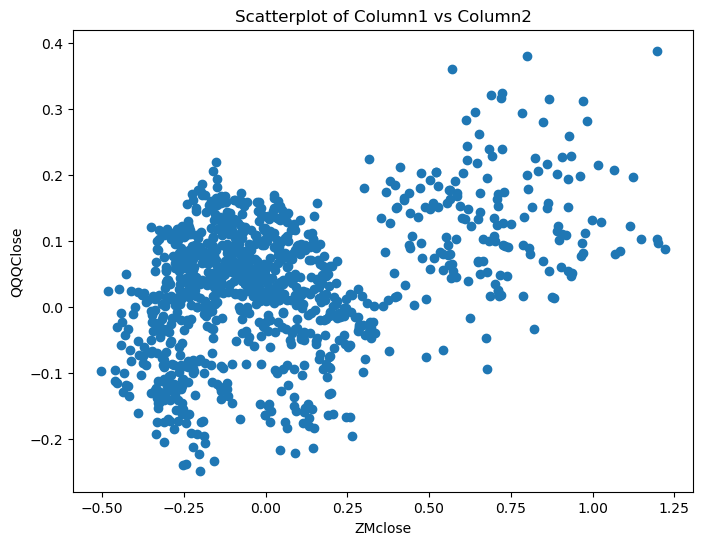

Correlation between QQQ and dfZM: 0.39051483133393944

Pct Change Period is 50


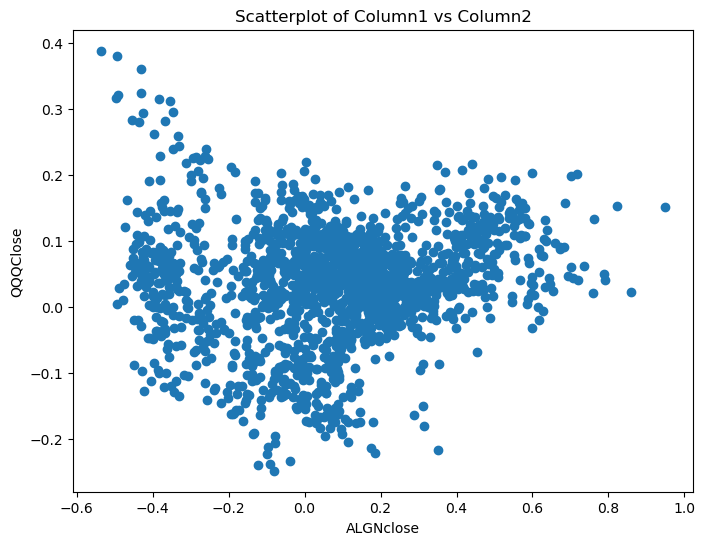

Correlation between QQQ and dfALGN: 0.10480591064676369

Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

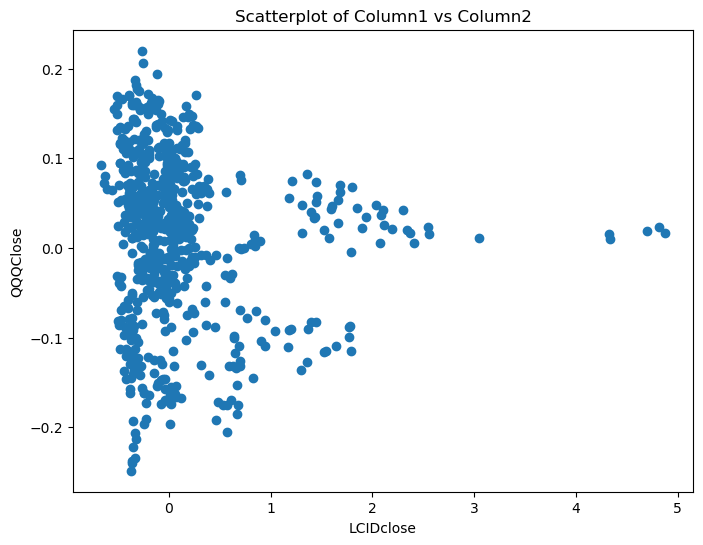

Correlation between QQQ and dfLCID: -0.1022883769781638

Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

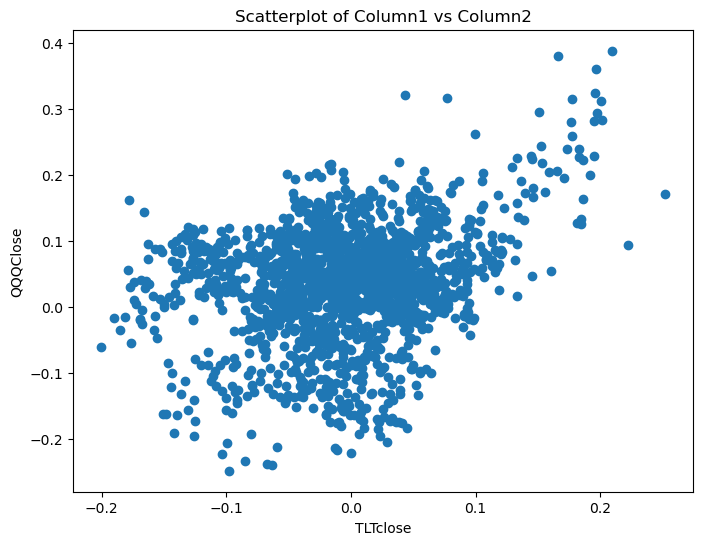

Correlation between QQQ and dfTLT: 0.2799323817927983

Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

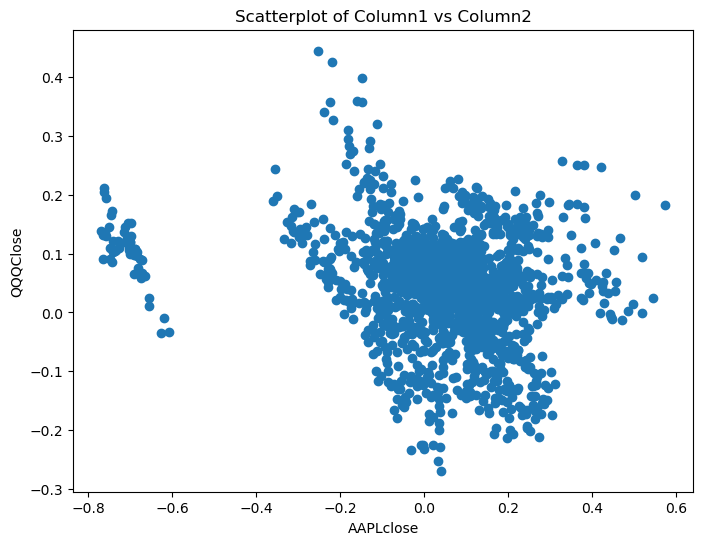

Correlation between QQQ and dfAAPL: -0.25295876983447085

Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

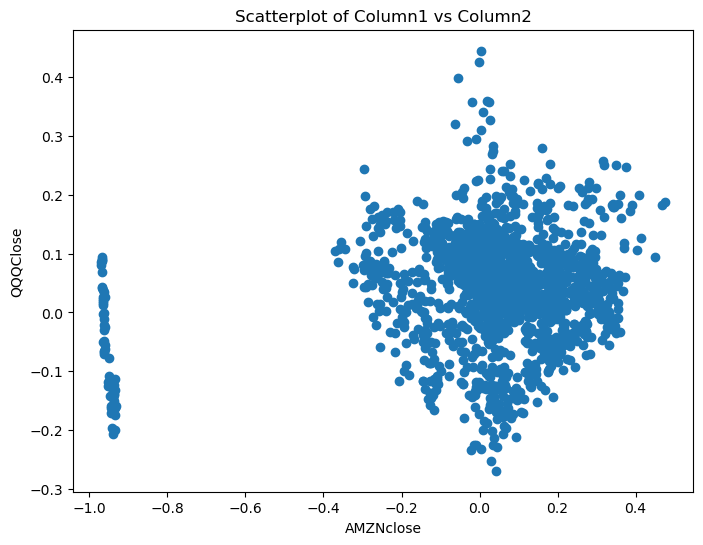

Correlation between QQQ and dfAMZN: 0.13225279837228648

Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

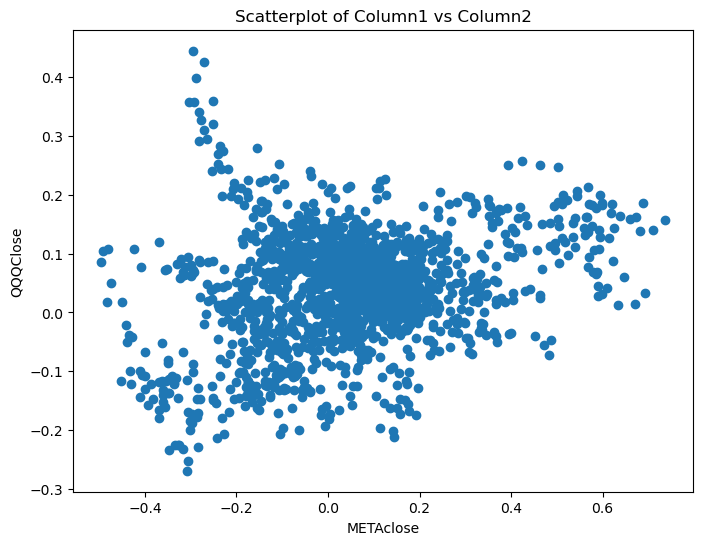

Correlation between QQQ and dfMETA: 0.2530266112675884

Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

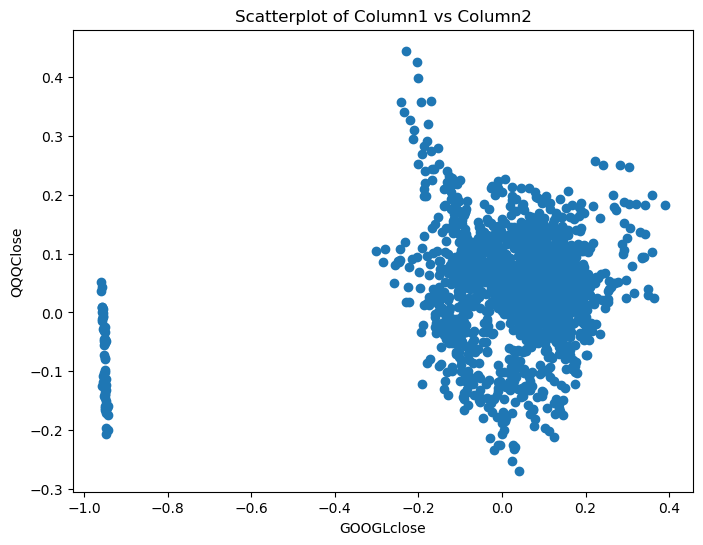

Correlation between QQQ and dfGOOGL: 0.16485283890981162

Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

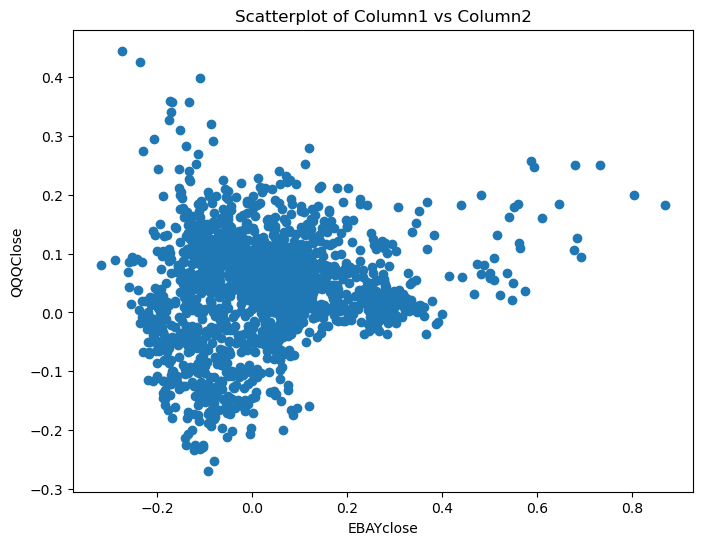

Correlation between QQQ and dfEBAY: 0.14466016714514424

Pct Change Period is 55


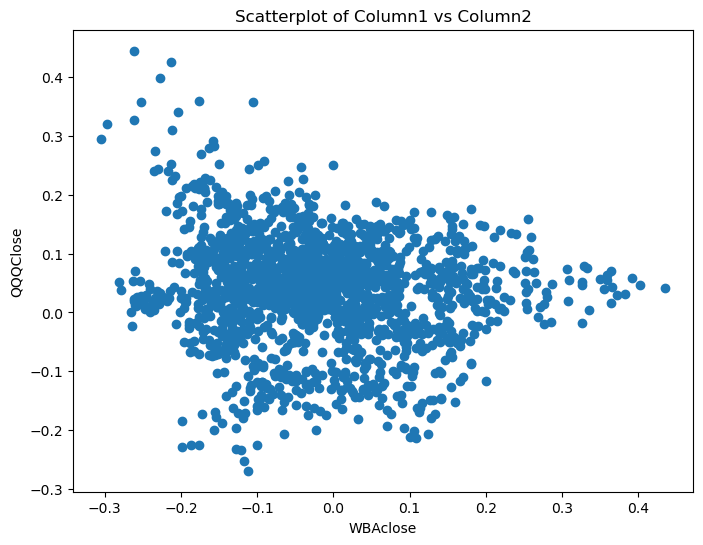

Correlation between QQQ and dfWBA: -0.13212414344851145

Pct Change Period is 55


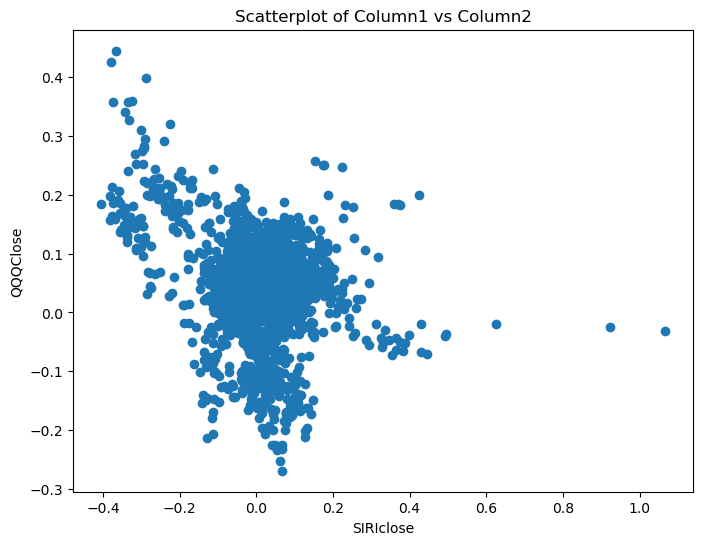

Correlation between QQQ and dfSIRI: -0.2907235823338199

Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

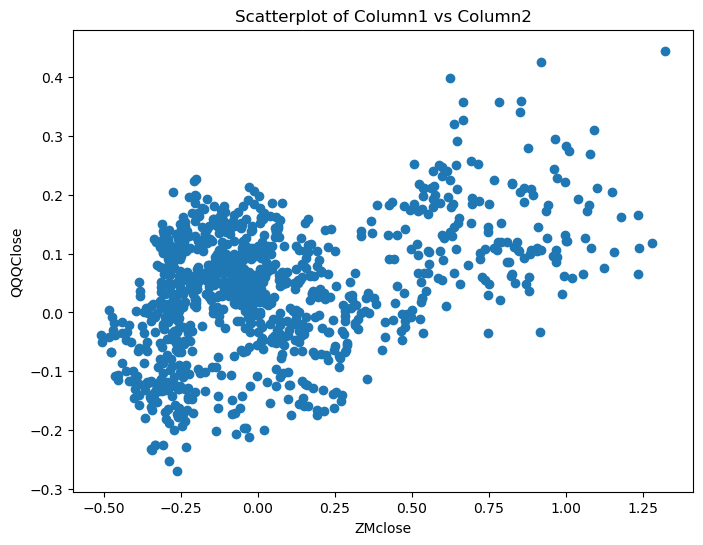

Correlation between QQQ and dfZM: 0.423663335651888

Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

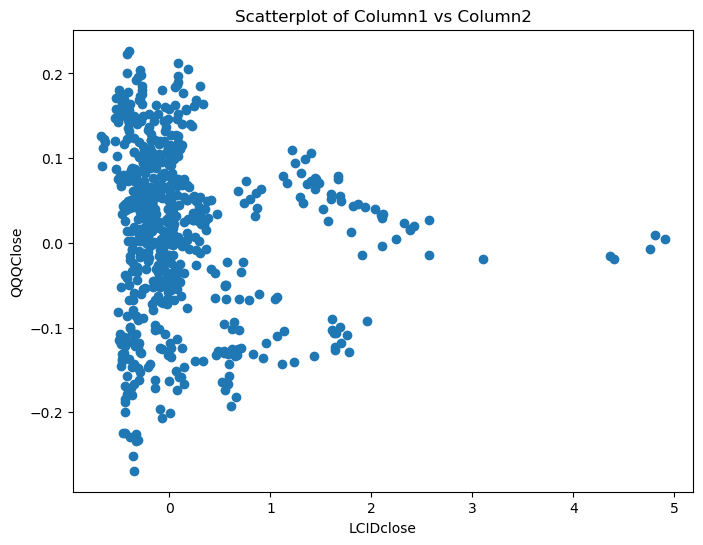

Correlation between QQQ and dfLCID: -0.10296418484767532

Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

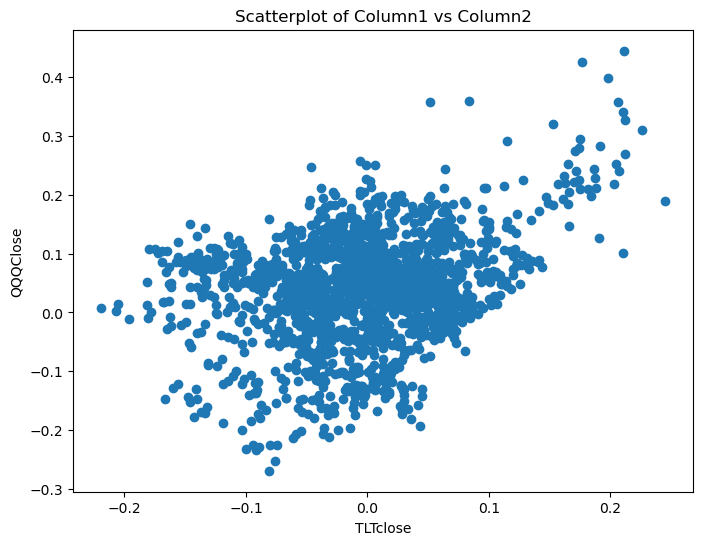

Correlation between QQQ and dfTLT: 0.2969471430221885

Pct Change Period is 55


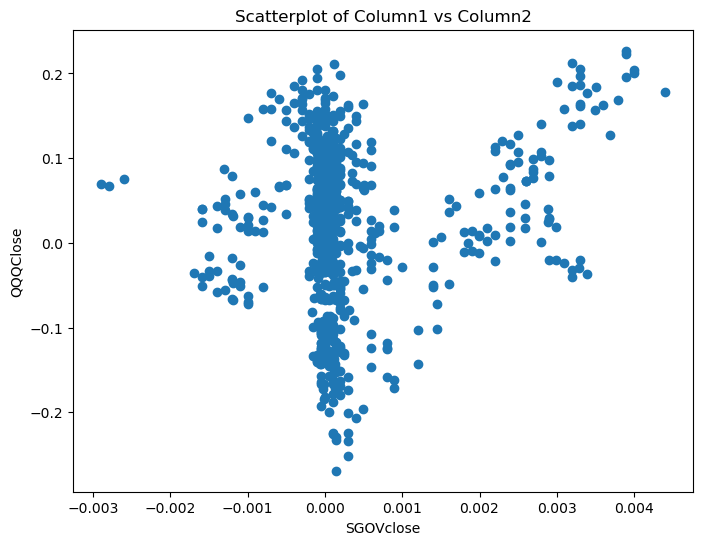

Correlation between QQQ and dfSGOV: 0.16036480868035177

Pct Change Period is 60


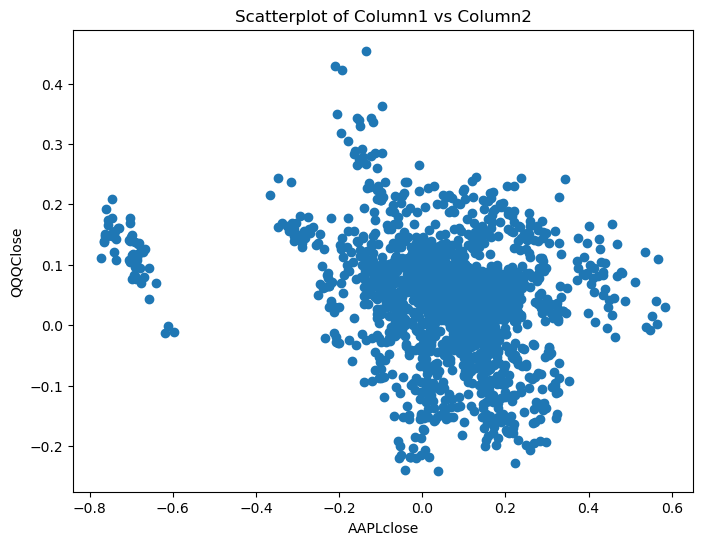

Correlation between QQQ and dfAAPL: -0.27442770873446615

Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

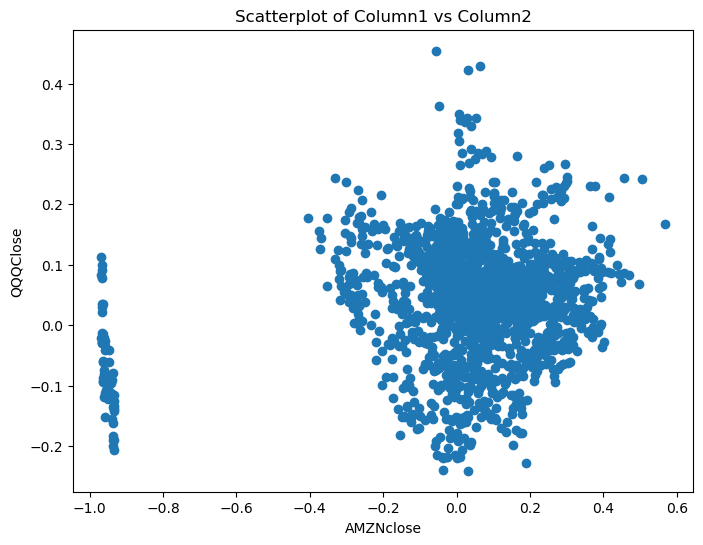

Correlation between QQQ and dfAMZN: 0.1488973854602722

Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

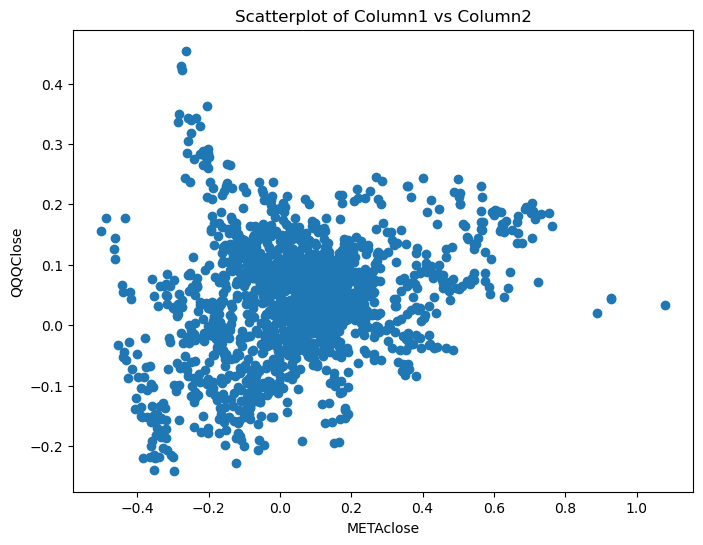

Correlation between QQQ and dfMETA: 0.25062056091541923

Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

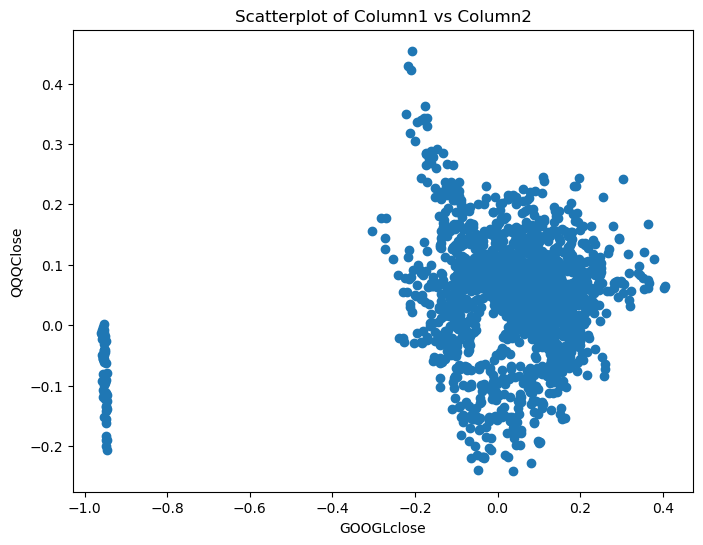

Correlation between QQQ and dfGOOGL: 0.15616606768475694

Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

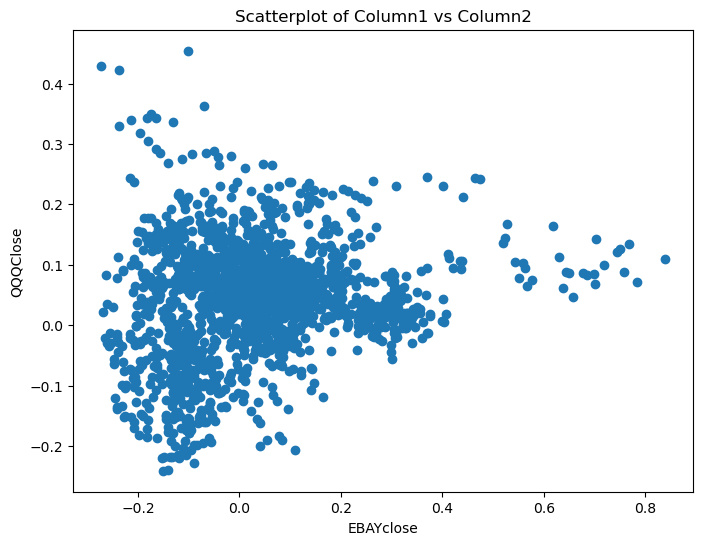

Correlation between QQQ and dfEBAY: 0.15631795784075547

Pct Change Period is 60


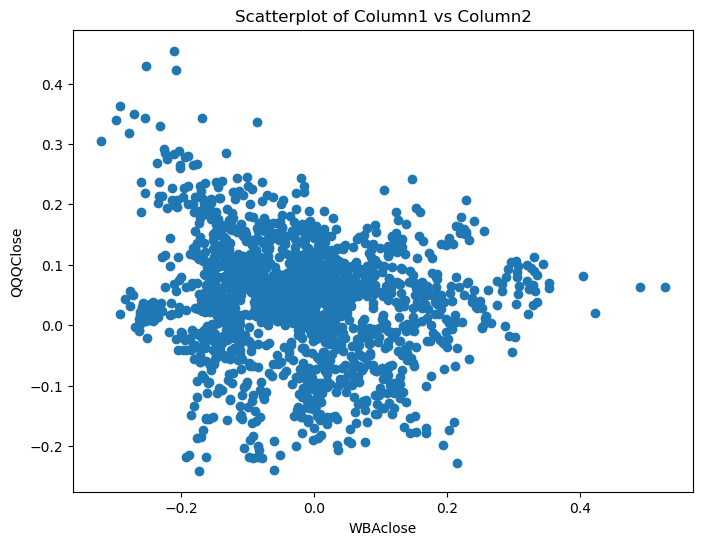

Correlation between QQQ and dfWBA: -0.14483315933190213

Pct Change Period is 60


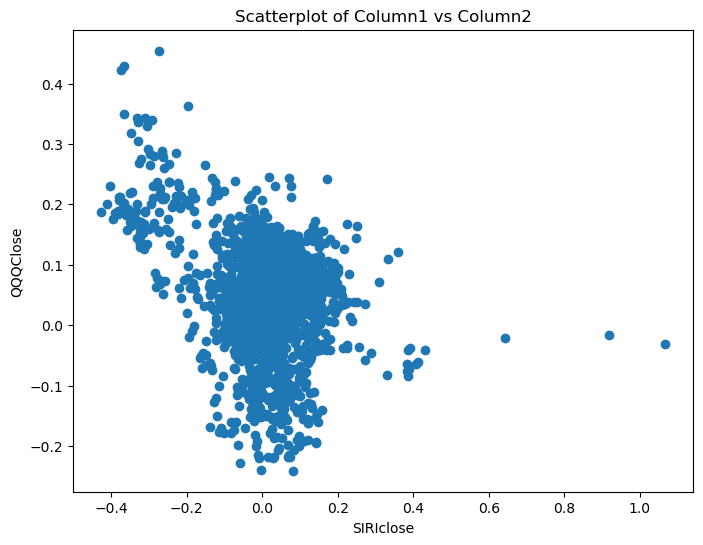

Correlation between QQQ and dfSIRI: -0.3065562346132161

Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

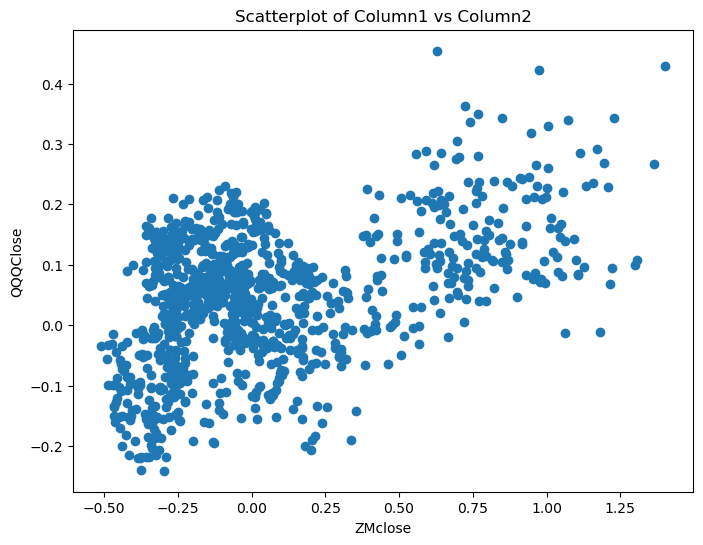

Correlation between QQQ and dfZM: 0.4611488703139786

Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

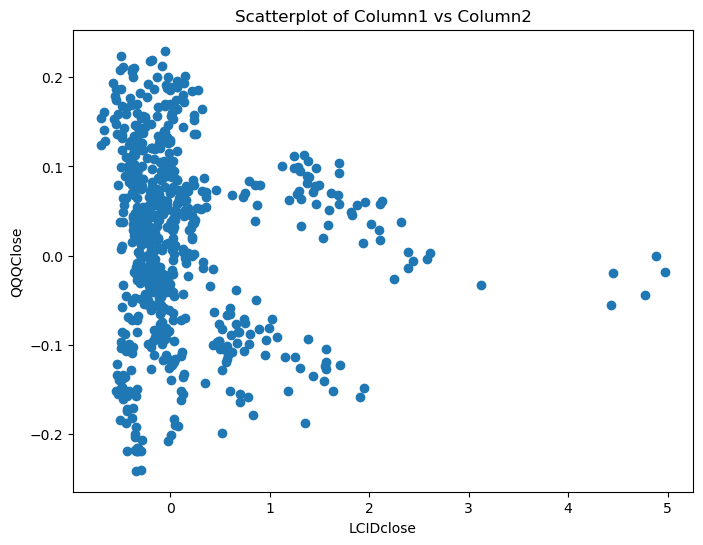

Correlation between QQQ and dfLCID: -0.108189269675176

Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

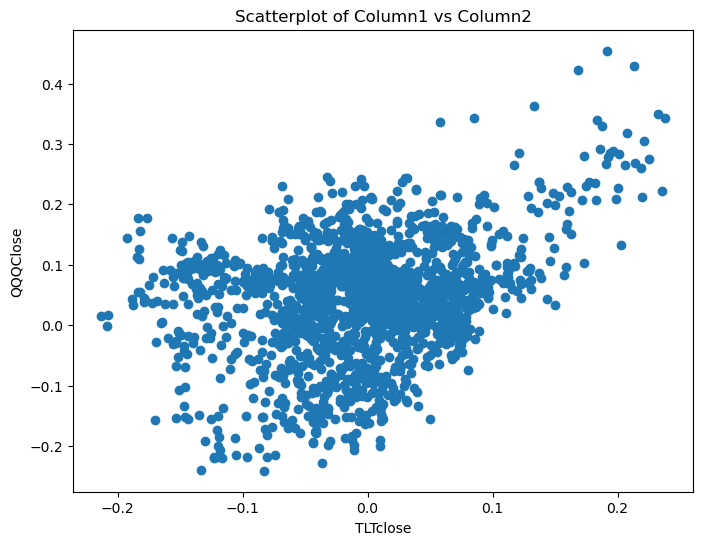

Correlation between QQQ and dfTLT: 0.2969058880424112

Pct Change Period is 60


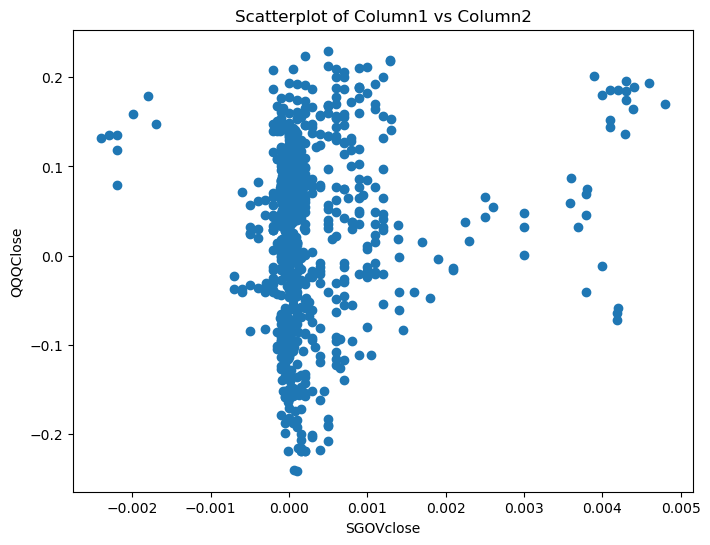

Correlation between QQQ and dfSGOV: 0.13806403144692922



In [10]:
import pandas as pd
import matplotlib.pyplot as plt
#import seaborn as sns

# Assuming they are 5 DataFrames named df1, df2, df3, df4, and df5
# Store them in a dictionary
dataframes =dctStockDfs

display(dfYvar)

# Create scatterplots and correlation matrices

for i in range(5,61,5):
    for key1, df1 in dctStockDfs.items():
        #display(df1.columns)
        #display(df2.columns)

        #if key1 != key2:
        dfCorr=pd.concat([df1,dfYvar],join='inner',axis=1)
        #print(dfCorr.dtypes())
        dfCorr=dfCorr.pct_change(i)
        dfCorr.iloc[:,1]=dfCorr.iloc[:,1].shift(-i)
        dfCorr=dfCorr.dropna()
        #display(dfCorr)
        # Create scatterplot
        plt.figure(figsize=(8, 6))
        plt.scatter(dfCorr.iloc[:,0], dfCorr.iloc[:,1])
        plt.title('Scatterplot of Column1 vs Column2')
        plt.xlabel(dfCorr.columns[0])
        plt.ylabel('QQQClose')


        # Calculate correlation matrix
        corr = dfCorr.iloc[:,1].corr(dfCorr.iloc[:,0])
        if abs(corr)>=0.1:
            print(f'Pct Change Period is {i}')
            plt.show()
            print(f'Correlation between QQQ and {key1}: {corr}\n')
        else:
            plt.close()
            plt.clf()
        del(dfCorr)


#### From the correlation plots above, we can see that over a percentage change period of about 55 days, /n
##### APPL is negatively correlated with the QQQ
##### AMZN is positively barely correlated with the QQQ
##### META is positively correlated with the QQQ
##### GOOGL is positively fairly corirlyrelated with the QQQ
##### EBAY is positively fairly correlated with the QQQ
##### WBA is negatively fairly correlated with the QQQ
##### SIRI is  negatively correlated with the QQQ
##### ZM is positely highly correlated with the QQQ
##### LCID is barely negatively correlated with the QQQ
##### TLT positively highly correlated with the QQQ
##### SGOV is positively correlated with the QQQ 

Pct Change Period is 5


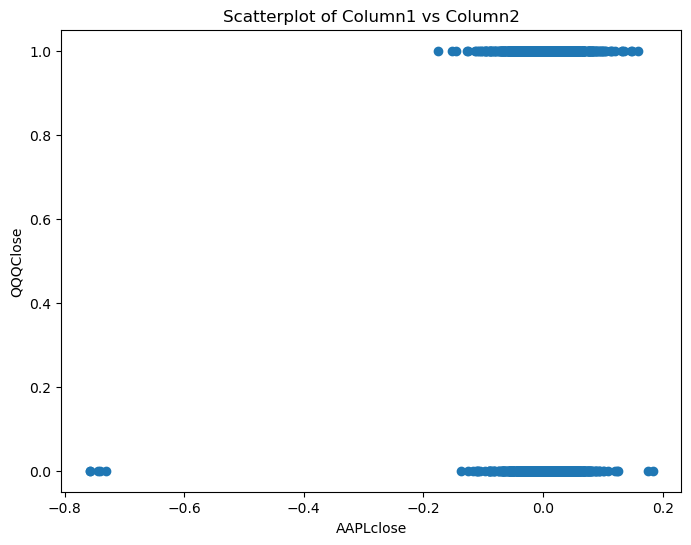

Point-Biserial Correlation Coefficient: 0.06424839498885929
P-value: 0.004423744748113987
Pct Change Period is 5


<Figure size 640x480 with 0 Axes>

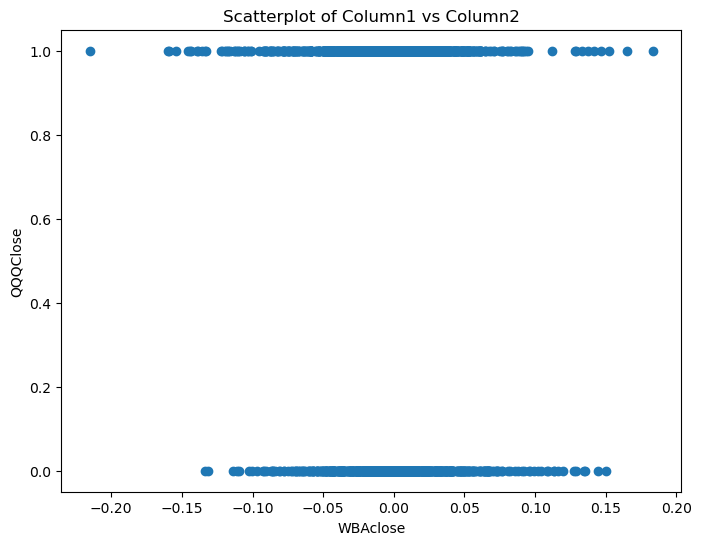

Point-Biserial Correlation Coefficient: -0.07315969339072377
P-value: 0.001186843561491089
Pct Change Period is 5


<Figure size 640x480 with 0 Axes>

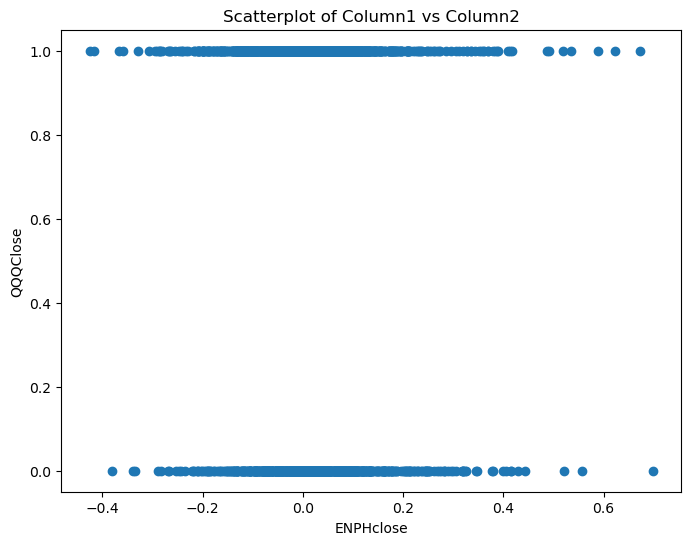

Point-Biserial Correlation Coefficient: -0.07563010488958799
P-value: 0.0008028588396212509
Pct Change Period is 10


<Figure size 640x480 with 0 Axes>

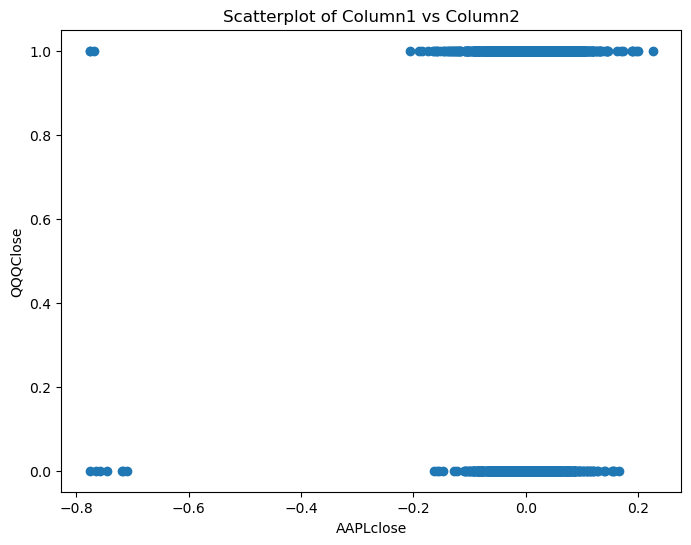

Point-Biserial Correlation Coefficient: 0.10760804638733243
P-value: 1.8993092336537518e-06
Pct Change Period is 10


<Figure size 640x480 with 0 Axes>

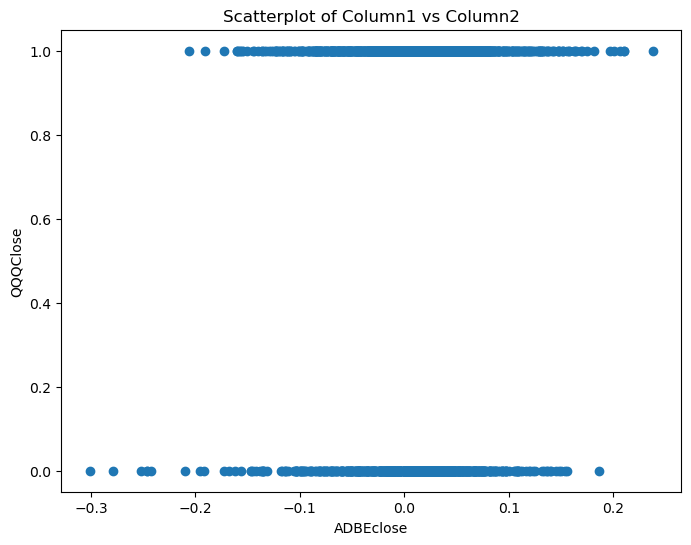

Point-Biserial Correlation Coefficient: 0.06644486283382896
P-value: 0.003322148717718241
Pct Change Period is 10


<Figure size 640x480 with 0 Axes>

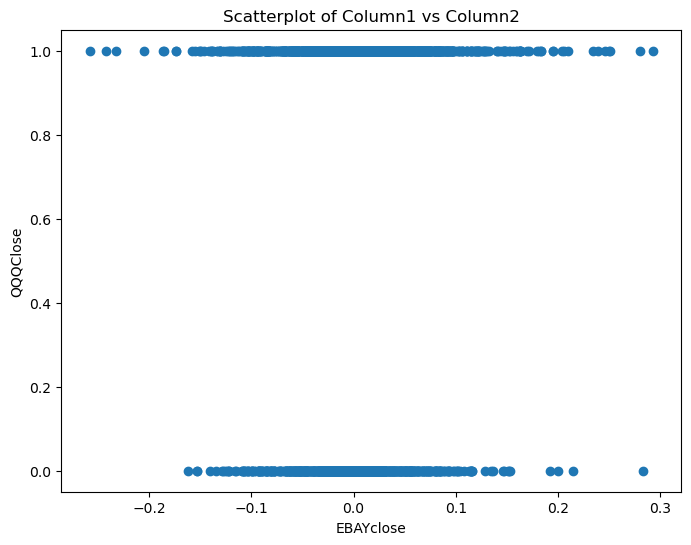

Point-Biserial Correlation Coefficient: 0.0688486494687661
P-value: 0.00234453952515898
Pct Change Period is 10


<Figure size 640x480 with 0 Axes>

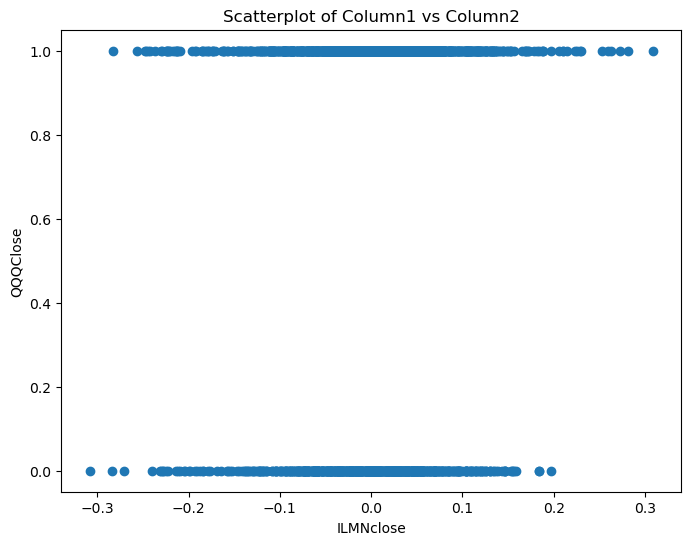

Point-Biserial Correlation Coefficient: 0.06257891411976958
P-value: 0.005691279698239362
Pct Change Period is 10


<Figure size 640x480 with 0 Axes>

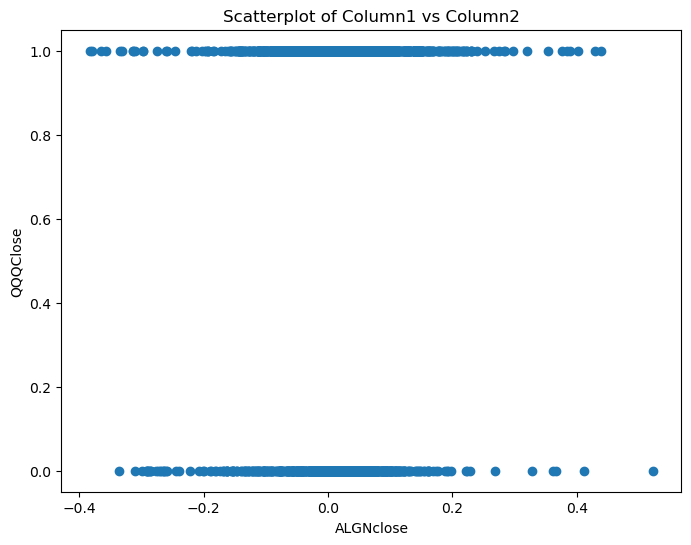

Point-Biserial Correlation Coefficient: 0.0649621629509455
P-value: 0.004097190694677586
Pct Change Period is 10


<Figure size 640x480 with 0 Axes>

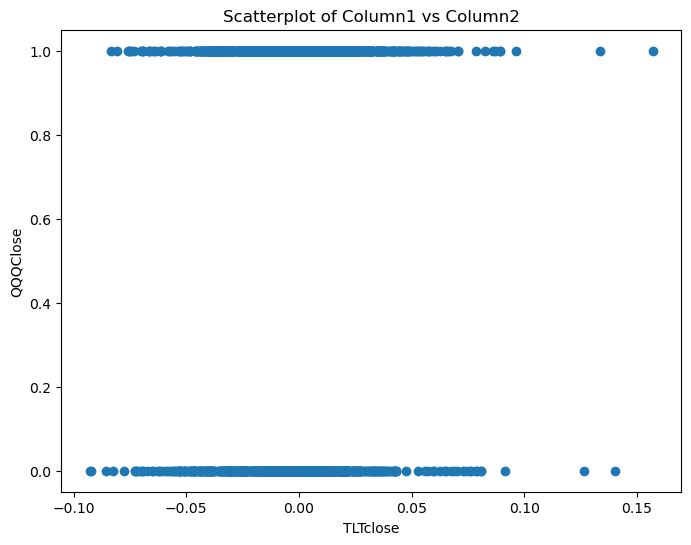

Point-Biserial Correlation Coefficient: 0.08235992577427732
P-value: 0.0002708384171800567
Pct Change Period is 10


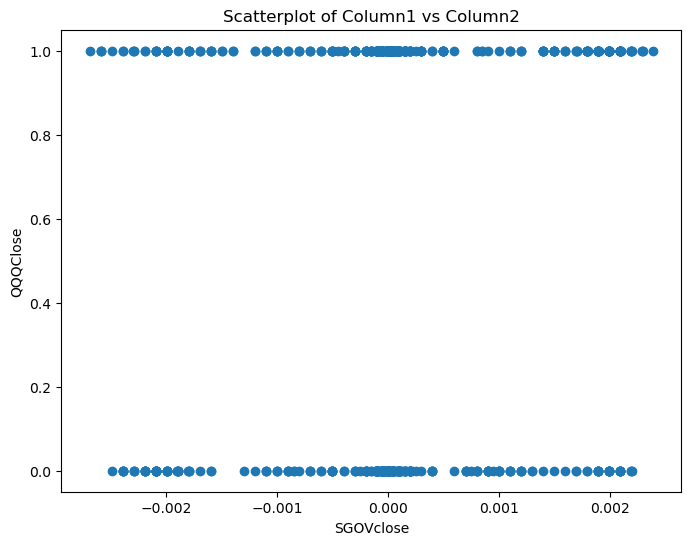

Point-Biserial Correlation Coefficient: 0.10924748044174326
P-value: 0.0014796912000410813
Pct Change Period is 15


<Figure size 640x480 with 0 Axes>

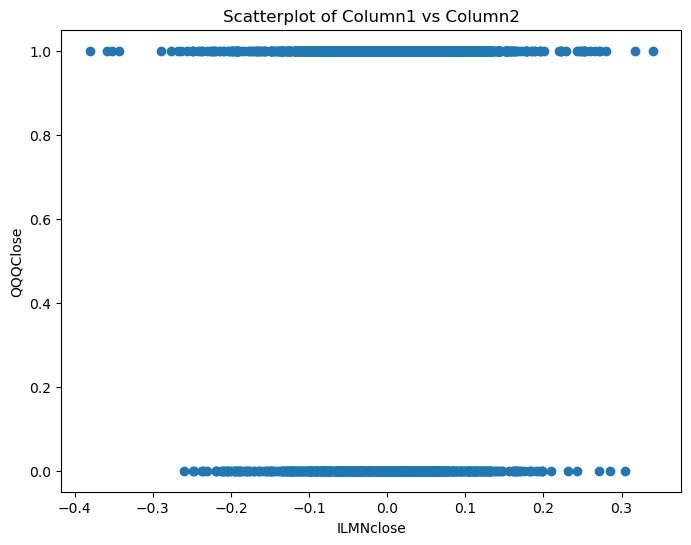

Point-Biserial Correlation Coefficient: 0.07357792370650064
P-value: 0.0011789857096755865
Pct Change Period is 15


<Figure size 640x480 with 0 Axes>

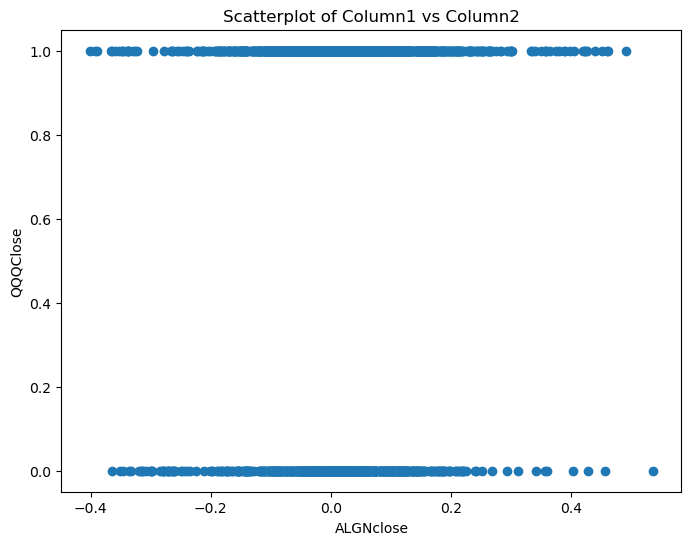

Point-Biserial Correlation Coefficient: 0.06958607762928799
P-value: 0.0021587011325692866
Pct Change Period is 15


<Figure size 640x480 with 0 Axes>

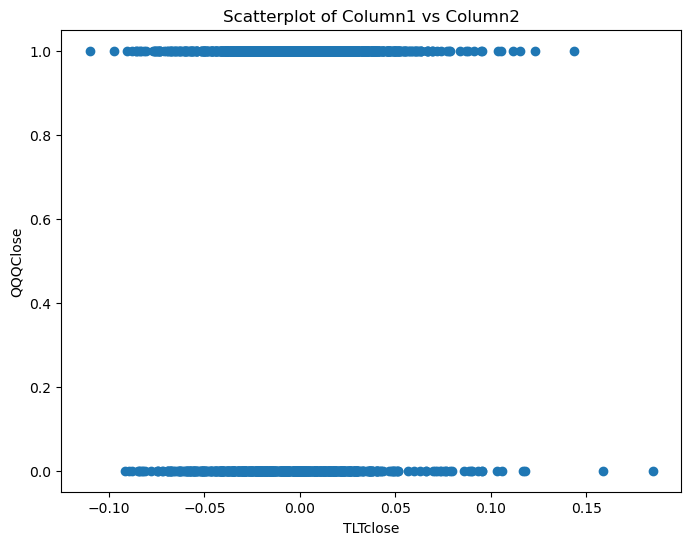

Point-Biserial Correlation Coefficient: 0.08109303528794258
P-value: 0.00034850808671657156
Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

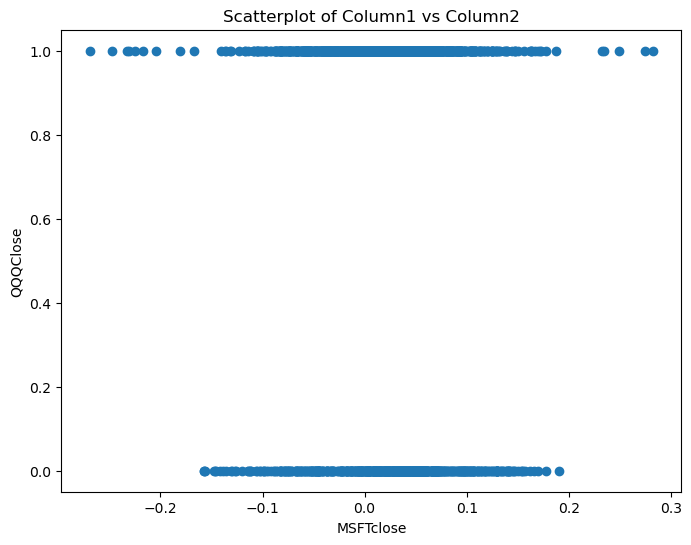

Point-Biserial Correlation Coefficient: -0.05876272233078306
P-value: 0.00980081536806088
Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

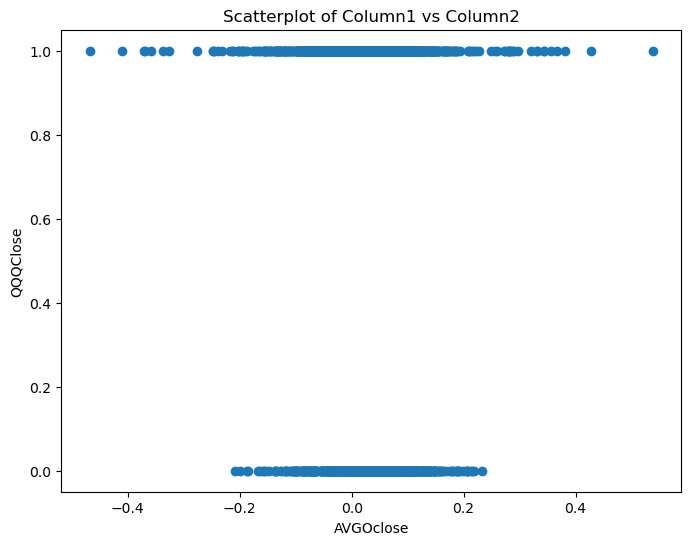

Point-Biserial Correlation Coefficient: -0.07110837965311631
P-value: 0.0017680370803961733
Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

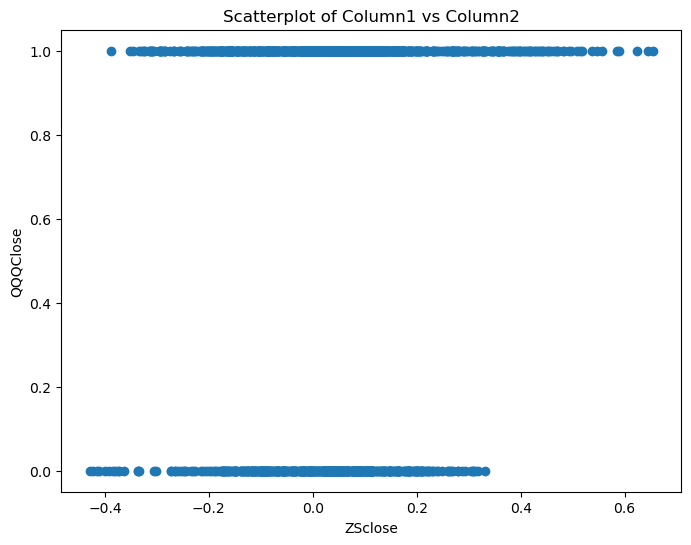

Point-Biserial Correlation Coefficient: 0.12080459632142049
P-value: 6.95007365081254e-06
Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

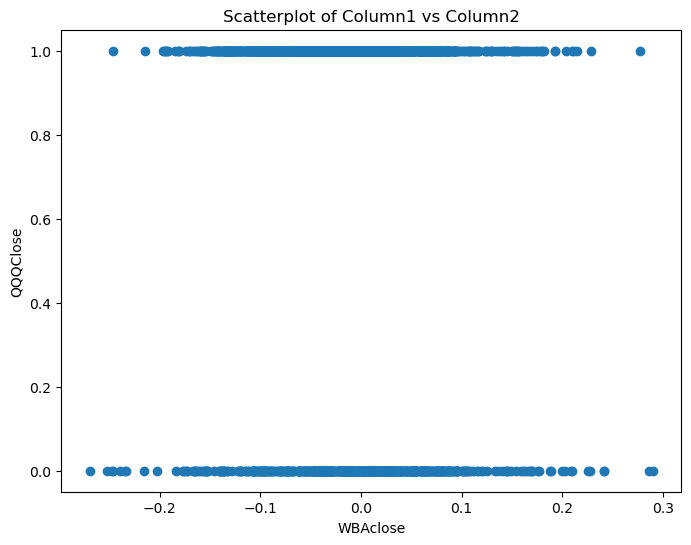

Point-Biserial Correlation Coefficient: -0.06961777574425063
P-value: 0.0022063052268062548
Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

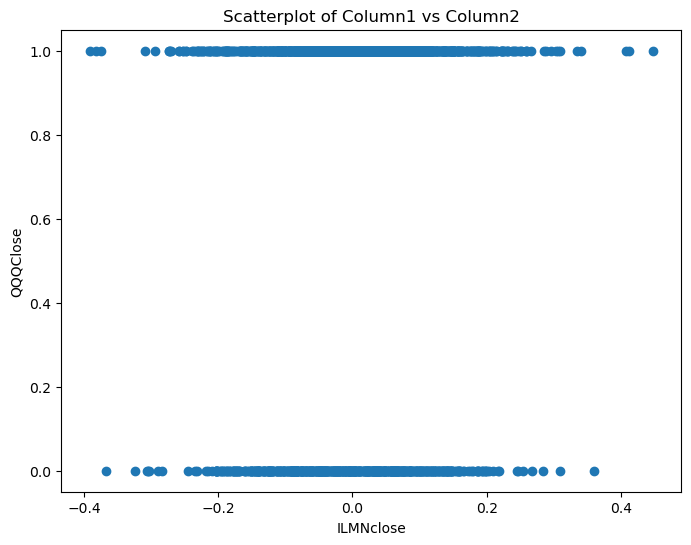

Point-Biserial Correlation Coefficient: 0.0766694004586529
P-value: 0.0007465781277534126
Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

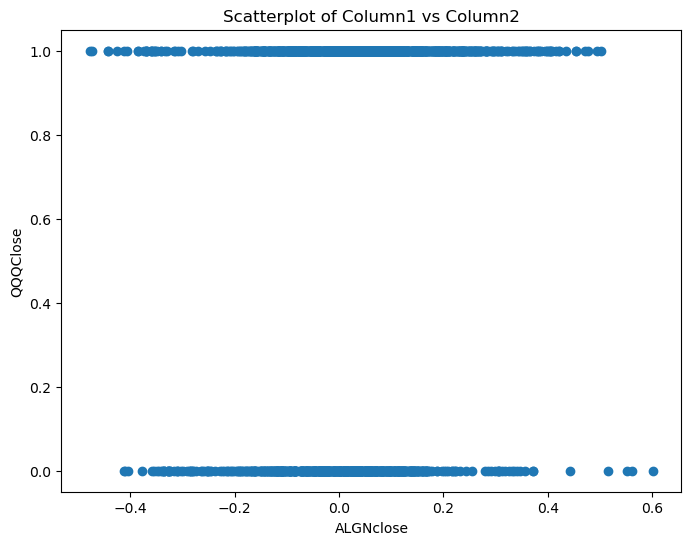

Point-Biserial Correlation Coefficient: 0.1358368514757868
P-value: 2.0596668582833656e-09
Pct Change Period is 20


<Figure size 640x480 with 0 Axes>

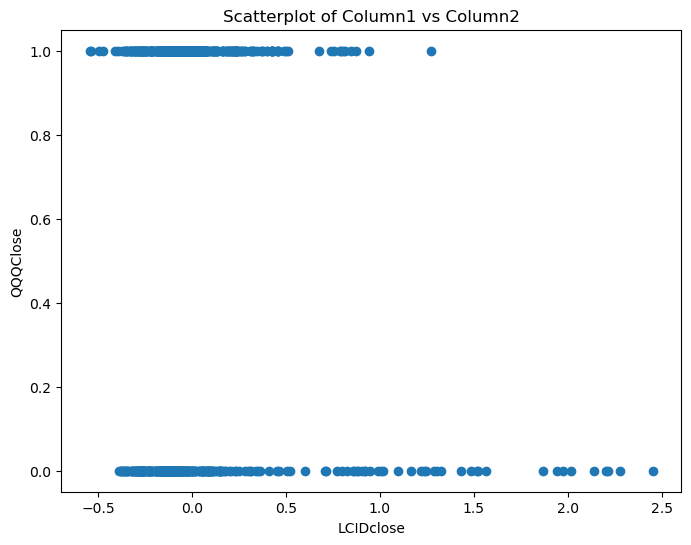

Point-Biserial Correlation Coefficient: -0.12661320759036257
P-value: 0.000532176916095124
Pct Change Period is 20


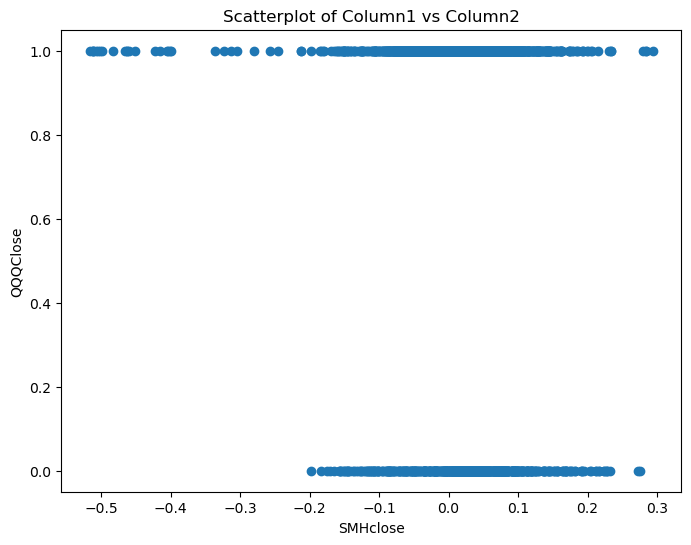

Point-Biserial Correlation Coefficient: -0.09122207656948639
P-value: 5.960696987008691e-05
Pct Change Period is 20


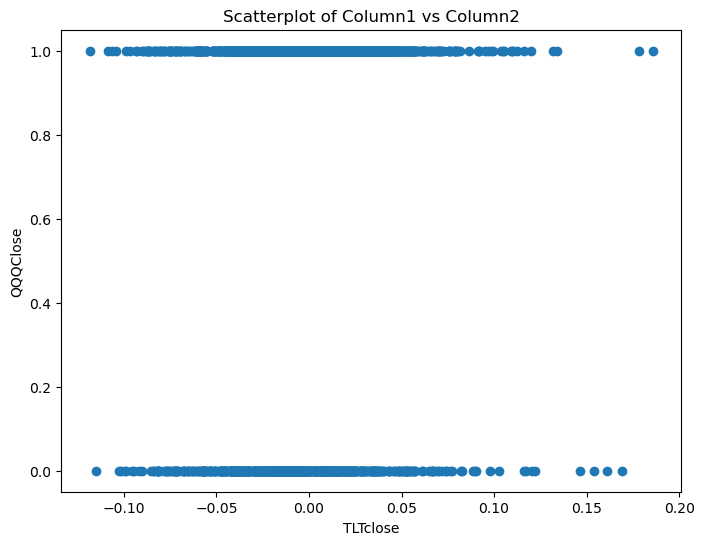

Point-Biserial Correlation Coefficient: 0.08927624488559603
P-value: 8.55182809358297e-05
Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

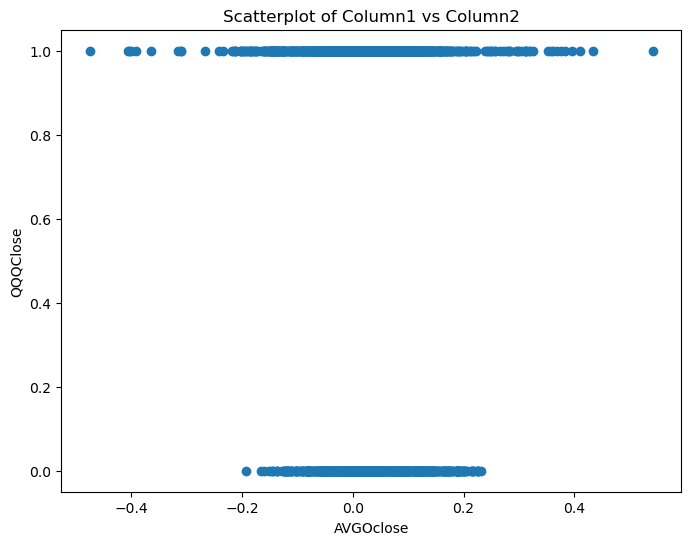

Point-Biserial Correlation Coefficient: -0.07438296599781796
P-value: 0.0011041656832855326
Pct Change Period is 25


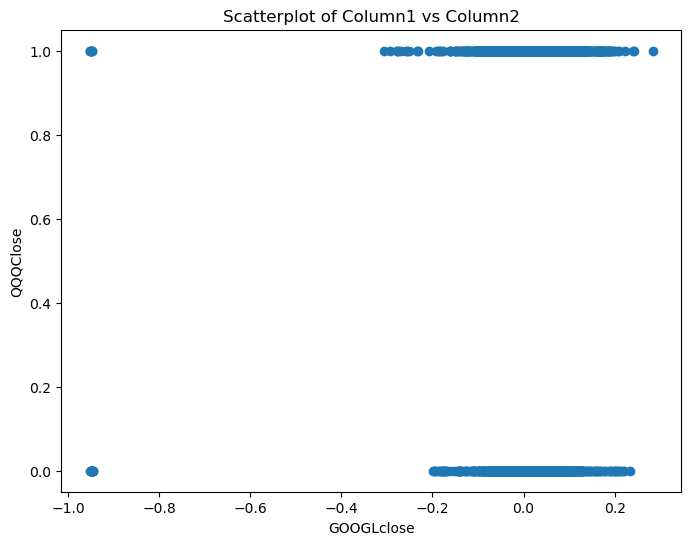

Point-Biserial Correlation Coefficient: 0.1031302402390227
P-value: 5.919161939933249e-06
Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

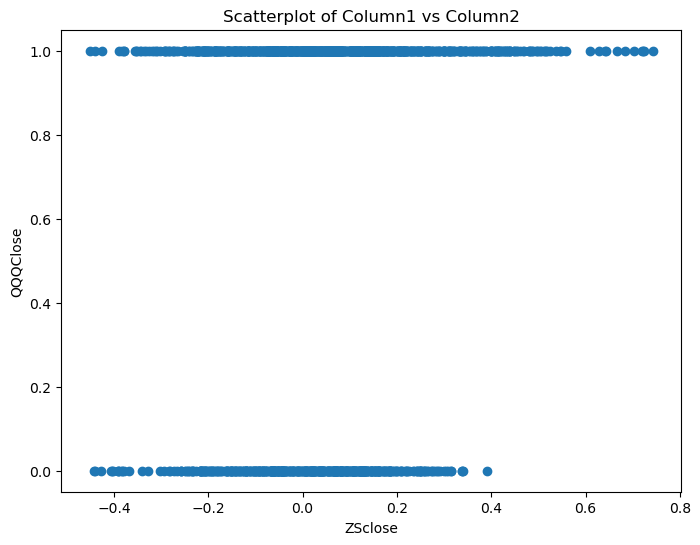

Point-Biserial Correlation Coefficient: 0.16323037617342612
P-value: 1.2763506432394982e-09
Pct Change Period is 25


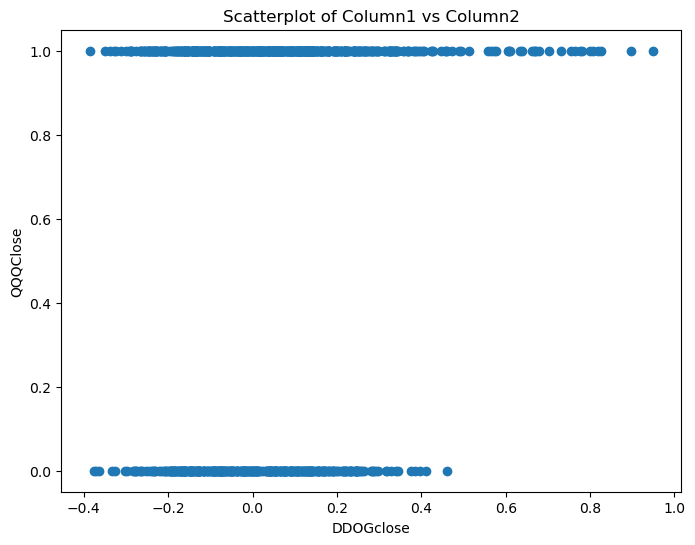

Point-Biserial Correlation Coefficient: 0.15576270886840746
P-value: 8.771488358579216e-07
Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

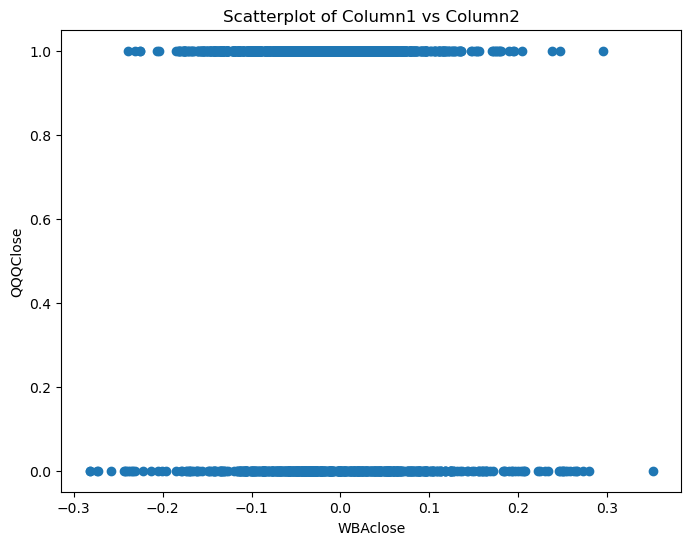

Point-Biserial Correlation Coefficient: -0.0852242547083204
P-value: 0.0001842502507824512
Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

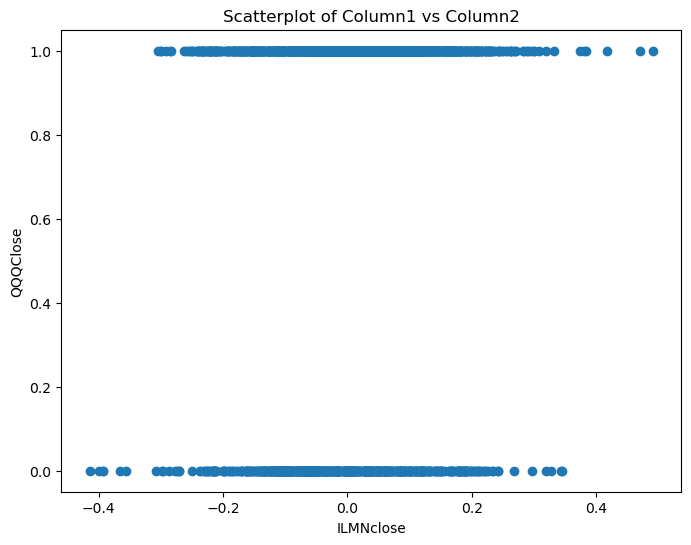

Point-Biserial Correlation Coefficient: 0.10739423480632229
P-value: 2.3865440741792054e-06
Pct Change Period is 25


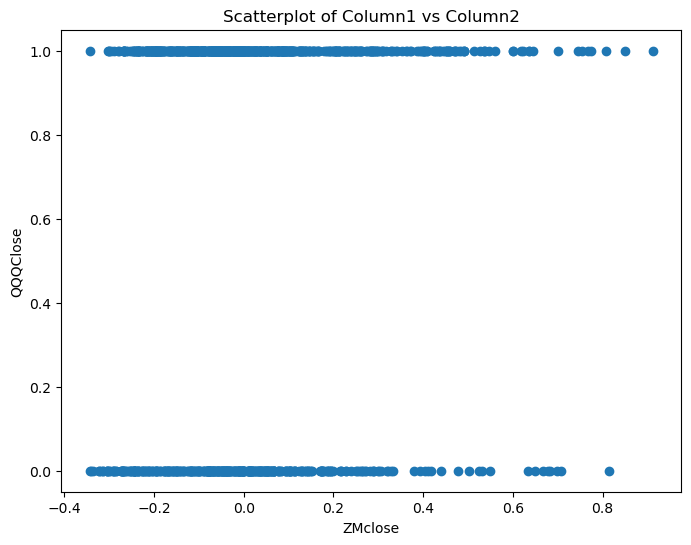

Point-Biserial Correlation Coefficient: 0.10758932846564431
P-value: 0.00036630583219820546
Pct Change Period is 25


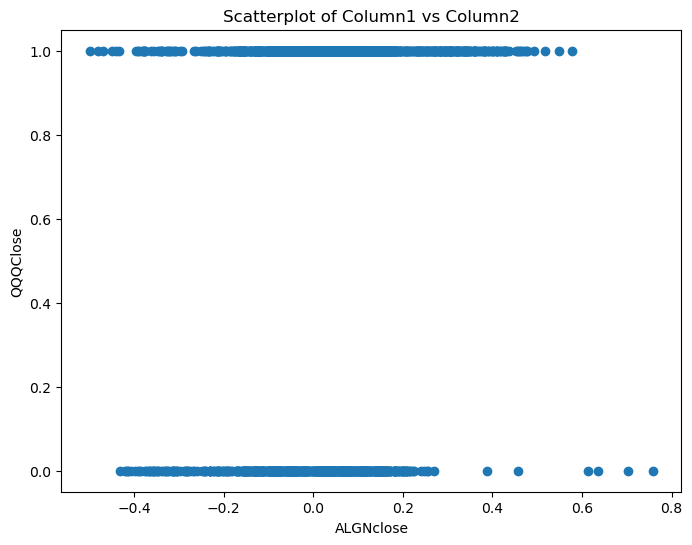

Point-Biserial Correlation Coefficient: 0.21868353515684563
P-value: 3.1331690817955987e-22
Pct Change Period is 25


<Figure size 640x480 with 0 Axes>

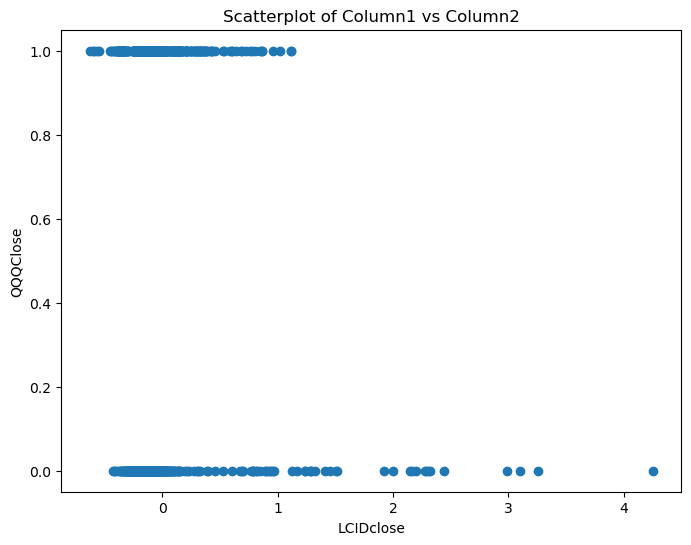

Point-Biserial Correlation Coefficient: -0.12984602955060948
P-value: 0.0004168177325150323
Pct Change Period is 25


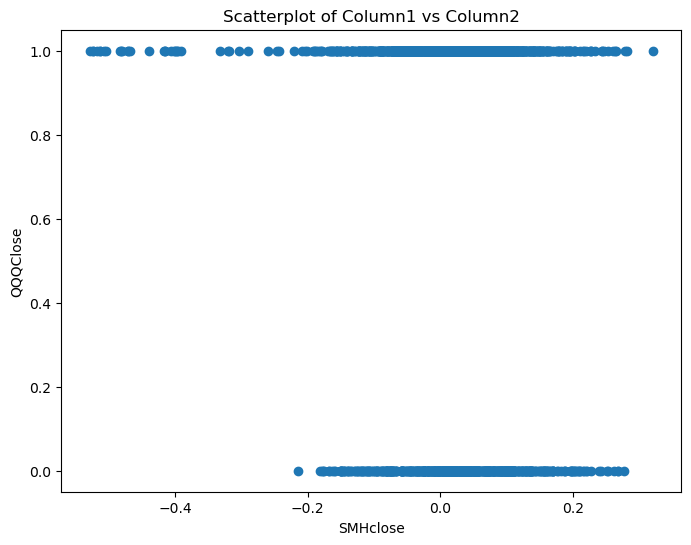

Point-Biserial Correlation Coefficient: -0.0805416902454178
P-value: 0.0004100606483752223
Pct Change Period is 25


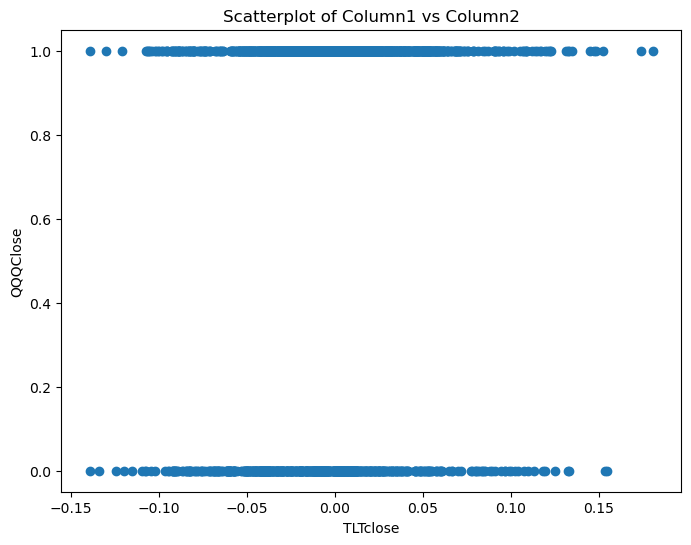

Point-Biserial Correlation Coefficient: 0.12097007420591882
P-value: 1.0484909942408597e-07
Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

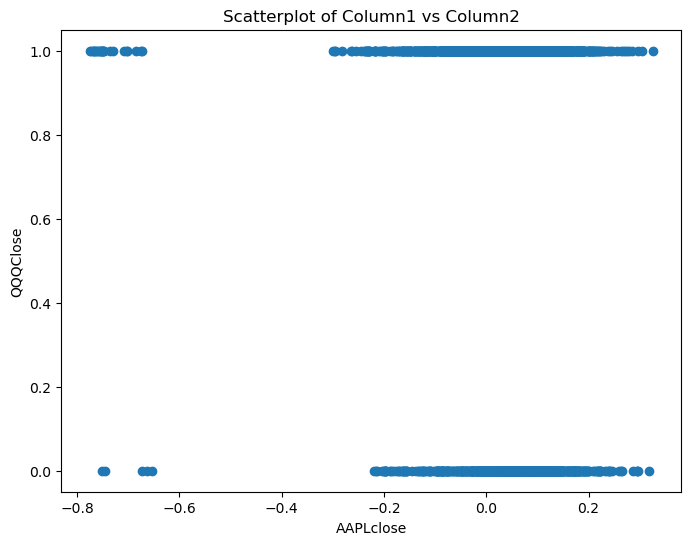

Point-Biserial Correlation Coefficient: -0.093016040470953
P-value: 4.653805399168297e-05
Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

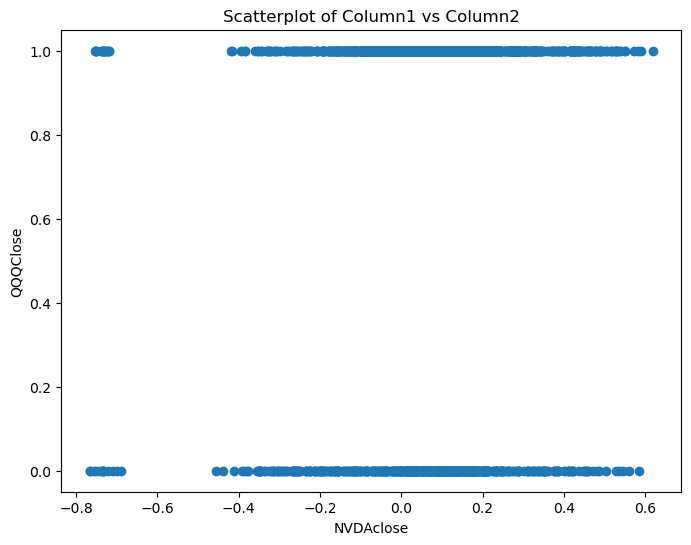

Point-Biserial Correlation Coefficient: 0.0735747611590162
P-value: 0.0012882791562862164
Pct Change Period is 30


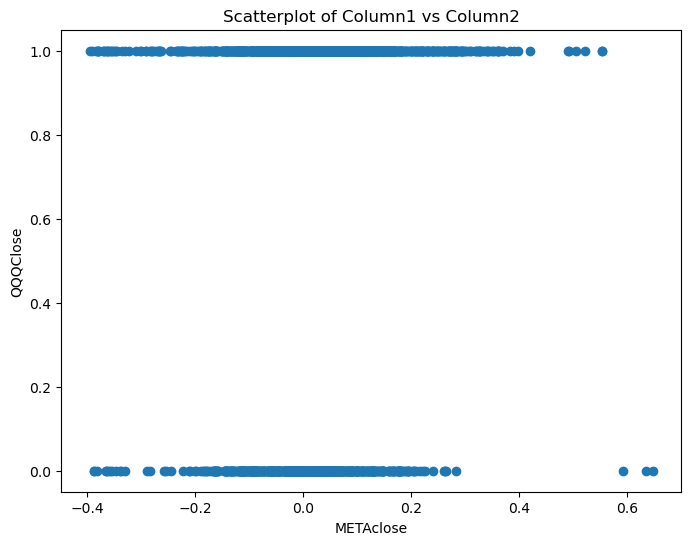

Point-Biserial Correlation Coefficient: 0.1143730294747142
P-value: 5.358742488505862e-07
Pct Change Period is 30


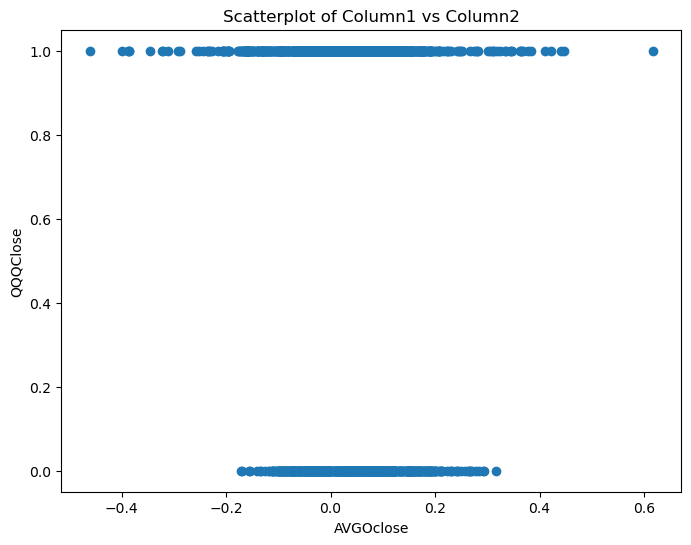

Point-Biserial Correlation Coefficient: -0.07558073979624821
P-value: 0.0009444257542528814
Pct Change Period is 30


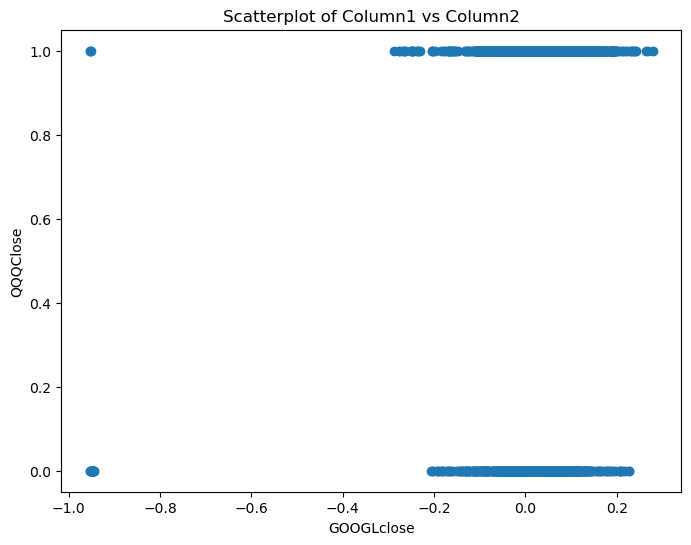

Point-Biserial Correlation Coefficient: 0.1736616356546473
P-value: 2.0926166716666502e-14
Pct Change Period is 30


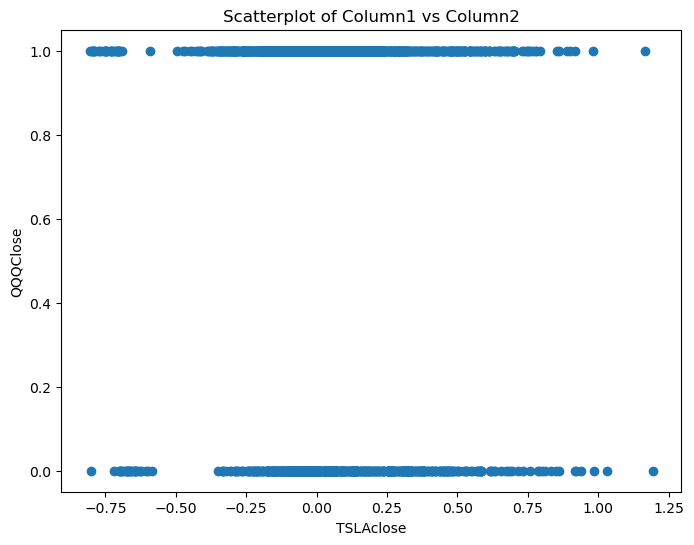

Point-Biserial Correlation Coefficient: -0.07289590283631778
P-value: 0.0014286405173832995
Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

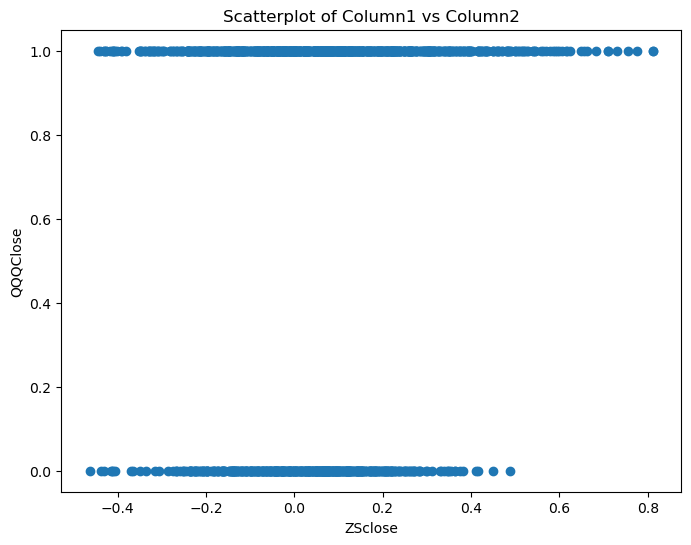

Point-Biserial Correlation Coefficient: 0.12557314515626833
P-value: 3.4855639152948503e-06
Pct Change Period is 30


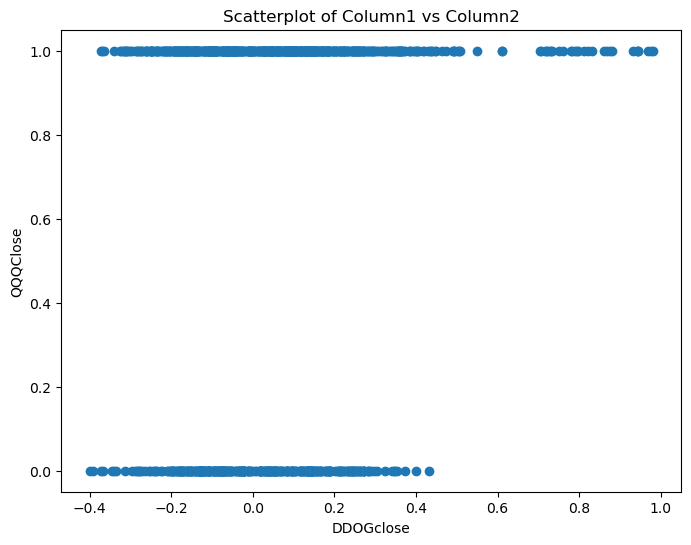

Point-Biserial Correlation Coefficient: 0.16122380118299348
P-value: 4.060533797144281e-07
Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

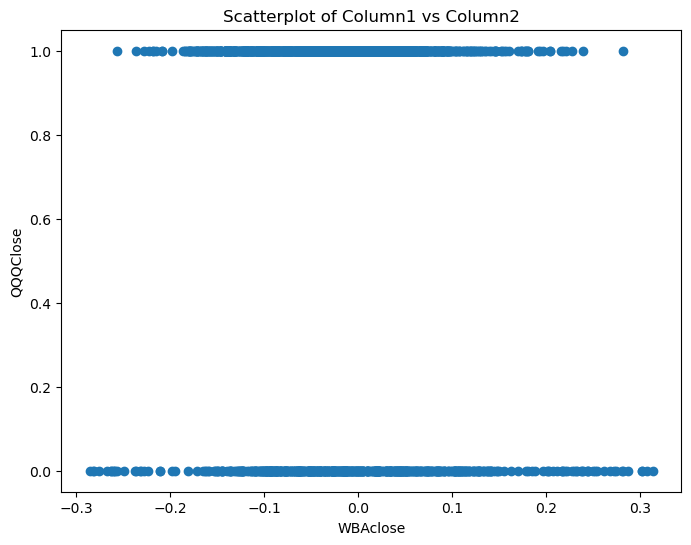

Point-Biserial Correlation Coefficient: -0.10163868696096312
P-value: 8.516968848930339e-06
Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

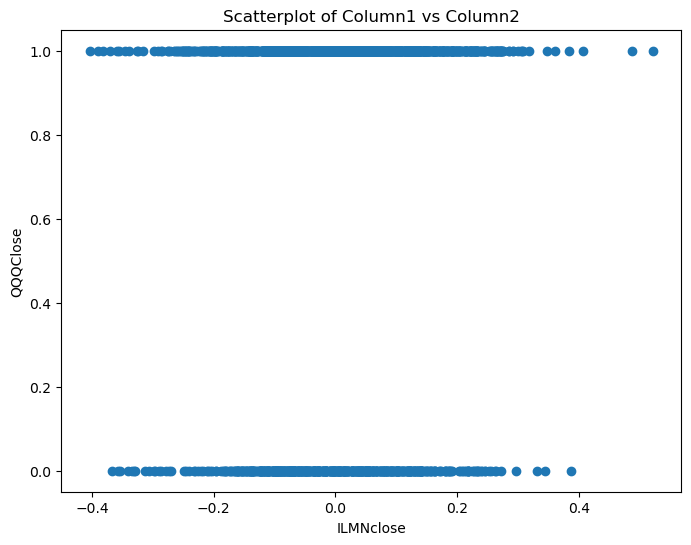

Point-Biserial Correlation Coefficient: 0.0736385122021338
P-value: 0.0012757734442318098
Pct Change Period is 30


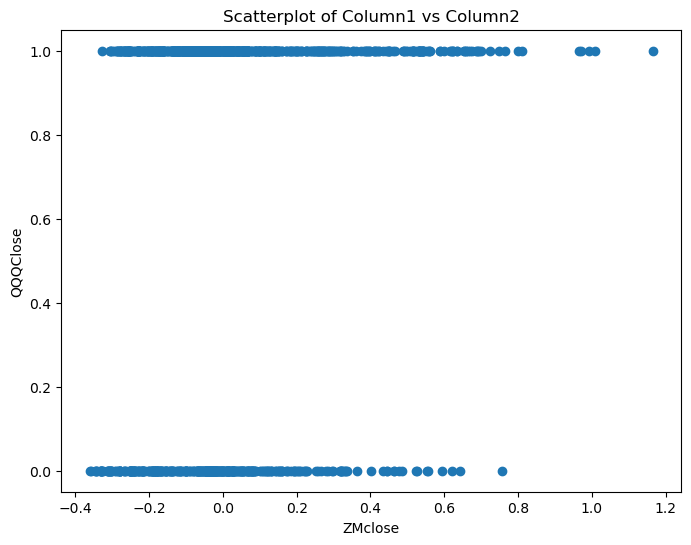

Point-Biserial Correlation Coefficient: 0.1697265510014151
P-value: 1.9107163990434873e-08
Pct Change Period is 30


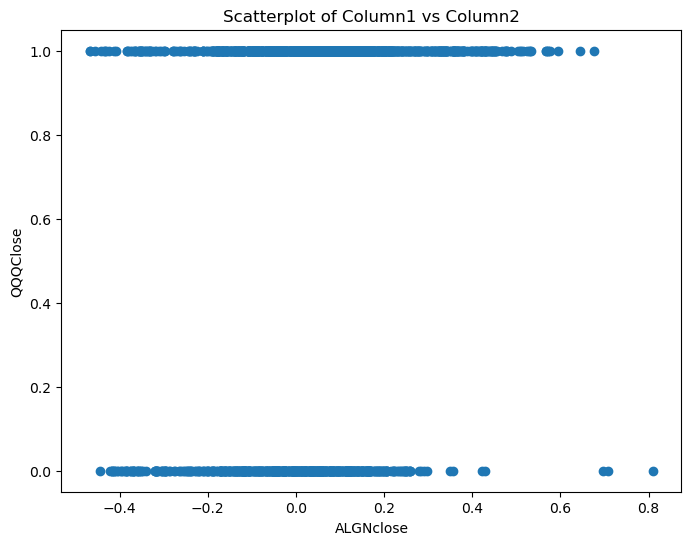

Point-Biserial Correlation Coefficient: 0.22352503113631056
P-value: 4.582150884032612e-23
Pct Change Period is 30


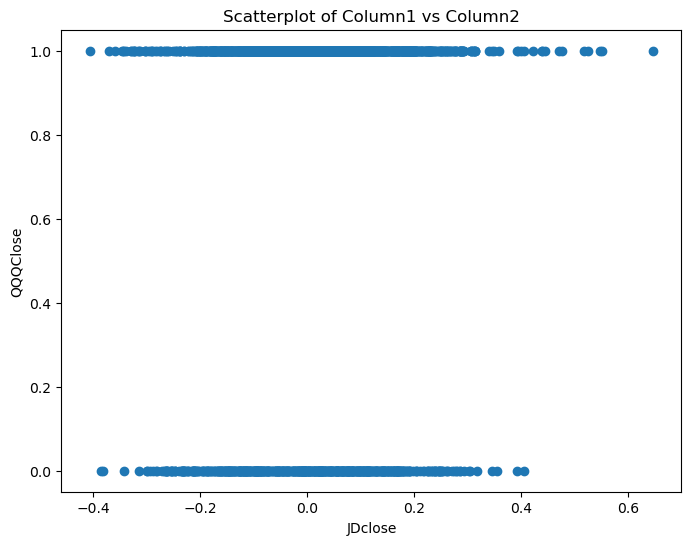

Point-Biserial Correlation Coefficient: 0.06427612612866654
P-value: 0.004940339093148852
Pct Change Period is 30


<Figure size 640x480 with 0 Axes>

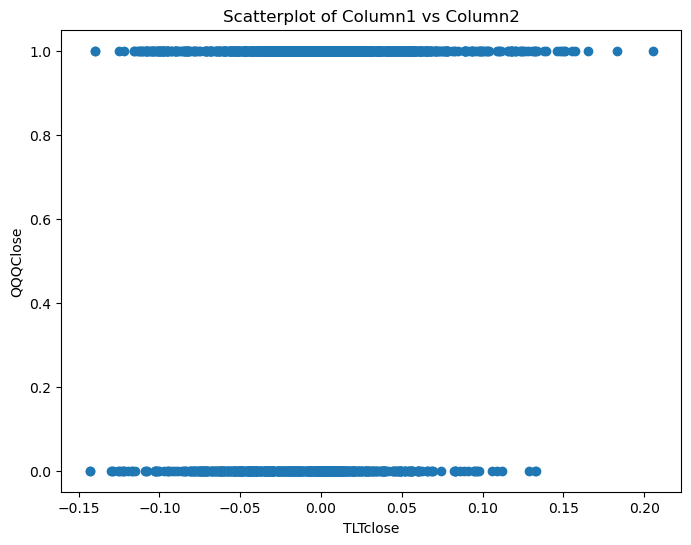

Point-Biserial Correlation Coefficient: 0.15083402570378096
P-value: 3.417841955405133e-11
Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

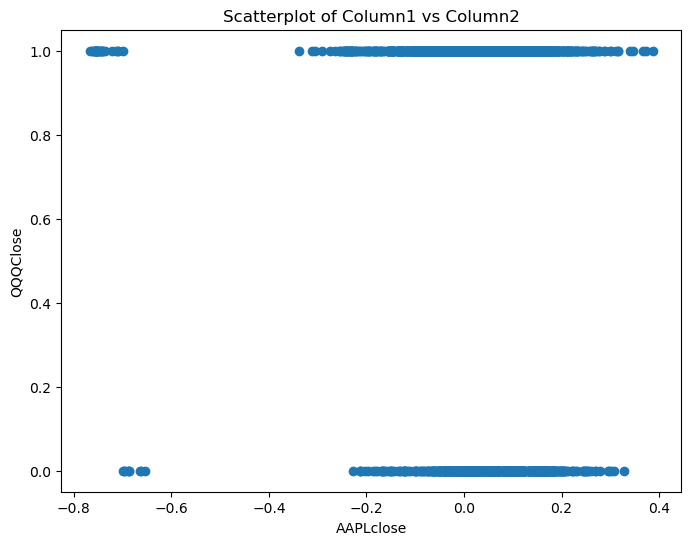

Point-Biserial Correlation Coefficient: -0.08806723390500694
P-value: 0.00012069104759111444
Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

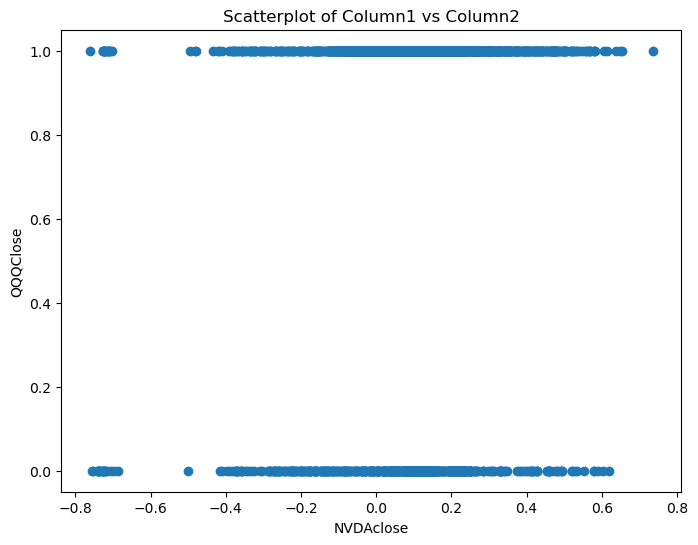

Point-Biserial Correlation Coefficient: 0.11888427867980807
P-value: 2.009627473222429e-07
Pct Change Period is 35


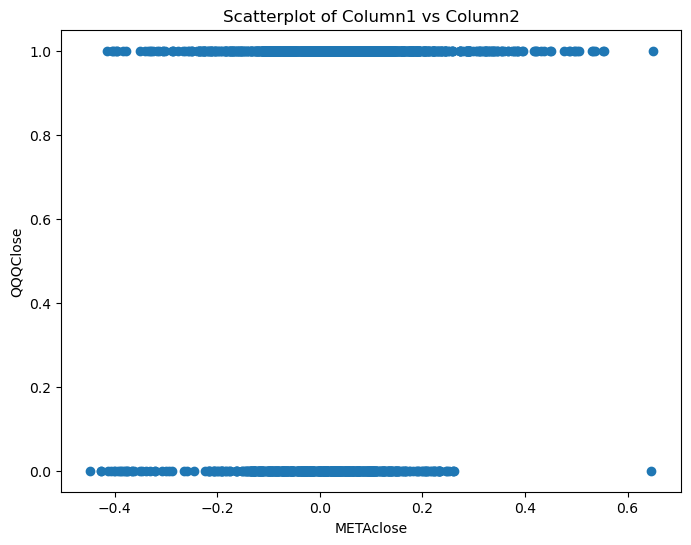

Point-Biserial Correlation Coefficient: 0.17814284342698528
P-value: 5.090027622661744e-15
Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

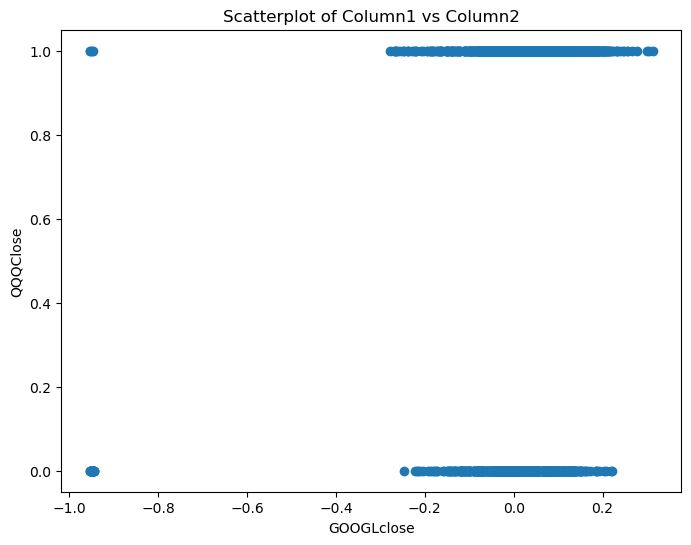

Point-Biserial Correlation Coefficient: 0.2051672570781301
P-value: 1.6282405964215063e-19
Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

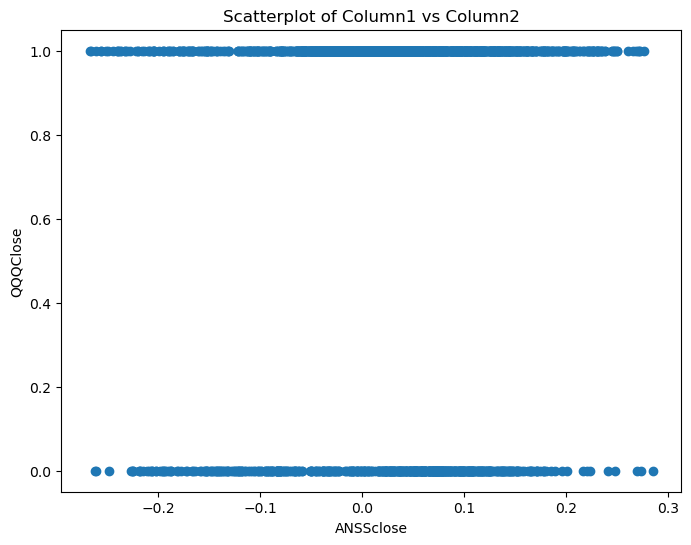

Point-Biserial Correlation Coefficient: 0.0600277178533099
P-value: 0.008847910495792723
Pct Change Period is 35


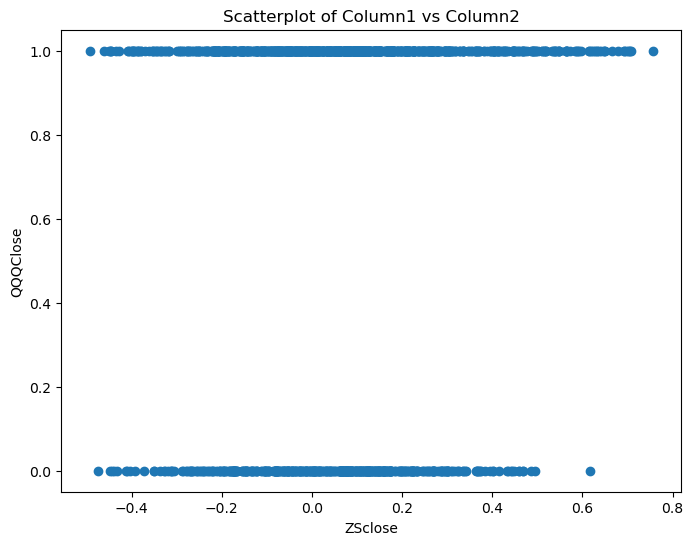

Point-Biserial Correlation Coefficient: 0.08735875188373812
P-value: 0.0013303188432953403
Pct Change Period is 35


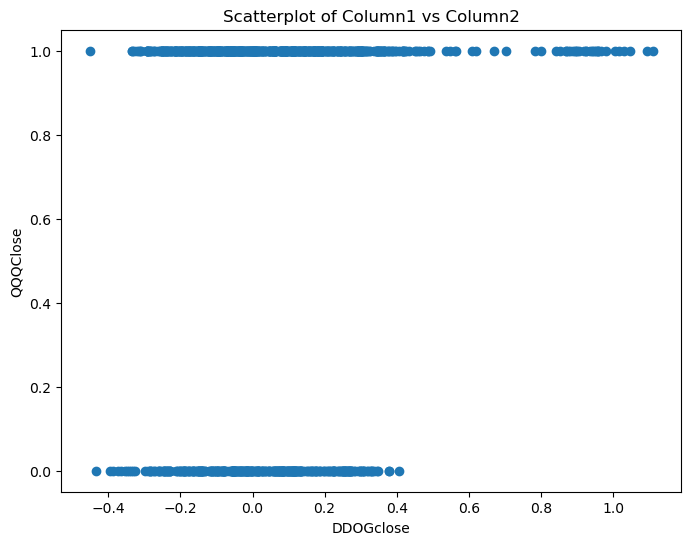

Point-Biserial Correlation Coefficient: 0.14930650618403338
P-value: 3.1150539606760516e-06
Pct Change Period is 35


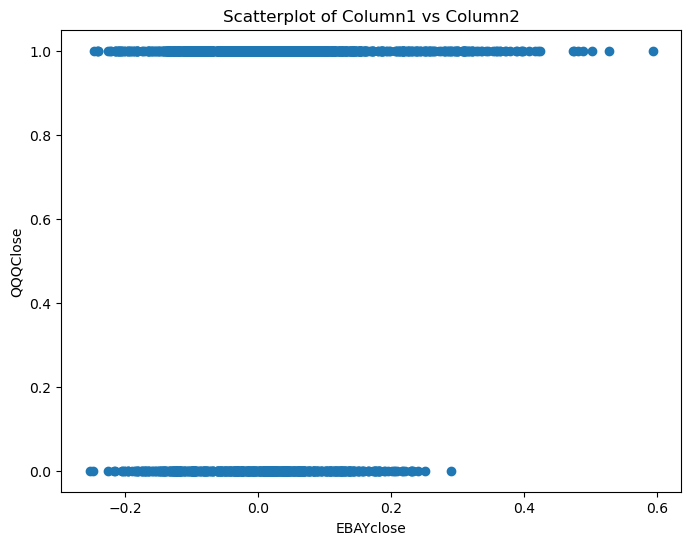

Point-Biserial Correlation Coefficient: 0.085043989247762
P-value: 0.0002054292039186388
Pct Change Period is 35


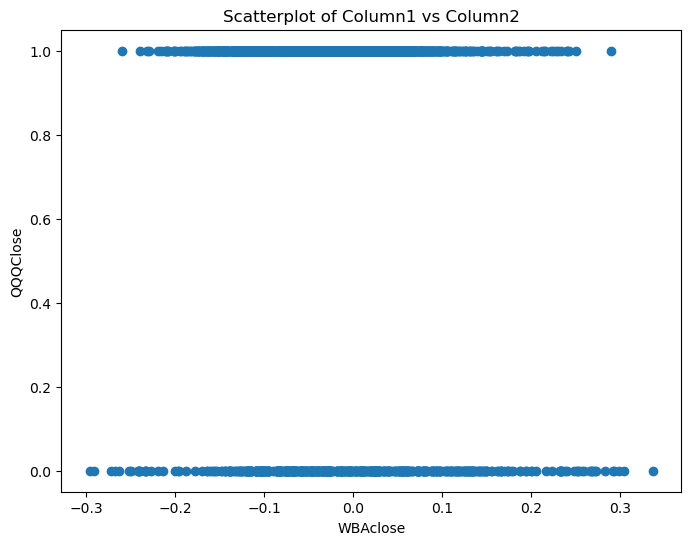

Point-Biserial Correlation Coefficient: -0.11252890272220402
P-value: 8.711447915405568e-07
Pct Change Period is 35


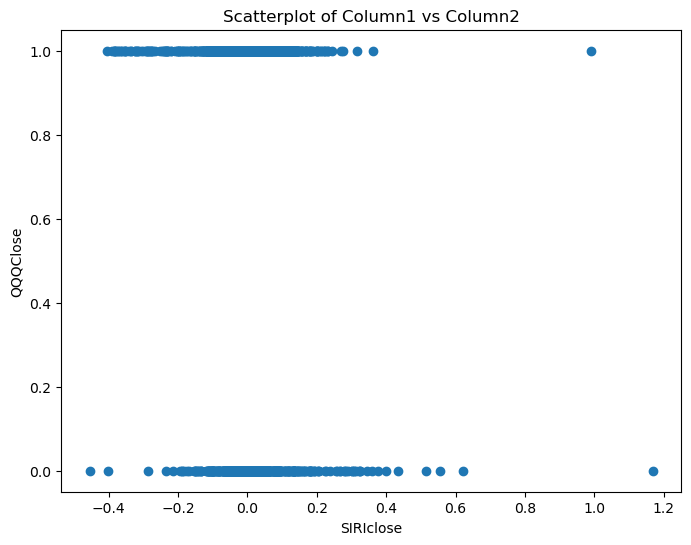

Point-Biserial Correlation Coefficient: -0.08609896082854508
P-value: 0.00017095835594252223
Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

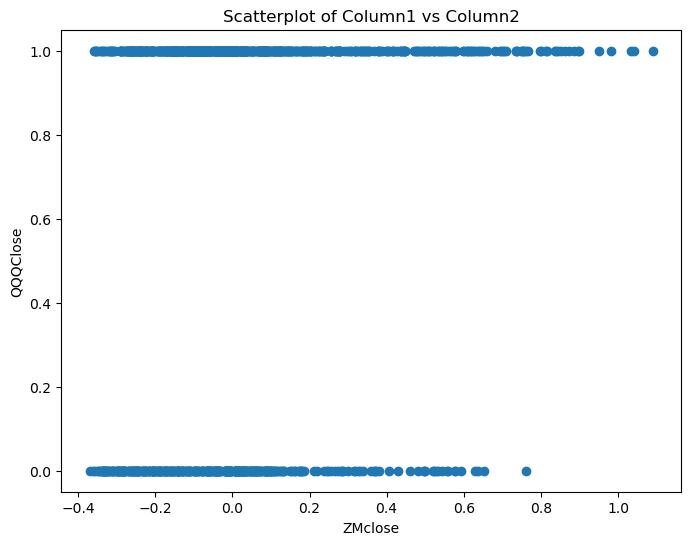

Point-Biserial Correlation Coefficient: 0.17367422601159482
P-value: 1.0287061150406065e-08
Pct Change Period is 35


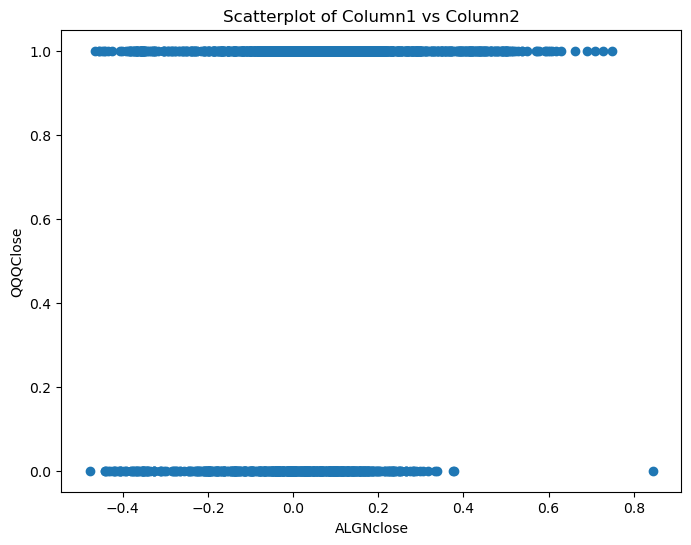

Point-Biserial Correlation Coefficient: 0.2320157656128077
P-value: 1.1894150606503833e-24
Pct Change Period is 35


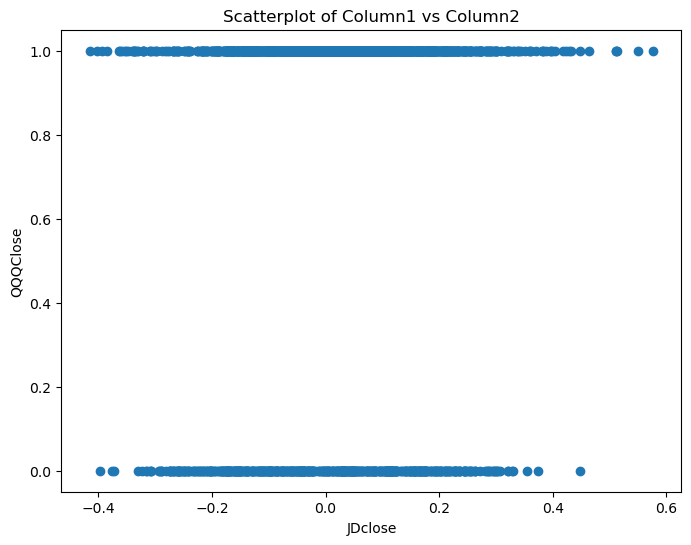

Point-Biserial Correlation Coefficient: 0.08231042620147802
P-value: 0.00032750935726195697
Pct Change Period is 35


<Figure size 640x480 with 0 Axes>

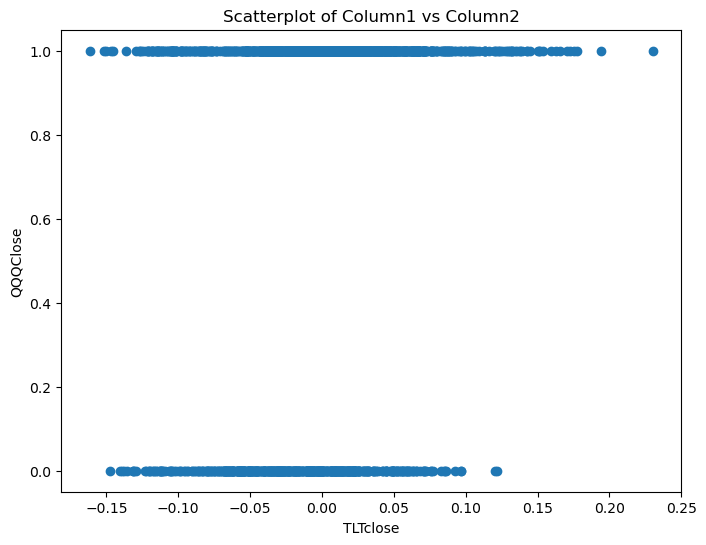

Point-Biserial Correlation Coefficient: 0.19494076060472165
P-value: 9.795613984155374e-18
Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

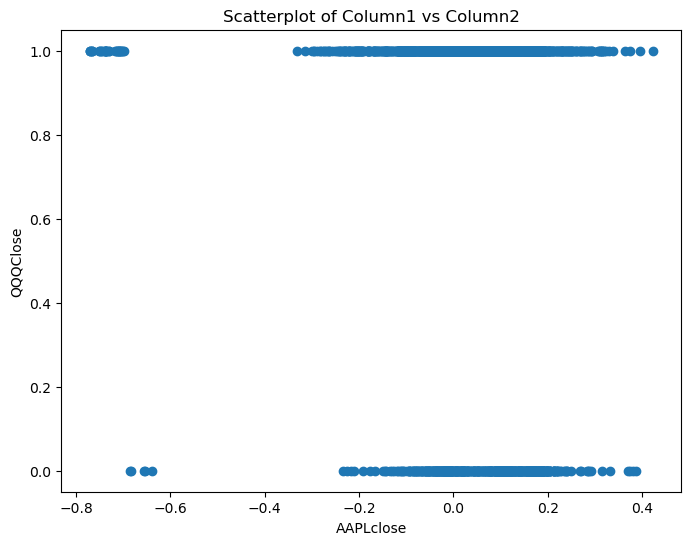

Point-Biserial Correlation Coefficient: -0.1412313177690843
P-value: 6.897863837210313e-10
Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

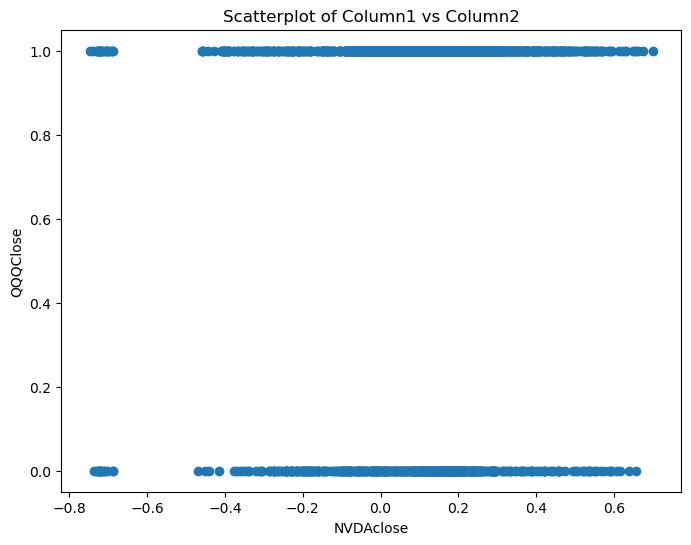

Point-Biserial Correlation Coefficient: 0.06771950106122059
P-value: 0.003216414243496934
Pct Change Period is 40


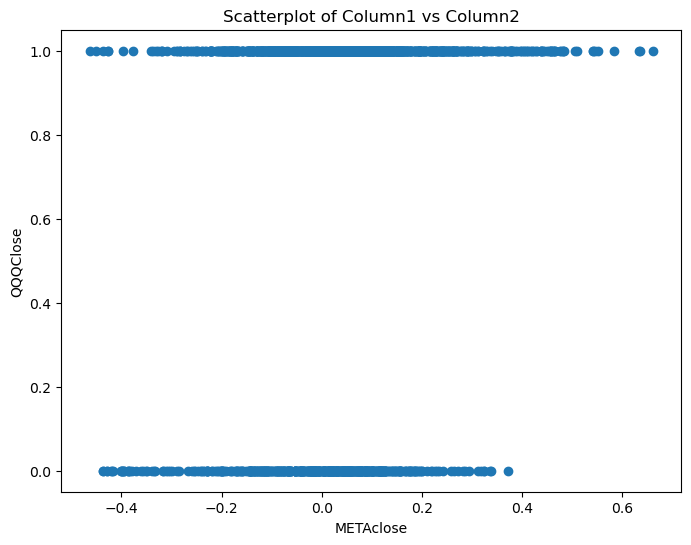

Point-Biserial Correlation Coefficient: 0.2023289270991791
P-value: 6.413689137064443e-19
Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

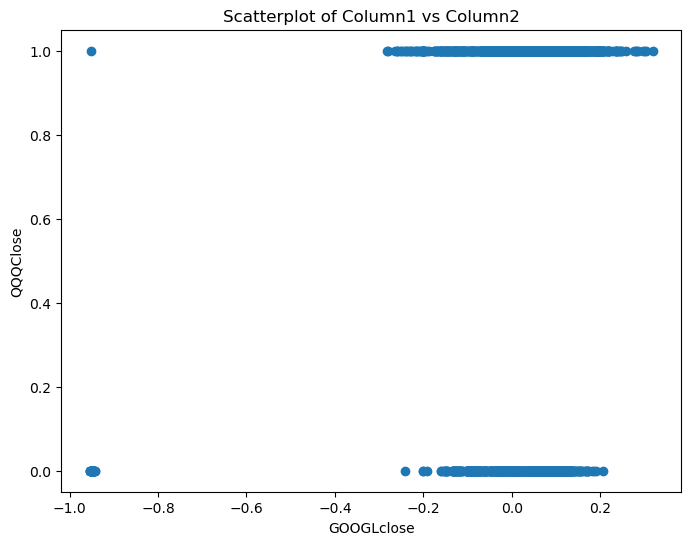

Point-Biserial Correlation Coefficient: 0.22946973150943195
P-value: 5.133094871669459e-24
Pct Change Period is 40


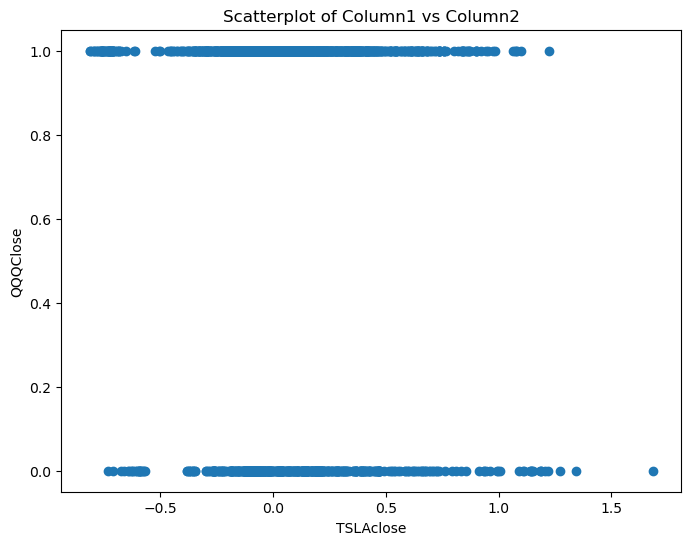

Point-Biserial Correlation Coefficient: -0.0991046725269153
P-value: 1.578696194179506e-05
Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

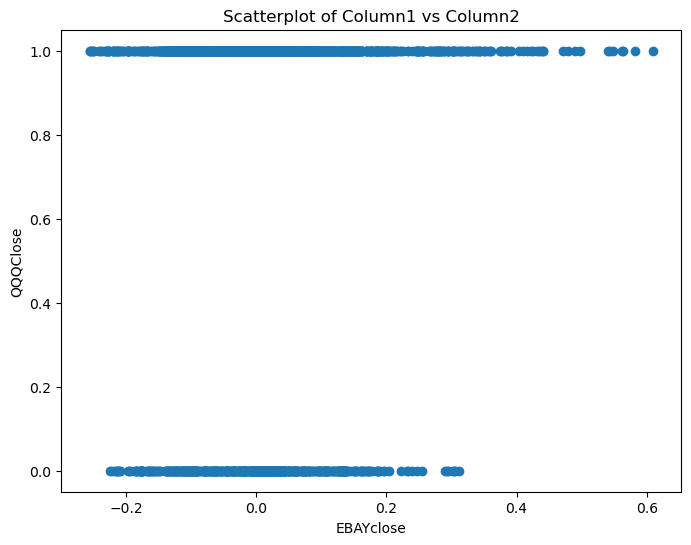

Point-Biserial Correlation Coefficient: 0.09515792900083778
P-value: 3.402972286478734e-05
Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

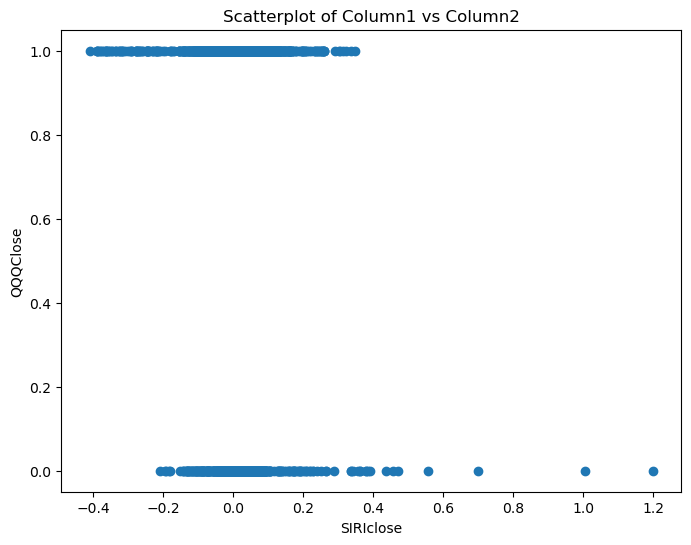

Point-Biserial Correlation Coefficient: -0.10528357483592422
P-value: 4.474025430734163e-06
Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

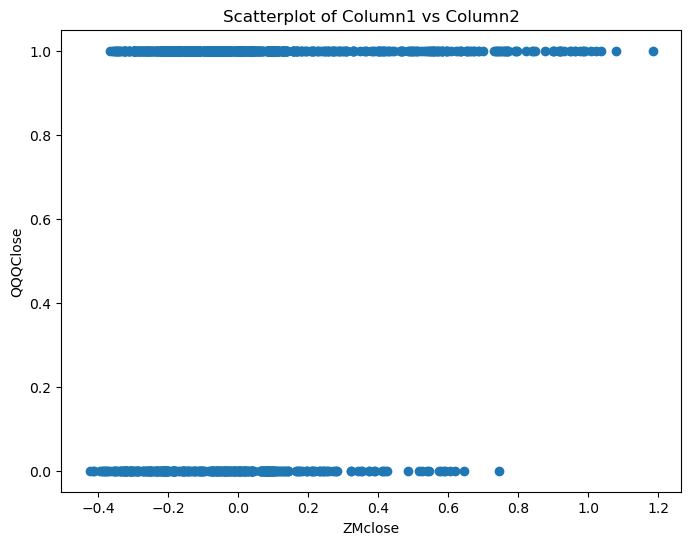

Point-Biserial Correlation Coefficient: 0.17029901114728926
P-value: 2.3142604437915564e-08
Pct Change Period is 40


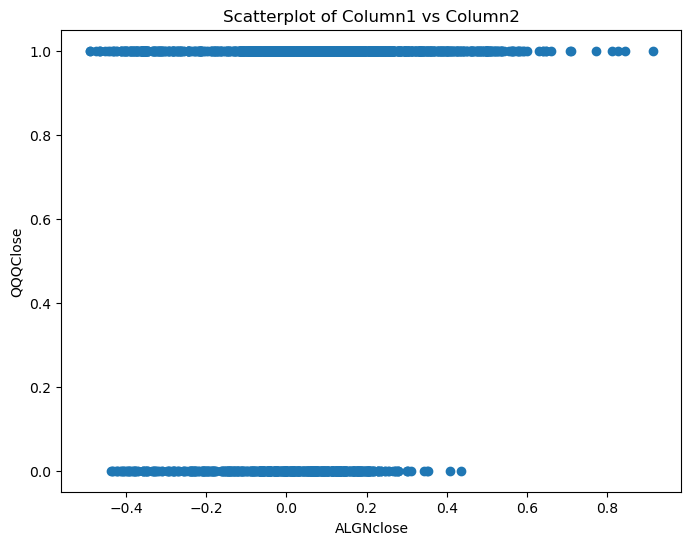

Point-Biserial Correlation Coefficient: 0.20709497358855616
P-value: 9.158032129583221e-20
Pct Change Period is 40


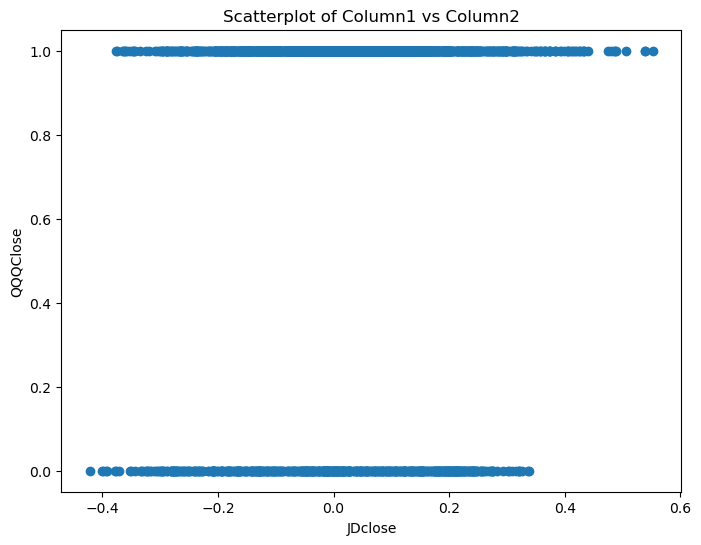

Point-Biserial Correlation Coefficient: 0.08258589256792206
P-value: 0.00032430763854440596
Pct Change Period is 40


<Figure size 640x480 with 0 Axes>

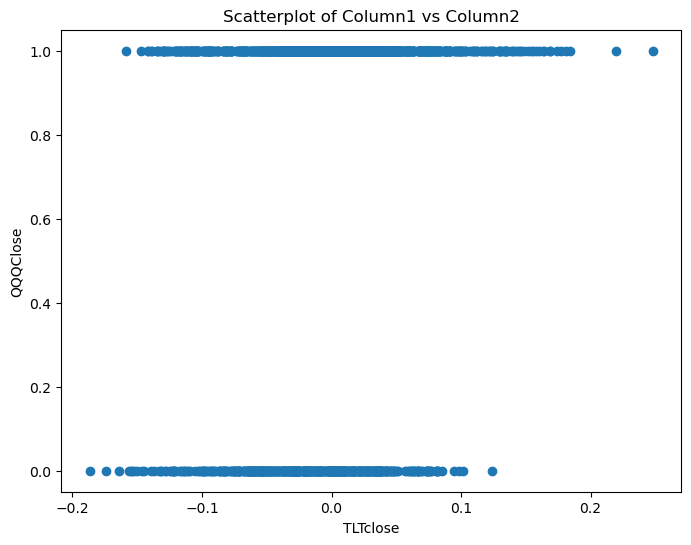

Point-Biserial Correlation Coefficient: 0.1749597011550223
P-value: 1.8252579673385837e-14
Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

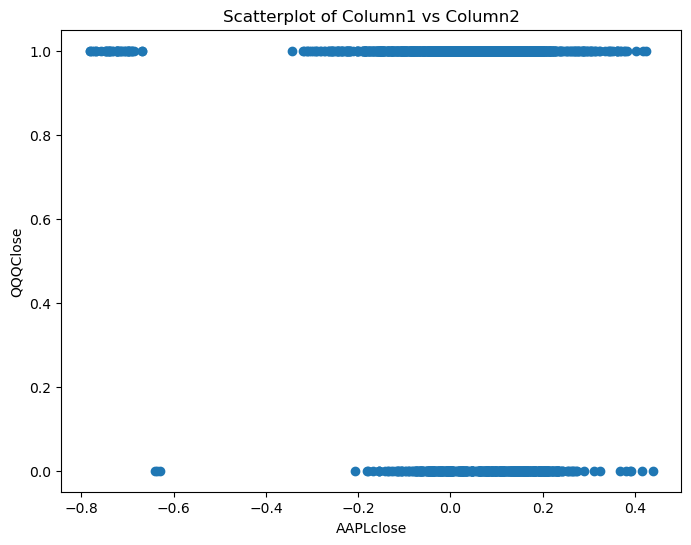

Point-Biserial Correlation Coefficient: -0.16861731892758036
P-value: 1.8264752190368017e-13
Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

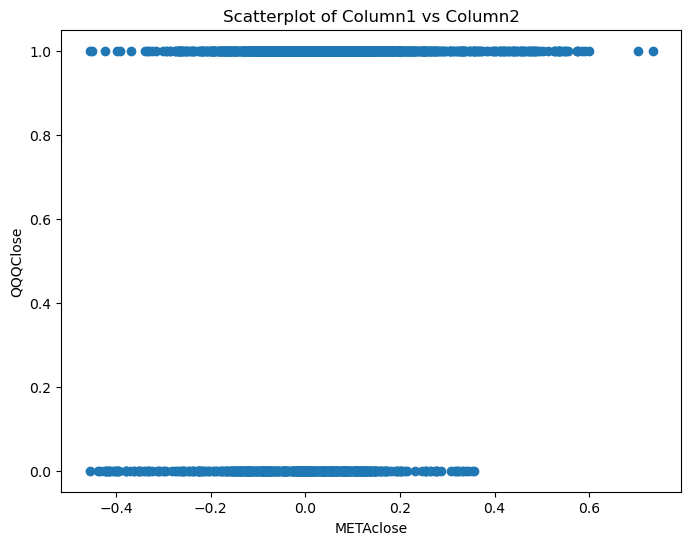

Point-Biserial Correlation Coefficient: 0.2396125157377864
P-value: 5.704207126080916e-26
Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

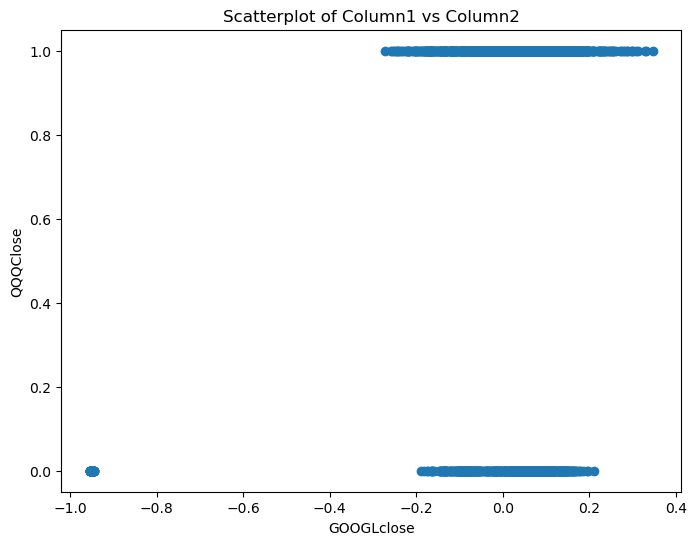

Point-Biserial Correlation Coefficient: 0.2495243079722764
P-value: 4.313340542772331e-28
Pct Change Period is 45


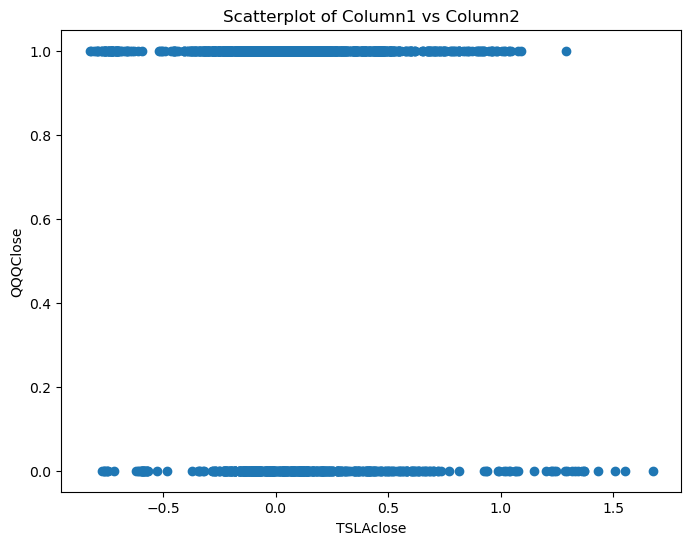

Point-Biserial Correlation Coefficient: -0.11917575284375137
P-value: 2.1745736129894792e-07
Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

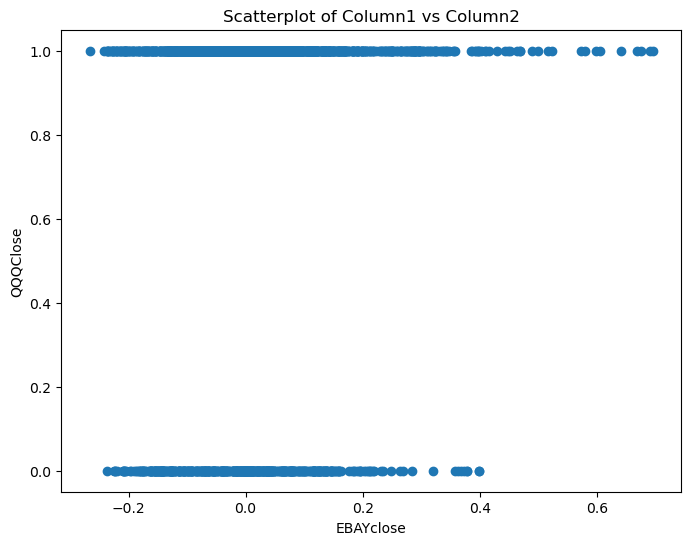

Point-Biserial Correlation Coefficient: 0.11269460162986308
P-value: 9.584244897288998e-07
Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

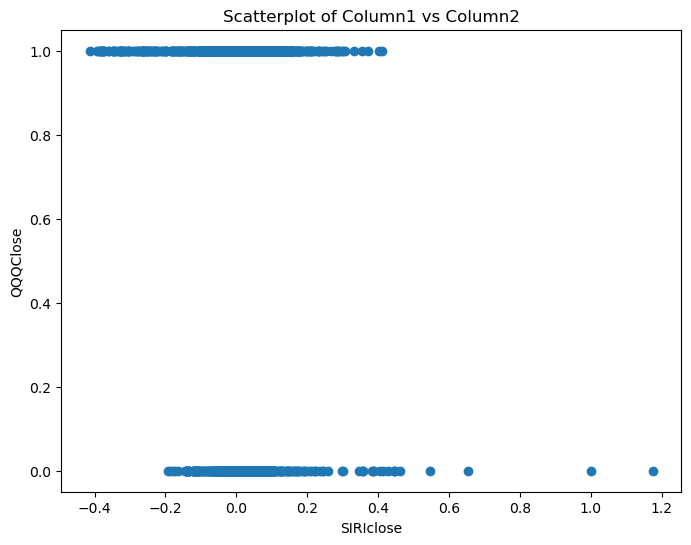

Point-Biserial Correlation Coefficient: -0.1337261753483422
P-value: 5.811896057878537e-09
Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

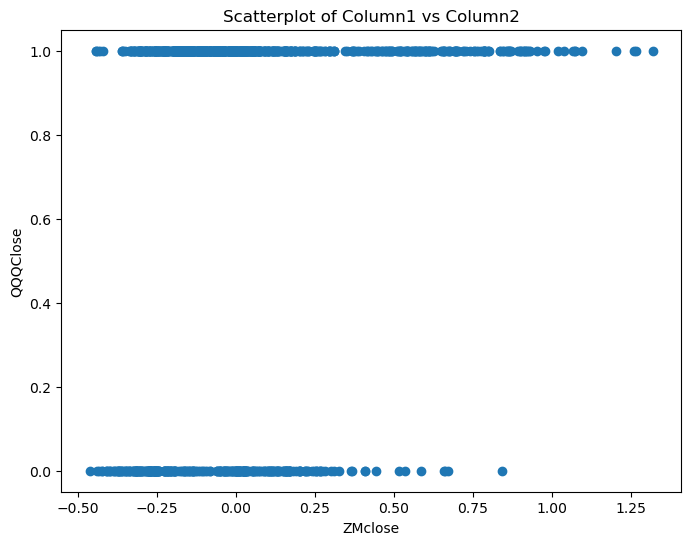

Point-Biserial Correlation Coefficient: 0.2250047764177286
P-value: 1.494407106516631e-13
Pct Change Period is 45


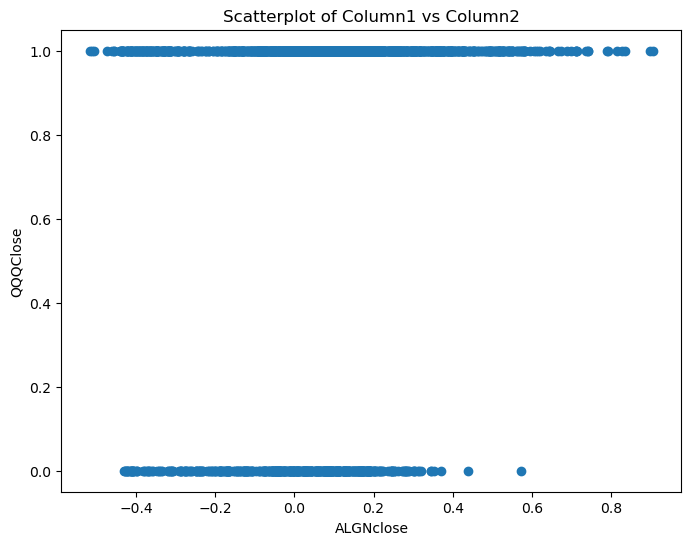

Point-Biserial Correlation Coefficient: 0.18975726491659223
P-value: 1.0418581269028593e-16
Pct Change Period is 45


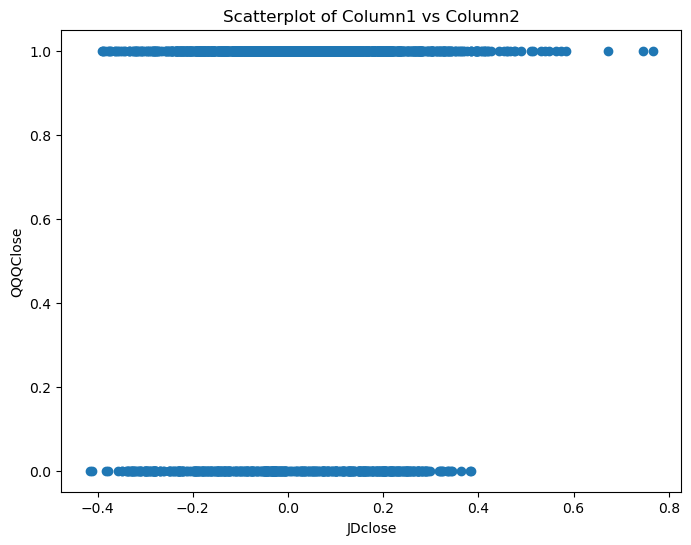

Point-Biserial Correlation Coefficient: 0.08151635094379663
P-value: 0.00040172923705053814
Pct Change Period is 45


<Figure size 640x480 with 0 Axes>

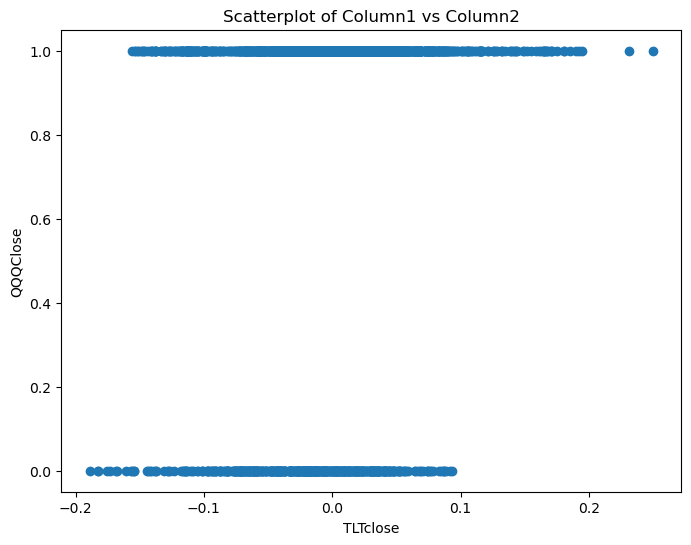

Point-Biserial Correlation Coefficient: 0.1879160484532083
P-value: 2.0708328169601272e-16
Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

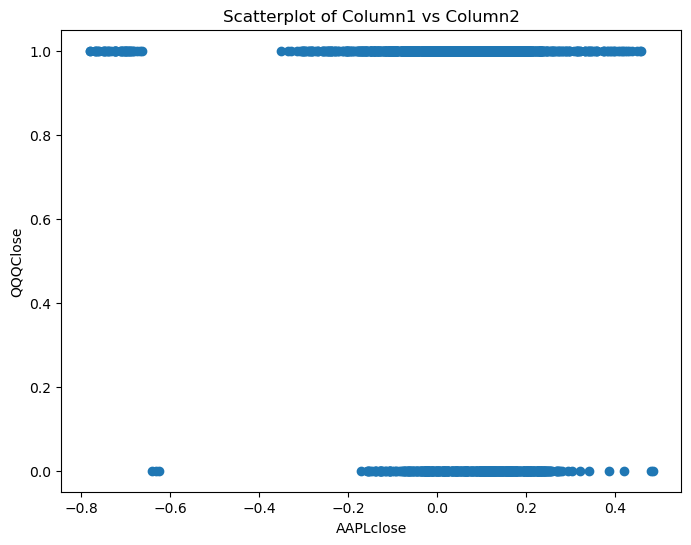

Point-Biserial Correlation Coefficient: -0.1568060515013302
P-value: 9.081678019437076e-12
Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

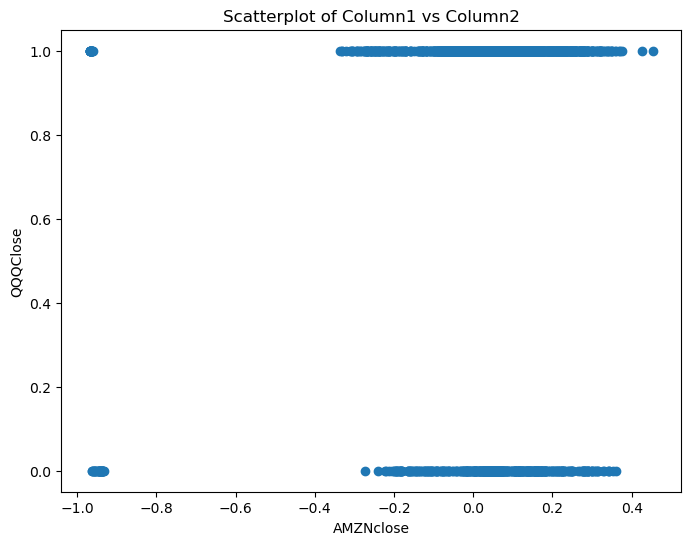

Point-Biserial Correlation Coefficient: 0.06836467102323085
P-value: 0.0030903659706633495
Pct Change Period is 50


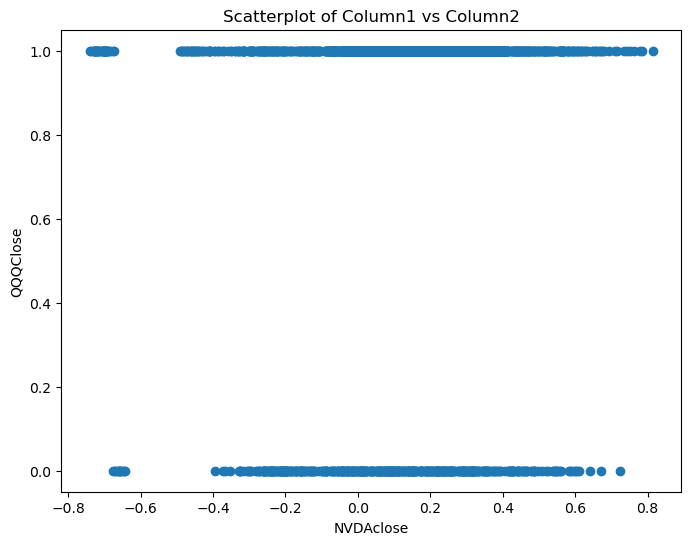

Point-Biserial Correlation Coefficient: 0.06395538534151222
P-value: 0.005650911303773858
Pct Change Period is 50


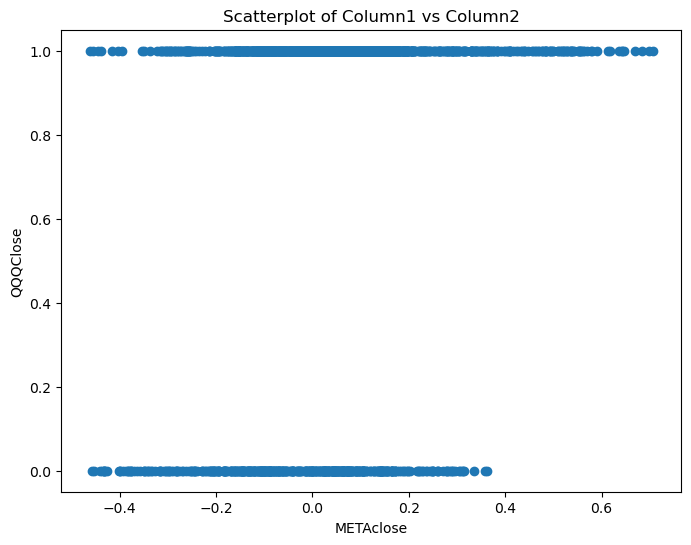

Point-Biserial Correlation Coefficient: 0.25777015029893535
P-value: 8.855067877885435e-30
Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

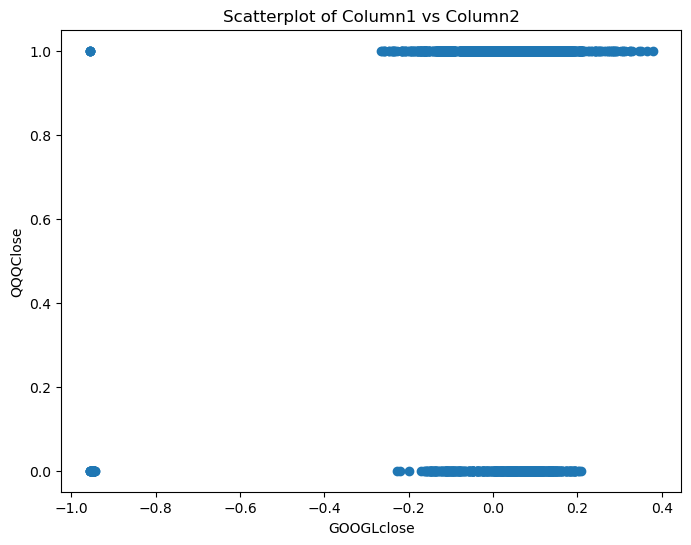

Point-Biserial Correlation Coefficient: 0.2189572100719501
P-value: 9.595498834474326e-22
Pct Change Period is 50


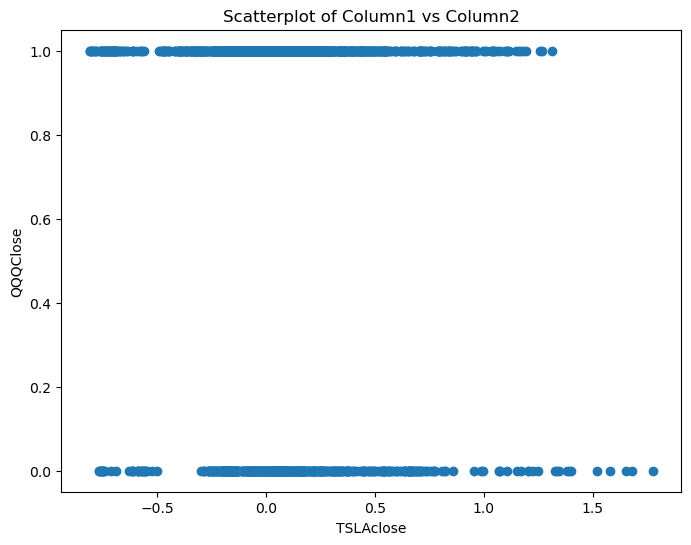

Point-Biserial Correlation Coefficient: -0.11214212352995334
P-value: 1.1572627561994853e-06
Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

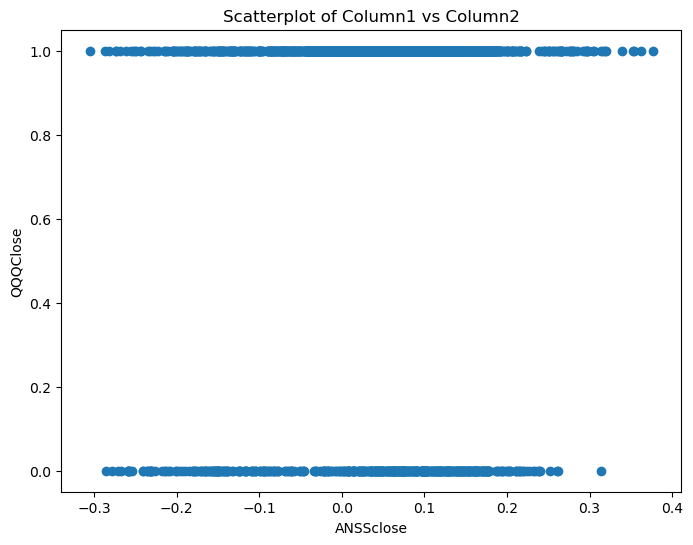

Point-Biserial Correlation Coefficient: 0.06124965401432424
P-value: 0.008047389553045974
Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

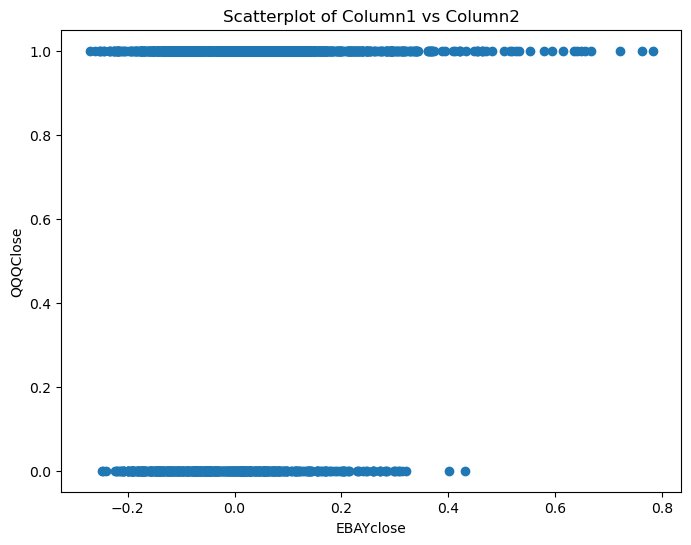

Point-Biserial Correlation Coefficient: 0.16950374770263327
P-value: 1.5774233637385966e-13
Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

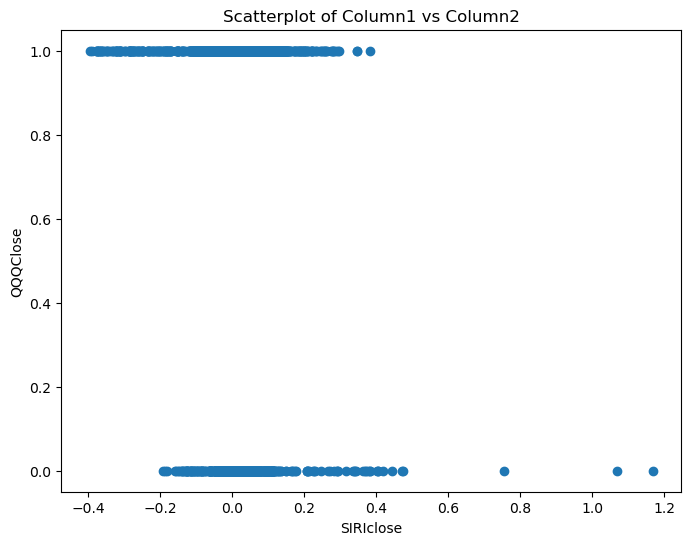

Point-Biserial Correlation Coefficient: -0.14927624791624028
P-value: 8.639287057362513e-11
Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

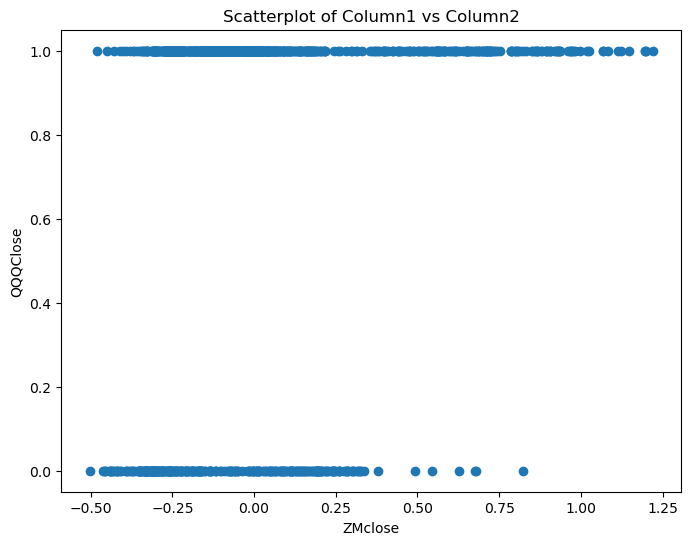

Point-Biserial Correlation Coefficient: 0.24220034149343095
P-value: 2.174260040429967e-15
Pct Change Period is 50


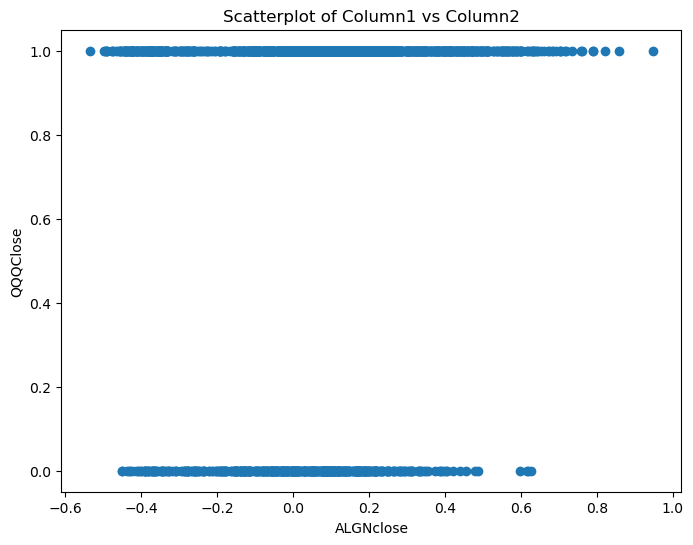

Point-Biserial Correlation Coefficient: 0.1680152102299441
P-value: 2.579444844819542e-13
Pct Change Period is 50


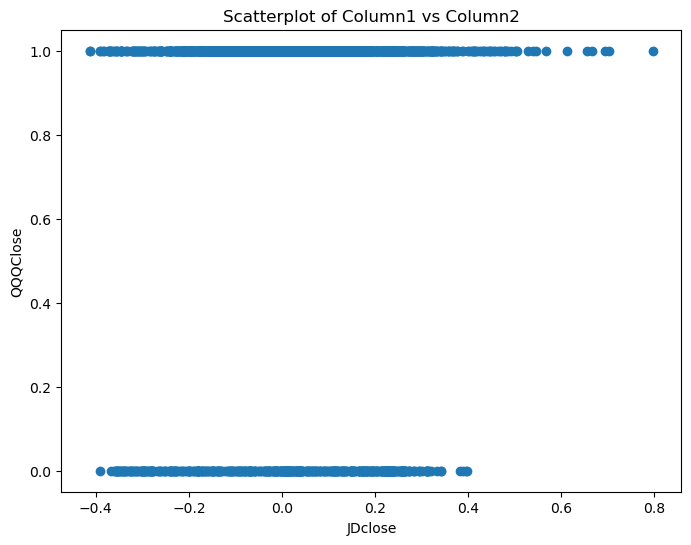

Point-Biserial Correlation Coefficient: 0.07853581944963502
P-value: 0.000673726434071102
Pct Change Period is 50


<Figure size 640x480 with 0 Axes>

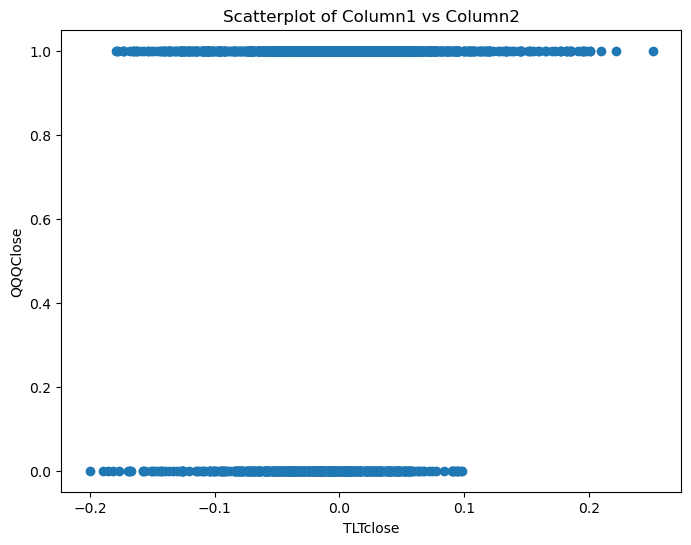

Point-Biserial Correlation Coefficient: 0.16607806731800817
P-value: 4.859425953401948e-13
Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

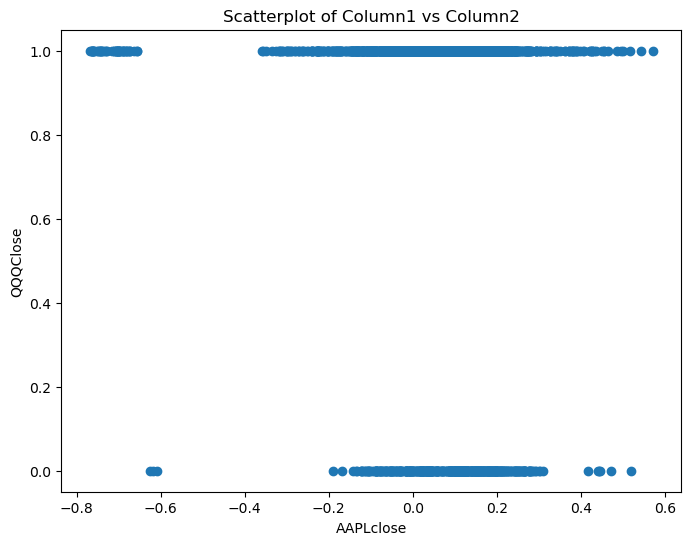

Point-Biserial Correlation Coefficient: -0.15300491033375507
P-value: 3.2407401082339536e-11
Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

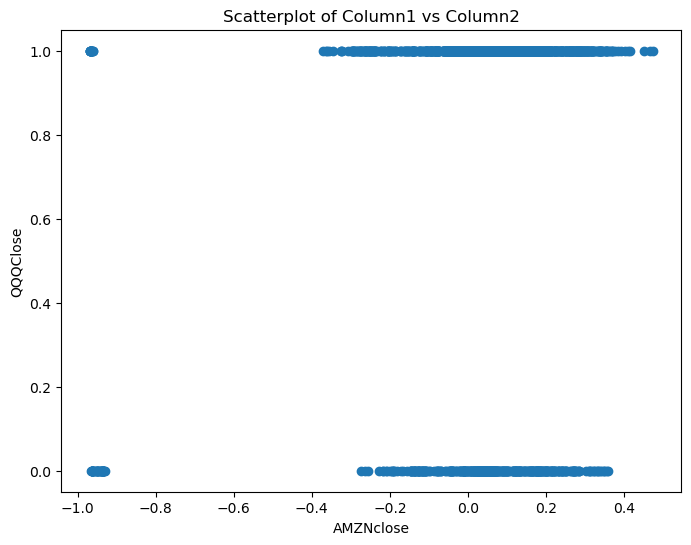

Point-Biserial Correlation Coefficient: 0.11750178601508189
P-value: 3.7121173932423083e-07
Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

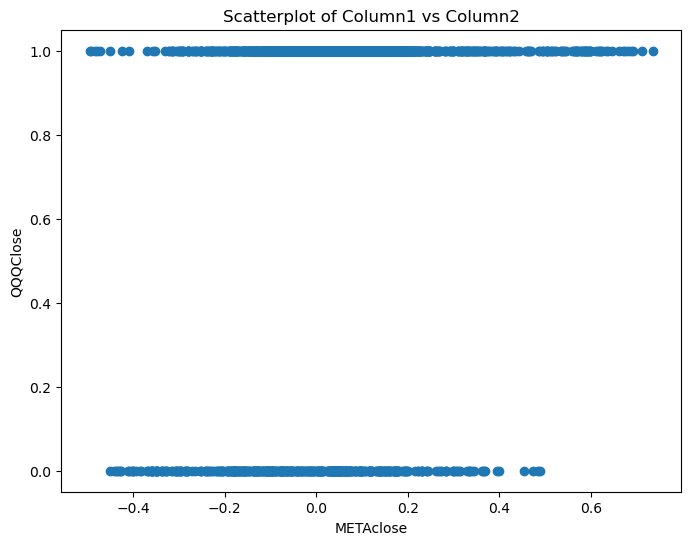

Point-Biserial Correlation Coefficient: 0.25045181416758566
P-value: 5.188320741129041e-28
Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

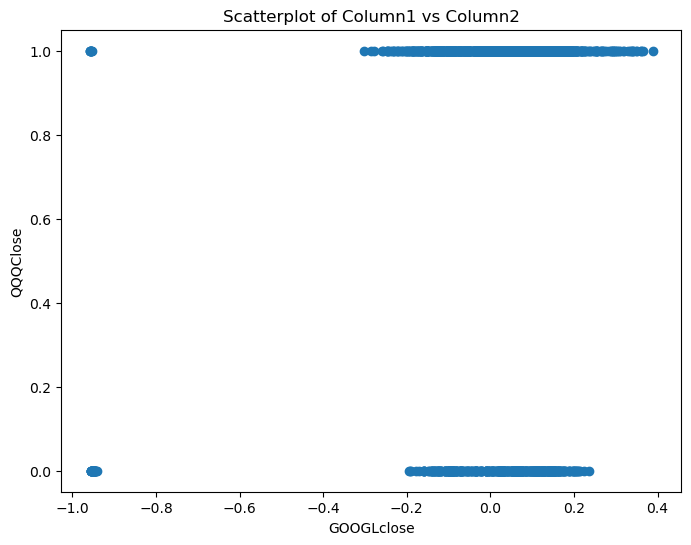

Point-Biserial Correlation Coefficient: 0.2231500505405787
P-value: 1.972831259478454e-22
Pct Change Period is 55


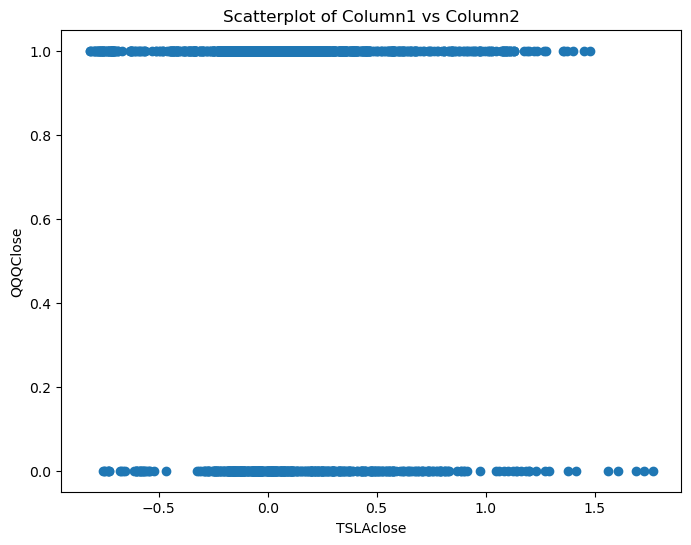

Point-Biserial Correlation Coefficient: -0.10321255879807972
P-value: 8.14083427210694e-06
Pct Change Period is 55


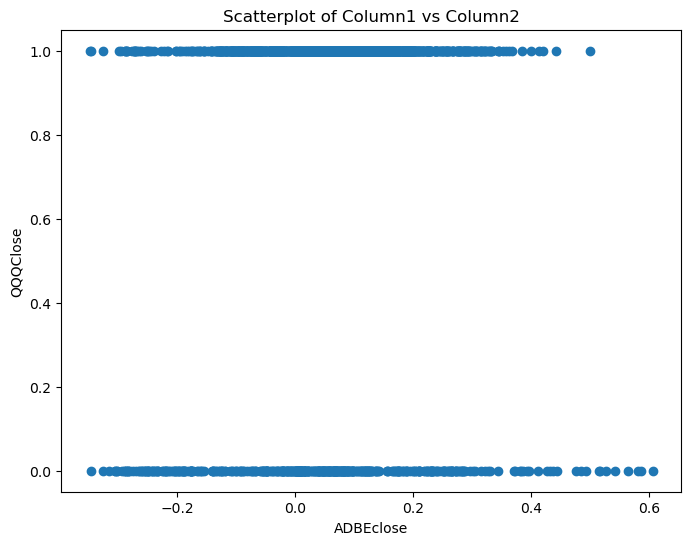

Point-Biserial Correlation Coefficient: 0.09622410848182954
P-value: 3.211813950955841e-05
Pct Change Period is 55


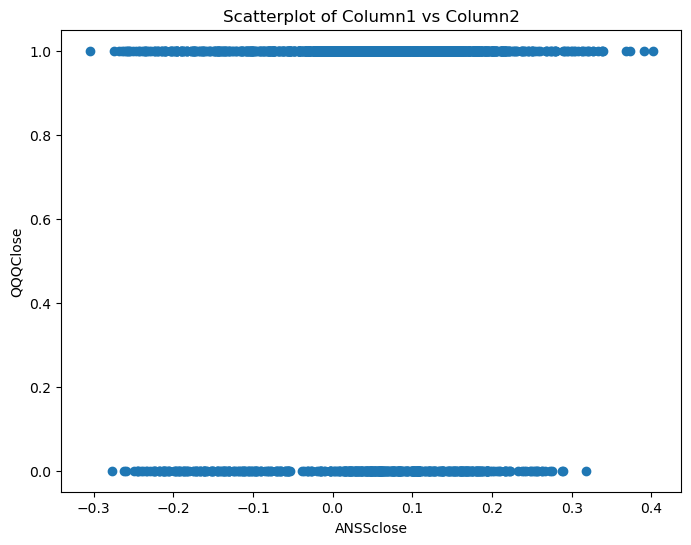

Point-Biserial Correlation Coefficient: 0.08101575498557162
P-value: 0.0004681161627261132
Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

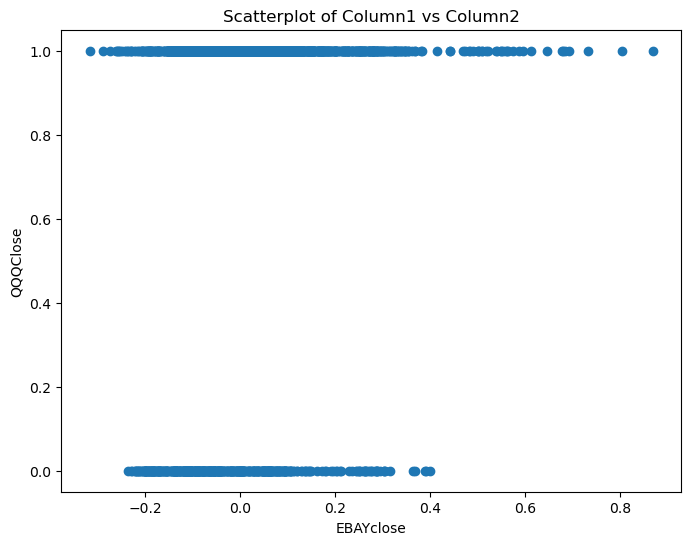

Point-Biserial Correlation Coefficient: 0.22045042523059402
P-value: 6.4373185511635395e-22
Pct Change Period is 55


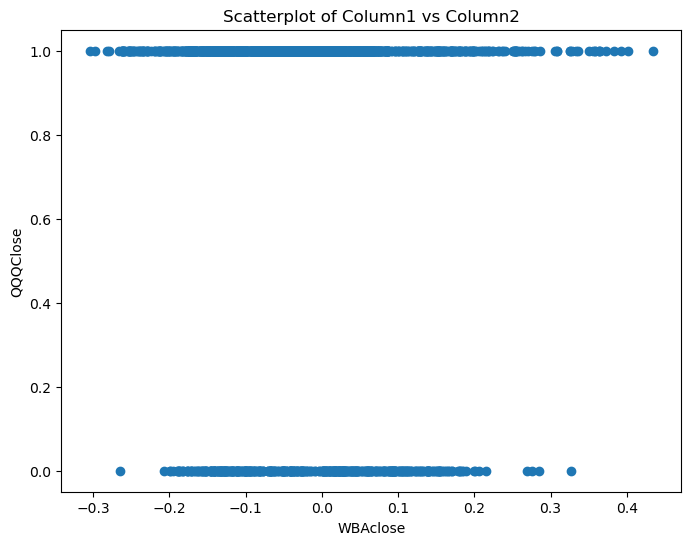

Point-Biserial Correlation Coefficient: -0.06150808879934793
P-value: 0.007950921188212619
Pct Change Period is 55


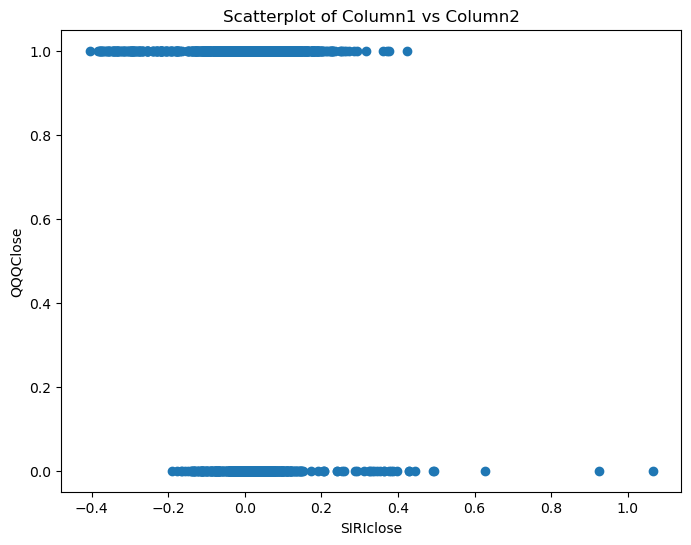

Point-Biserial Correlation Coefficient: -0.12095109412374692
P-value: 1.663620749887819e-07
Pct Change Period is 55


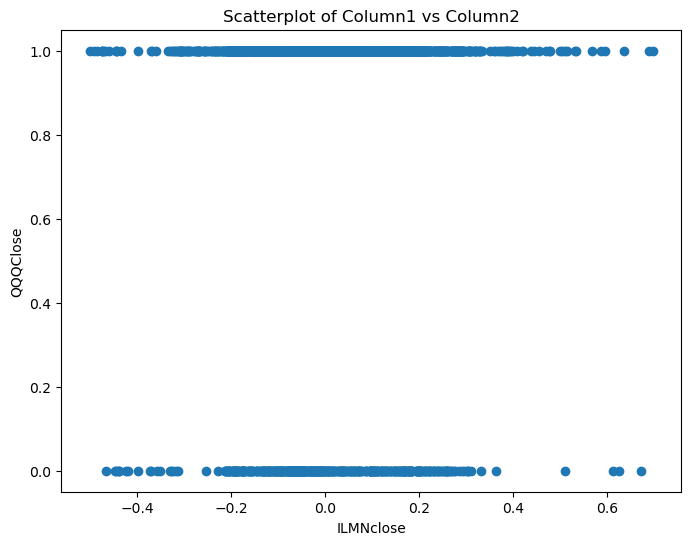

Point-Biserial Correlation Coefficient: 0.07098114010780372
P-value: 0.002184828462508602
Pct Change Period is 55


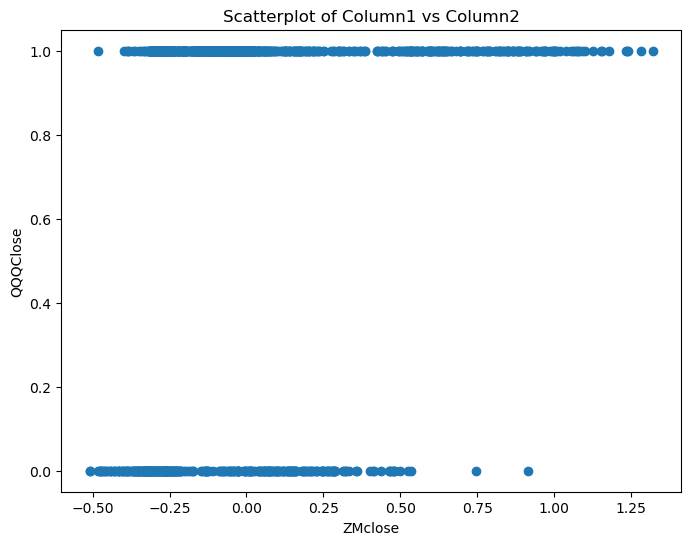

Point-Biserial Correlation Coefficient: 0.25499303736614276
P-value: 8.532532806216647e-17
Pct Change Period is 55


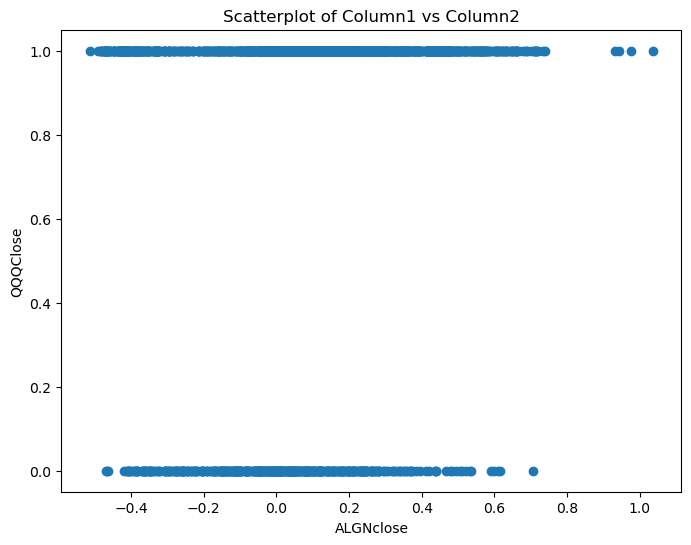

Point-Biserial Correlation Coefficient: 0.1781037311533219
P-value: 9.936153176105111e-15
Pct Change Period is 55


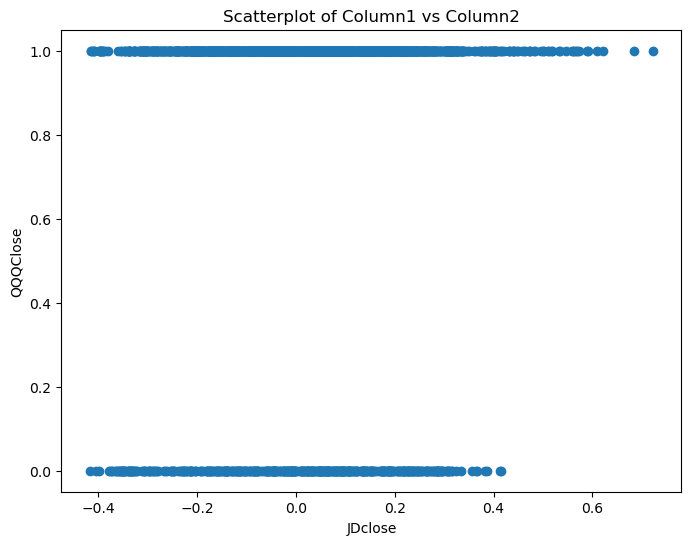

Point-Biserial Correlation Coefficient: 0.08122702672620086
P-value: 0.0004523036590201561
Pct Change Period is 55


<Figure size 640x480 with 0 Axes>

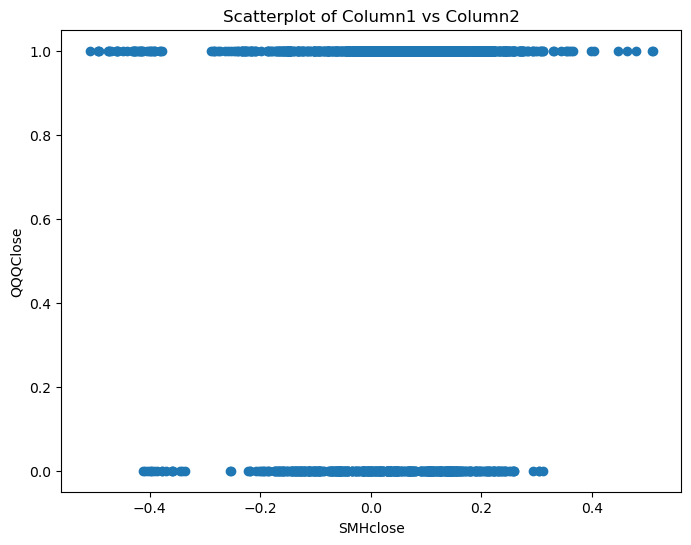

Point-Biserial Correlation Coefficient: 0.10030984284235284
P-value: 1.4554286050591429e-05
Pct Change Period is 55


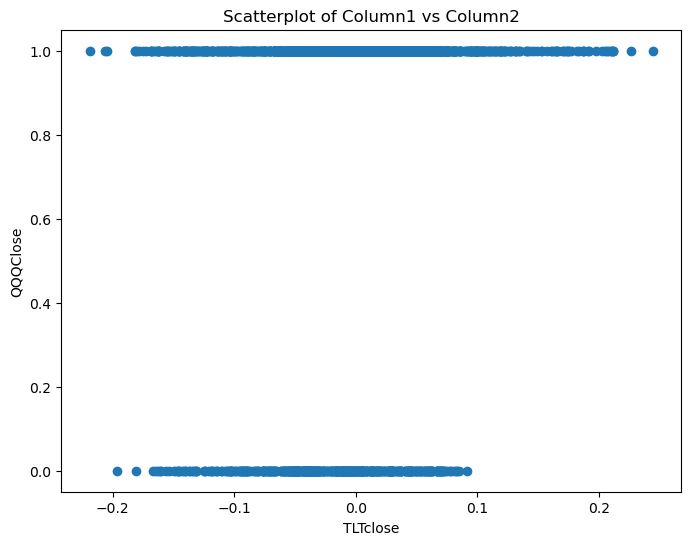

Point-Biserial Correlation Coefficient: 0.15508339654063735
P-value: 1.7387757775796562e-11
Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

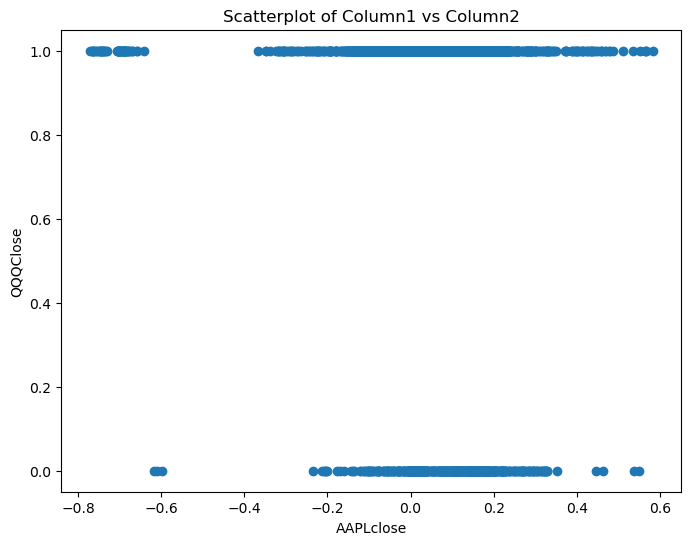

Point-Biserial Correlation Coefficient: -0.1541643822280453
P-value: 2.591862990986651e-11
Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

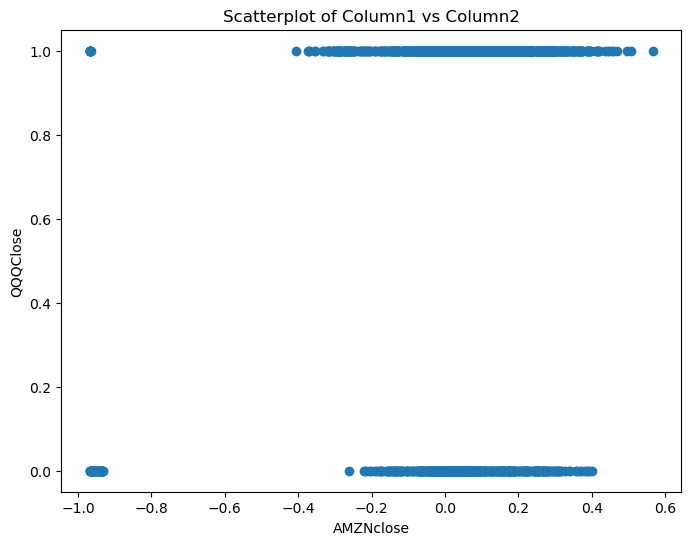

Point-Biserial Correlation Coefficient: 0.1771385727942743
P-value: 1.632234938243605e-14
Pct Change Period is 60


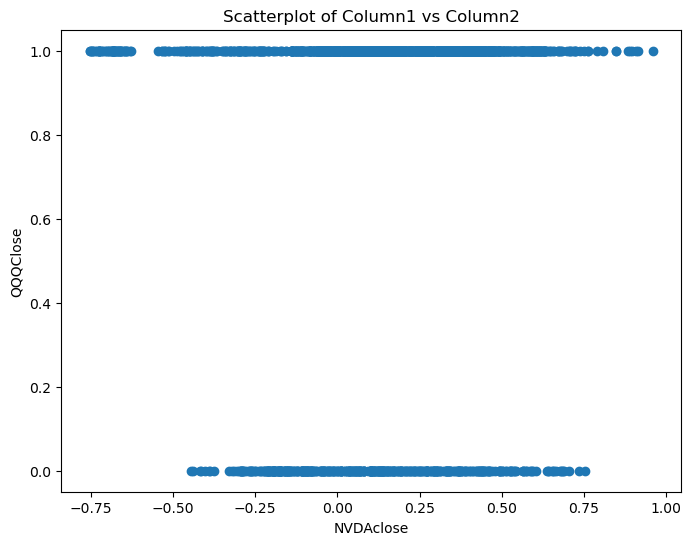

Point-Biserial Correlation Coefficient: 0.06518679244475031
P-value: 0.005021715783631633
Pct Change Period is 60


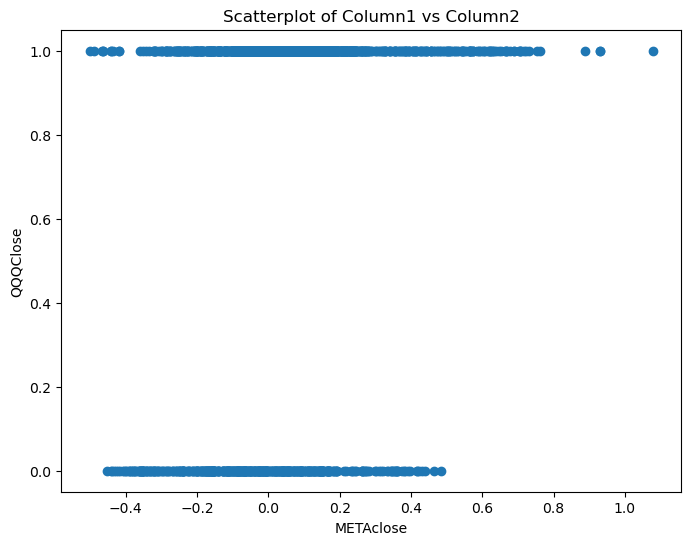

Point-Biserial Correlation Coefficient: 0.2689745334424163
P-value: 4.825674929874456e-32
Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

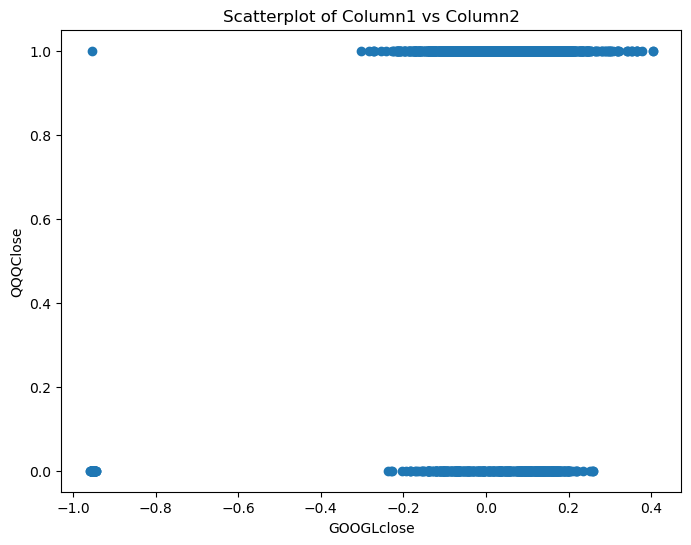

Point-Biserial Correlation Coefficient: 0.2729432492813499
P-value: 5.563348910403065e-33
Pct Change Period is 60


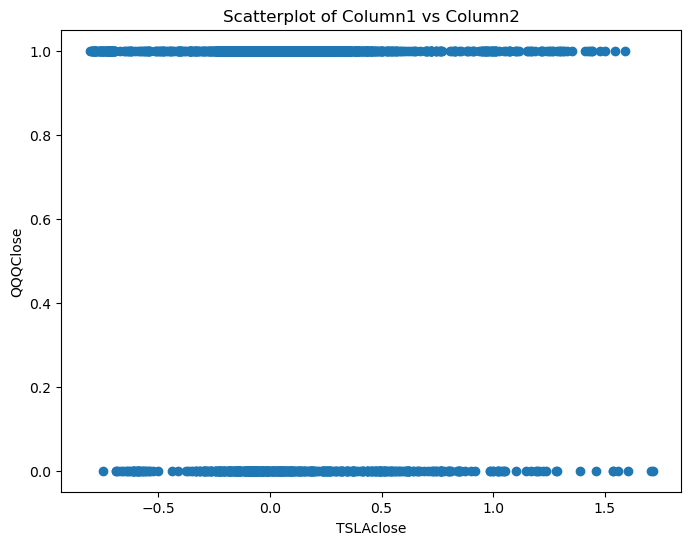

Point-Biserial Correlation Coefficient: -0.0896085352307179
P-value: 0.00011319501566308692
Pct Change Period is 60


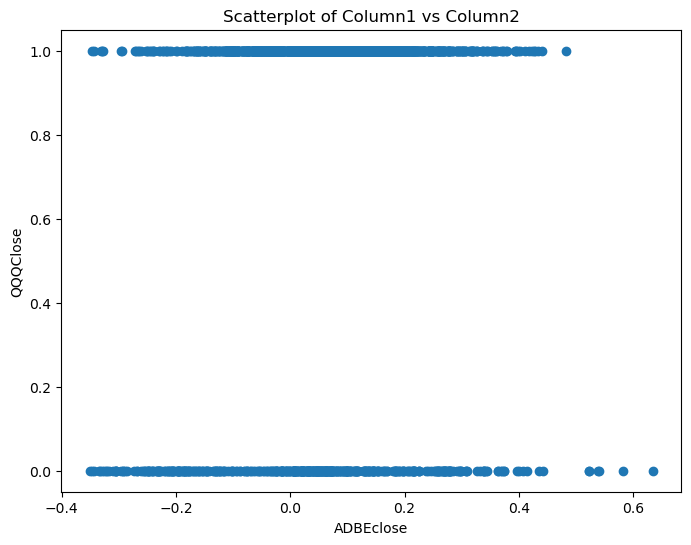

Point-Biserial Correlation Coefficient: 0.14582567731514817
P-value: 2.912262227896356e-10
Pct Change Period is 60


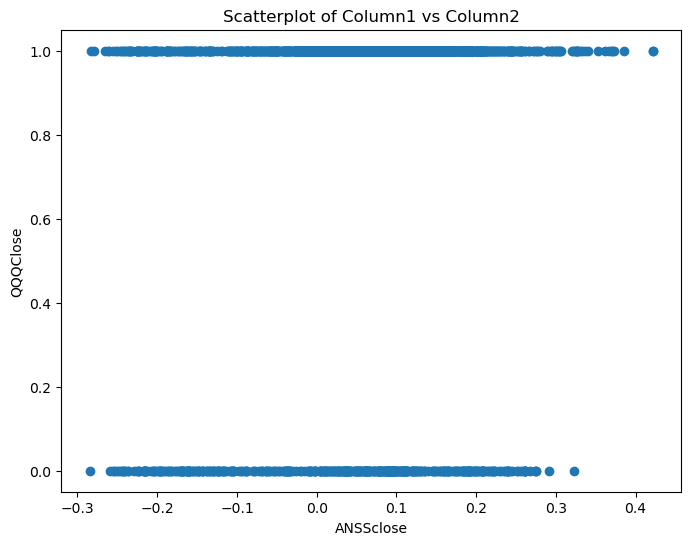

Point-Biserial Correlation Coefficient: 0.11294955134806343
P-value: 1.1060231352864878e-06
Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

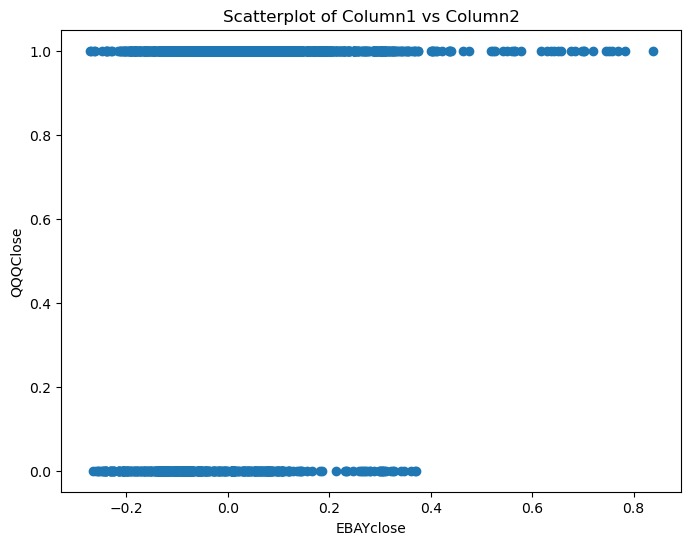

Point-Biserial Correlation Coefficient: 0.27308172075748083
P-value: 5.156046256553304e-33
Pct Change Period is 60


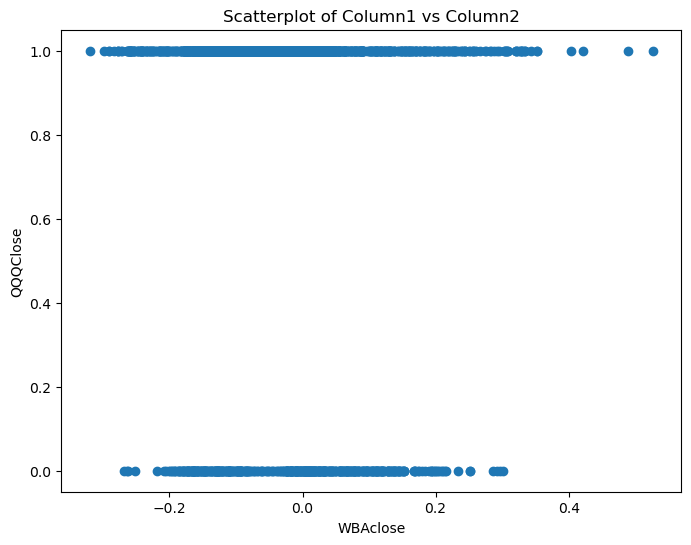

Point-Biserial Correlation Coefficient: -0.06239195854963486
P-value: 0.0072506436278435595
Pct Change Period is 60


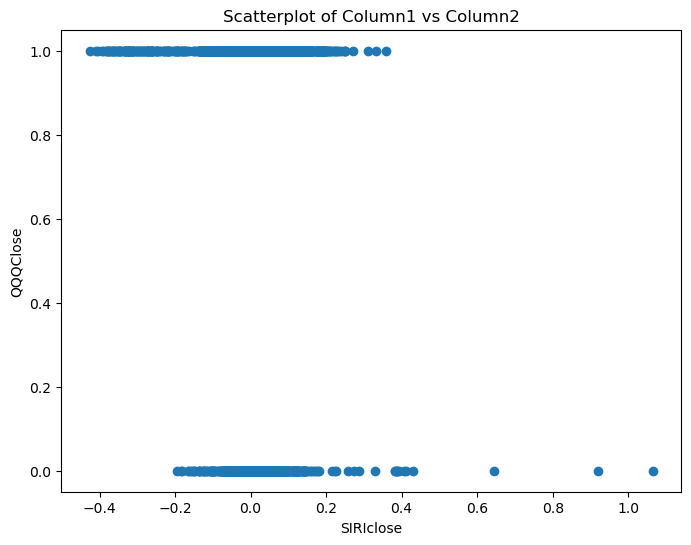

Point-Biserial Correlation Coefficient: -0.08858989516192903
P-value: 0.00013543712721481577
Pct Change Period is 60


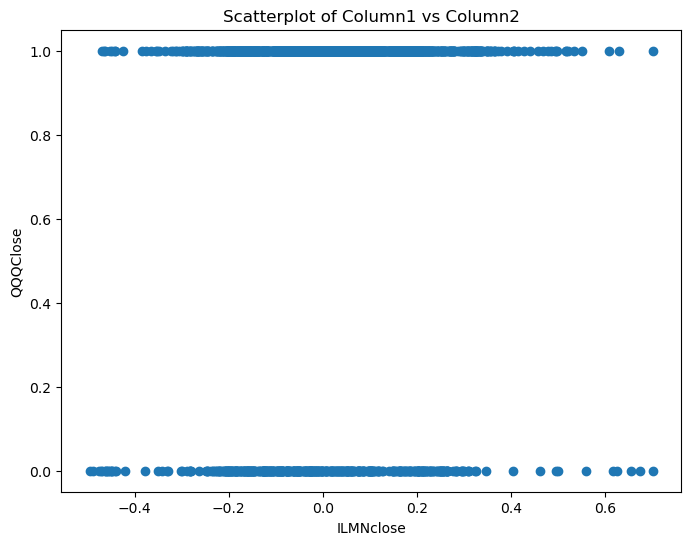

Point-Biserial Correlation Coefficient: 0.09688231427210202
P-value: 2.9772308530119793e-05
Pct Change Period is 60


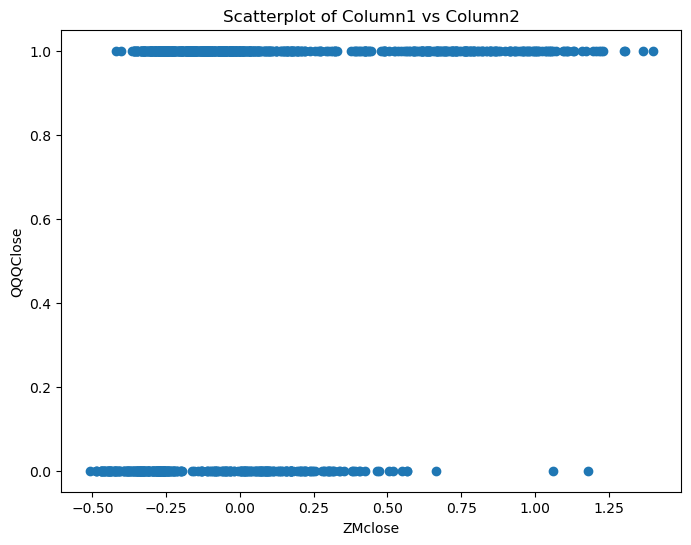

Point-Biserial Correlation Coefficient: 0.29328085352633904
P-value: 9.668453440779627e-22
Pct Change Period is 60


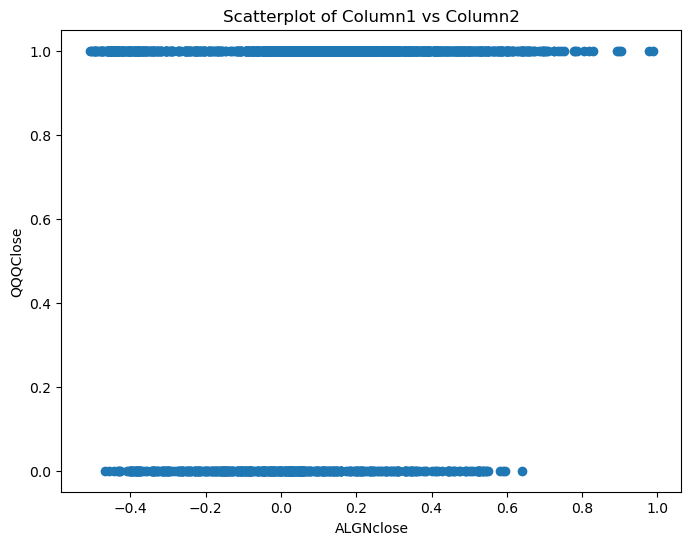

Point-Biserial Correlation Coefficient: 0.17918362145210398
P-value: 8.049850871812524e-15
Pct Change Period is 60


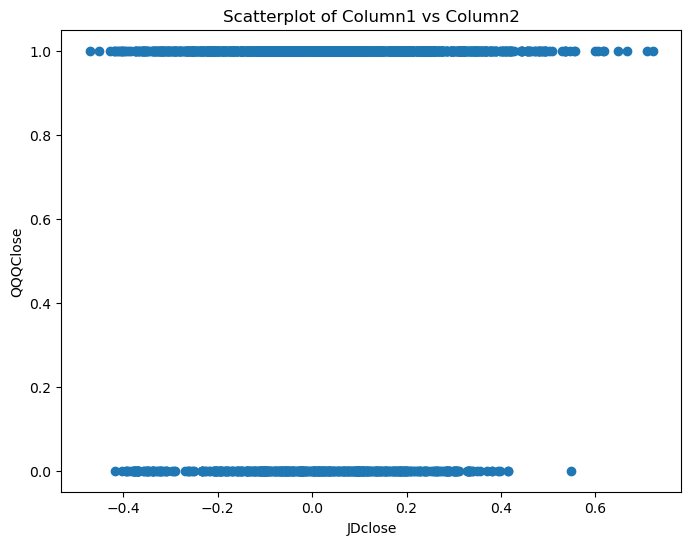

Point-Biserial Correlation Coefficient: 0.09671689301210501
P-value: 3.072321590771512e-05
Pct Change Period is 60


<Figure size 640x480 with 0 Axes>

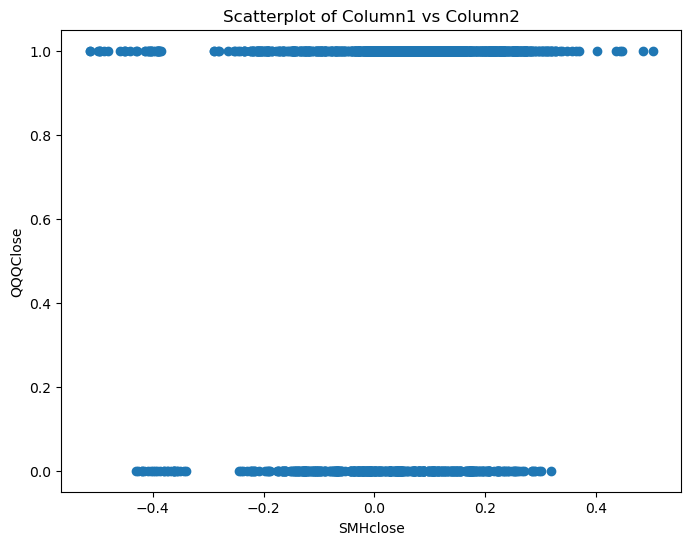

Point-Biserial Correlation Coefficient: 0.15763965417297499
P-value: 9.086750040223963e-12
Pct Change Period is 60


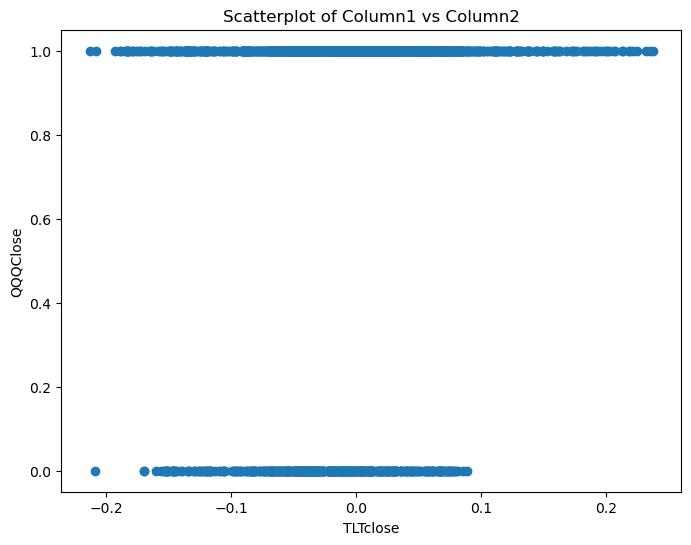

Point-Biserial Correlation Coefficient: 0.17224630788055623
P-value: 8.559369552774214e-14


<Figure size 640x480 with 0 Axes>

In [11]:
from scipy.stats import pointbiserialr

# Create scatterplots and correlation matrices

for i in range(5,61,5):
    for key1, df1 in dctStockDfs.items():
        #for key2, df2 in dctStockDfs.items():
        #display(df1.columns)
        #display(df2.columns)

        #if key1 != key2:
        dfCorr=pd.concat([df1,dfYvar],join='inner',axis=1)
        dfCorr=dfCorr.pct_change(i)
        dfCorr.iloc[:,1] = ( dfCorr.iloc[:,1] > 0).astype(int)
        dfCorr.iloc[:,1]=dfCorr.iloc[:,1].shift(-i)
        dfCorr=dfCorr.dropna()
        #display(dfCorr)
        # Create scatterplot
        plt.figure(figsize=(8, 6))
        plt.scatter(dfCorr.iloc[:,0], dfCorr.iloc[:,1])
        plt.title('Scatterplot of Column1 vs Column2')
        plt.xlabel(dfCorr.columns[0])
        plt.ylabel('QQQClose')

        #correlation_coefficient, p_value = pointbiserialr(binary_class, quantitative_variable)

        #print(f"Point-Biserial Correlation Coefficient: {correlation_coefficient}")
        #print(f"P-value: {p_value}")
        # Calculate correlation matrix
        correlation_coefficient, p_value = pointbiserialr(dfCorr.iloc[:,0],dfCorr.iloc[:,1])

        #corr = dfCorr.iloc[:,1].corr(dfCorr.iloc[:,0])
        if abs(p_value)<=0.01:
            print(f'Pct Change Period is {i}')
            plt.show()
            print(f"Point-Biserial Correlation Coefficient: {correlation_coefficient}")
            print(f"P-value: {p_value}")
        else:
            plt.close()
            plt.clf()
        del(dfCorr)


### From the visualizations above, we can see that:
#### AAPL has a negative point biserial correlation with QQQ close  over a 55 day percentage change. (0)
#### AMZN expresses a positive point biserial correation with the QQQ close (1)
#### Meta dispalys a good positive point biserial correlation with the QQQ close(1)
#### GOOGL displays a positive point biserial correlation with the QQQ close (1)
#### TESLA has a fairly negative correlation with the QQQ close (0)
#### ADBE displays a fairly positive point biserrial correlation with the QQQ clo\se (1)
#### ANSS displays a positve biserial correaltion with the QQQ close(1)
#### EBAY displays a positive biserial correaltion with the QQQ over a 60day percentage change (1)
#### WBA expresses a negative biserial correation with the QQQ close (0)
#### SIRI displays a negative biserial correation with the QQQ (0)
#### ILMN displays a fairly positive point biserial correation with the QQQ (1)
#### ZM expresses a positive biserial correation with the QQQ close (1)
#### ALGN displays a positive biserial correation with the QQQ (1)
#### JD shows a fairly positive point biserial correation over a 55 day percentage change (1)
#### SMH displays a positive point biserial correlation with the QQQ (1)
#### TLT displays a positve point biserial correlation with the QQQ (1)


In [15]:
# Putting the dataframes in the dctstockDFs into one dataframe

dfStockVars=pd.DataFrame()

dfStockVars=dctStockDfs['dfAAPL'].copy()


for key1, df1 in dctStockDfs.items():
    
    #display(df1)
    if key1!='dfAAPL':
        dfStockVars=pd.concat([dfStockVars,df1],join='inner',axis=1)
    
        
        
dfStockVars=pd.concat([dfStockVars,dfYvar],join='inner',axis=1)        
dfStockVars=dfStockVars.pct_change(55)#This is the period of time you choose in parenthesis 
dfStockVars.iloc[:,24]=dfStockVars.iloc[:,24].shift(-55)#This is the period of time you choose in parenthesis 
#dfStockVars.iloc[:,24] = ( dfStockVars.iloc[:,1] > 0).astype(int)#Comment out this line if you are doing regression

    
dfStockVars=dfStockVars.dropna()
display(dfStockVars)    
print(dfStockVars.shape)
dfStockVars['QQQClose(YVar)'].value_counts()

,AAPLclose,MSFTclose,AMZNclose,NVDAclose,METAclose,AVGOclose,GOOGLclose,TSLAclose,ADBEclose,ANSSclose,...,ILMNclose,ZMclose,ALGNclose,JDclose,ENPHclose,LCIDclose,SMHclose,TLTclose,SGOVclose,QQQClose(YVar)
timestamp,,,,,,,,,,,,,,,,,,,,,
2020-12-07 05:00:00+00:00,0.158274,0.069365,0.068730,0.116291,0.130876,0.170016,0.252183,0.451453,0.052829,0.120657,...,0.160135,-0.070385,0.612954,0.120671,0.894243,0.005056,0.311226,-0.042612,0.000000,0.022425
2020-12-08 05:00:00+00:00,0.129906,0.066505,0.073238,0.066528,0.142051,0.203587,0.266540,0.446138,0.041292,0.103787,...,0.268722,-0.120541,0.600248,0.091575,0.905260,0.000000,0.312326,-0.042944,-0.000100,0.049629
2020-12-09 05:00:00+00:00,0.088275,0.021117,-0.007923,0.023185,0.090952,0.151083,0.217862,0.424887,-0.006245,0.060582,...,0.257905,-0.217702,0.577983,0.090933,0.761872,0.004049,0.261356,-0.045352,-0.000100,0.056719
2020-12-10 05:00:00+00:00,0.150485,0.049504,0.033878,0.069987,0.112842,0.166245,0.254542,0.648622,0.013776,0.104082,...,0.259011,-0.204923,0.648904,0.095455,0.867226,0.006091,0.291830,-0.038179,-0.000050,0.021949
2020-12-11 05:00:00+00:00,0.131122,0.049560,0.031999,0.053875,0.096261,0.151197,0.247347,0.572991,0.017619,0.101097,...,0.194544,-0.146178,0.625882,0.136001,1.015704,0.017400,0.270233,-0.038457,0.000050,0.007454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-08 04:00:00+00:00,0.027135,0.023641,0.184427,0.409937,0.266518,0.302788,0.069771,0.411612,0.444386,-0.014695,...,-0.075165,-0.028477,0.219242,0.062849,-0.170718,-0.013717,0.143987,-0.050383,-0.001394,-0.058226
2023-08-09 04:00:00+00:00,0.017298,0.012220,0.185806,0.361118,0.242509,0.246948,0.056207,0.344454,0.383919,-0.026574,...,-0.099434,-0.040652,0.212413,0.074444,-0.147256,-0.013928,0.127532,-0.038675,-0.001195,-0.065913
2023-08-10 04:00:00+00:00,0.021642,0.005449,0.204765,0.359636,0.231234,0.242537,0.037105,0.298989,0.386453,-0.027224,...,-0.113622,-0.055174,0.154240,0.069464,-0.171212,-0.113725,0.125985,-0.051122,-0.000995,-0.063160


(675, 25)


QQQClose(YVar)
 0.022425    1
 0.052047    1
-0.007803    1
 0.004981    1
-0.005807    1
            ..
-0.050840    1
-0.066360    1
-0.096029    1
-0.101429    1
-0.052599    1
Name: count, Length: 675, dtype: int64

In [16]:
#dfStockVars.describe()

### BUilding Models: Regression

In [17]:
dfStockVars1 = dfStockVars.copy()
dfStockVars1.describe()

,AAPLclose,MSFTclose,AMZNclose,NVDAclose,METAclose,AVGOclose,GOOGLclose,TSLAclose,ADBEclose,ANSSclose,...,ILMNclose,ZMclose,ALGNclose,JDclose,ENPHclose,LCIDclose,SMHclose,TLTclose,SGOVclose,QQQClose(YVar)
count,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,...,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000
mean,0.045548,0.044010,-0.075420,0.060759,0.039049,0.079687,-0.031293,0.041307,0.016967,0.009856,...,-0.021299,-0.127206,0.021759,-0.045861,0.088993,0.105162,0.001535,-0.034635,0.000326,0.015726
std,0.113026,0.110666,0.295399,0.359155,0.263865,0.144923,0.302489,0.397105,0.177450,0.138186,...,0.182620,0.173744,0.272842,0.184523,0.347573,0.712013,0.179450,0.068957,0.001055,0.096203
min,-0.273245,-0.264554,-0.969388,-0.747727,-0.495515,-0.224936,-0.958874,-0.800317,-0.349133,-0.305051,...,-0.501017,-0.509967,-0.492604,-0.417763,-0.503477,-0.675789,-0.508379,-0.219093,-0.002892,-0.268865
25%,-0.041250,-0.042936,-0.126326,-0.182404,-0.133805,-0.013989,-0.095054,-0.192468,-0.102131,-0.088043,...,-0.127440,-0.273334,-0.152327,-0.173007,-0.172516,-0.291879,-0.102215,-0.082701,-0.000050,-0.045891
50%,0.042855,0.061574,0.011812,0.058038,-0.007538,0.059890,0.052686,0.001749,0.013315,0.015852,...,-0.040258,-0.127728,0.001285,-0.045628,0.006333,-0.086902,0.033939,-0.034195,0.000050,0.029139
75%,0.142518,0.125590,0.062813,0.336107,0.177199,0.156230,0.149910,0.265499,0.122272,0.107239,...,0.082548,-0.002205,0.151398,0.081619,0.302967,0.124274,0.122043,0.010166,0.000250,0.080048
max,0.294096,0.332354,0.340902,0.899476,0.736106,0.504507,0.364559,1.177585,0.607530,0.368185,...,0.672221,0.354823,0.738275,0.723131,1.162198,4.905392,0.403544,0.166234,0.004396,0.226825


In [18]:
#Divide into traninng and test sets based on time

from sklearn.model_selection import train_test_split
x=dfStockVars1.drop(columns=['QQQClose(YVar)'])
y=dfStockVars1['QQQClose(YVar)']
# Split the data into training and testing sets

x_train, x_test, y_train, y_test = train_test_split(x, y, train_size=2/3, shuffle=False)


# Display the training and testing sets
print(f"Training Set: {x_train}")


print(f"Testing Set:{x_test}")

display(y_train.shape)
display(y_test.shape)


Training Set:                            AAPLclose  MSFTclose  AMZNclose  NVDAclose  \
timestamp                                                               
2020-12-07 05:00:00+00:00   0.158274   0.069365   0.068730   0.116291   
2020-12-08 05:00:00+00:00   0.129906   0.066505   0.073238   0.066528   
2020-12-09 05:00:00+00:00   0.088275   0.021117  -0.007923   0.023185   
2020-12-10 05:00:00+00:00   0.150485   0.049504   0.033878   0.069987   
2020-12-11 05:00:00+00:00   0.131122   0.049560   0.031999   0.053875   
...                              ...        ...        ...        ...   
2022-09-14 04:00:00+00:00   0.096357  -0.047831   0.135400  -0.221768   
2022-09-15 04:00:00+00:00   0.108629  -0.043278   0.175791  -0.191027   
2022-09-16 04:00:00+00:00   0.082382  -0.059633   0.134135  -0.150817   
2022-09-19 04:00:00+00:00   0.129901  -0.047931   0.173712  -0.117224   
2022-09-20 04:00:00+00:00   0.129346  -0.065991   0.115279  -0.092749   

                           METAclose

(450,)

(225,)

## *Regression Analysis*

#### Building Models:  I'll first build a simple least squares regression model to see how it performs on the training and test data:

In [19]:
from sklearn.linear_model import LinearRegression


linreg1 = LinearRegression()

# Training the model using the training set
linreg1.fit(x_train,y_train)

LinearRegression()

In [20]:
w = linreg1.coef_
print(w)

[-0.22860131 -0.44109512  0.06446594 -0.05581854  0.34405082 -0.10158791
  0.00908336 -0.00473491  0.17643803 -0.13787175  0.14970667 -0.06399086
  0.01695404  0.32598474 -0.34036622 -0.09550707  0.07415208  0.0016483
 -0.01745211  0.01170914 -0.0043543   0.02333571  0.16001337  1.20930479]


In [21]:
#calling the columns to correspond to the weights
for i, feature_name in enumerate(x.columns):
    print("%2s   %2.2f" % (feature_name, linreg1.coef_[i]))

AAPLclose   -0.23
MSFTclose   -0.44
AMZNclose   0.06
NVDAclose   -0.06
METAclose   0.34
AVGOclose   -0.10
GOOGLclose   0.01
TSLAclose   -0.00
ADBEclose   0.18
ANSSclose   -0.14
ZSclose   0.15
DDOGclose   -0.06
EBAYclose   0.02
WBAclose   0.33
SIRIclose   -0.34
ILMNclose   -0.10
ZMclose   0.07
ALGNclose   0.00
JDclose   -0.02
ENPHclose   0.01
LCIDclose   -0.00
SMHclose   0.02
TLTclose   0.16
SGOVclose   1.21


In [22]:
w0 = linreg1.intercept_

print("Linear Regression Intercept: ", w0)

Linear Regression Intercept:  0.04615043813860455


### From the weights, if AAPL stock decreases by -0.23 units, There will be a corresponding increase in the close of the QQQ by 0.23 units. in the smae vein, if a 0.34 increase in the closing price of META stock, will correspond to a 0.34 unit increase in the closing price of the QQQ over a 60day  percent change period. The same applies for all the stocks in their corressponding weight used with the intercept.

#### Lets evaluate the model (R2, RMSE, MAE, Cross Validation)

In [23]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
from sklearn.metrics import r2_score

# predicting on train data
pred_train = linreg1.predict(x_train)

# Calculating  RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, pred_train))

# Calculating MAE
mae_train = mean_absolute_error(y_train, pred_train)

r2_train = r2_score(y_train, pred_train)


print("RMSE on training data:", rmse_train)
print("MAE on training data:", mae_train)
print("R-squared score:", r2_train)

RMSE on training data: 0.038423975433524576
MAE on training data: 0.02994933525608691
R-squared score: 0.8280618370492926


##### The R-sqaured value seems quite high and is suspicious of overfitting the data. We'll investigate further by comparing the RMSE and MAE on the Test SET

In [24]:
pred_test = linreg1.predict(x_test)

rmse_test = np.sqrt(mean_squared_error(pred_test, y_test))
print("RMSE on Test Data: ", rmse_test)

mae_test = mean_absolute_error(pred_test, y_test)
print("MAE on Test Data: ", mae_test)

RMSE on Test Data:  0.09912045094349367
MAE on Test Data:  0.07854114306899707


In [25]:
### comparing RMSE and MAE on training and Test Sets

RMSE_diff = np.subtract(rmse_train, rmse_test)
MAE_diff = np.subtract(mae_train, mae_test)

print("Difference between RMSE_train and RMSE_test:", RMSE_diff)
print("Difference between MAE_train and MAE_test:", MAE_diff)

Difference between RMSE_train and RMSE_test: -0.060696475509969094
Difference between MAE_train and MAE_test: -0.04859180781291016


#### A negative difference on the RMSE and MAE between of the model between the train and test sets is indication that the model is overfitting the training data and performs worse on the test data. It then mean that we need to use a regression model that penalizes the weights and deals with overfiiting. Hnce our second regression model :Lasso Regression

In [26]:
#Before the Lasso model, Lets visualise how the Least squares regression compares the predicted and the actaul on the training and test sets.

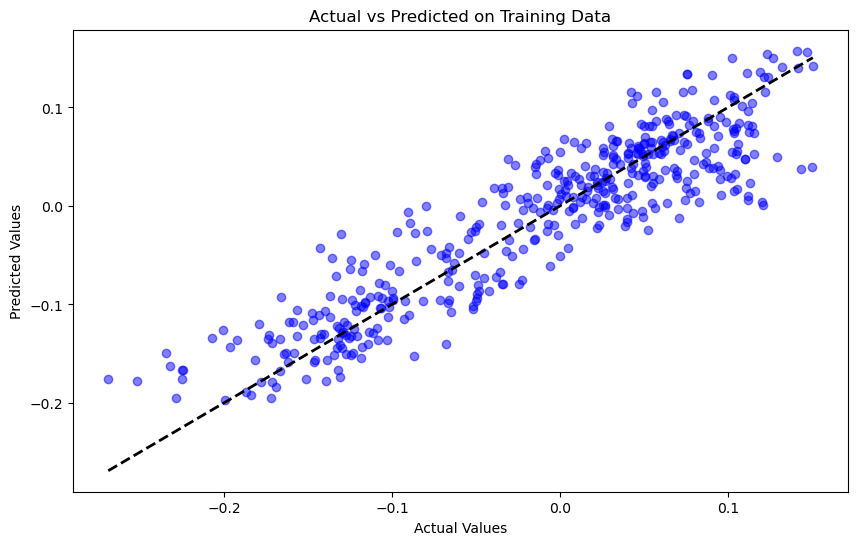

In [27]:
# Plot predicted against actual (in the training data)

plt.figure(figsize=(10, 6))
plt.scatter(y_train, pred_train, color='blue', alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)  # Diagonal line
plt.title('Actual vs Predicted on Training Data')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

Text(0.5, 1.0, 'Actual vs Predicted Close Prices on Training Data over a 55 day percentage change')

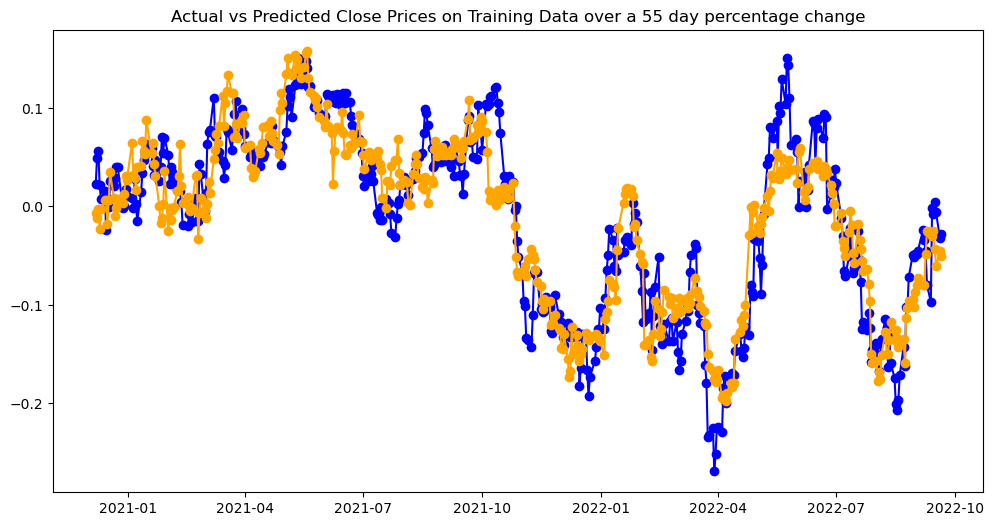

In [28]:
#plotting time series of the QQQ close of the predicted vs actual

# Sorting the DataFrame by timestamp
x_train_sorted = x_train.sort_index()

# Sort the corresponding actual and predicted values accordingly
y_train_sorted = y_train.sort_index()
pred_train_sorted = pd.Series(pred_train, index=x_train.index).sort_index()


plt.figure(figsize=(12, 6))

# Plotting the actual close prices
plt.plot(x_train_sorted.index, y_train_sorted, label='Actual Close', color='blue', marker='o')

# Plotting the predicted close prices below the actual
plt.plot(x_train_sorted.index, pred_train_sorted, label='Predicted Close', color='orange', marker='o')

plt.title('Actual vs Predicted Close Prices on Training Data over a 55 day percentage change')

#### Plotting graphs for the test data as well.

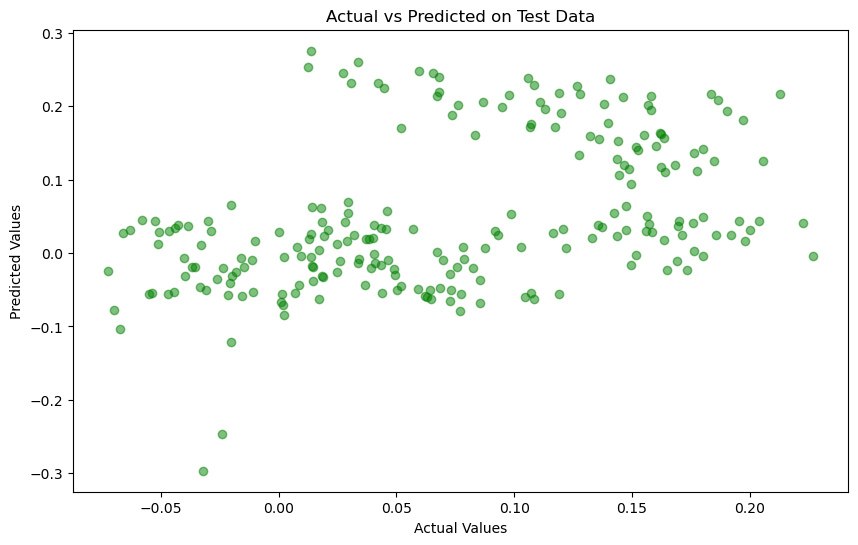

In [29]:
# Plot predicted against actual of model (in the test data)

plt.figure(figsize=(10, 6))
plt.scatter(y_test, pred_test, color='green', alpha=0.5)
plt.title('Actual vs Predicted on Test Data')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

Text(0.5, 1.0, 'Actual vs Predicted Close Prices for QQQ on Test Data over a 55 day percentage change')

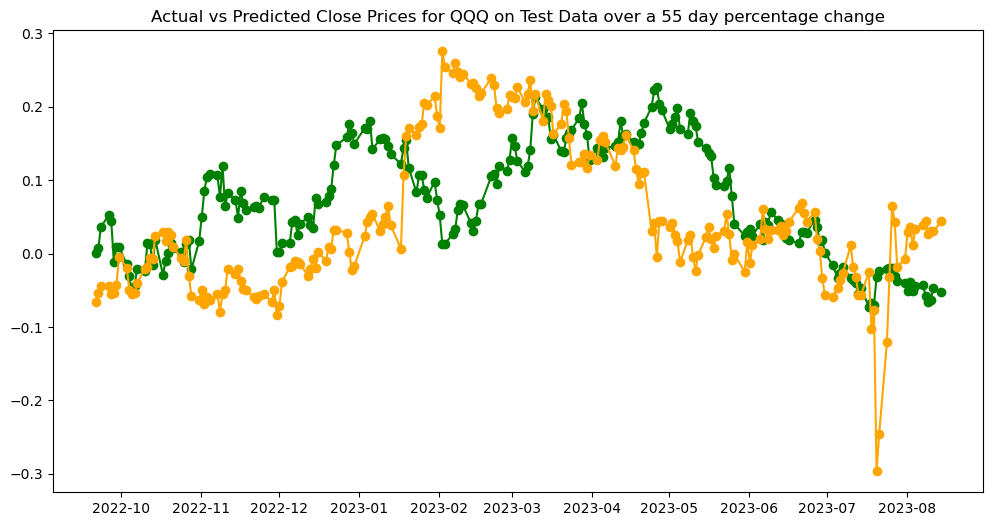

In [30]:
#plotting time series of the QQQ close of the predicted vs actual on the test data
# Sorting the DataFrame by timestamp
x_test_sorted = x_test.sort_index()

# Sort the corresponding actual and predicted values accordingly
y_test_sorted = y_test.sort_index()
pred_test_sorted = pd.Series(pred_test, index=x_test.index).sort_index()


plt.figure(figsize=(12, 6))

# Plotting the actual close prices
plt.plot(x_test_sorted.index, y_test_sorted, label='Actual Close', color='green', marker='o')

# Plotting the predicted close prices below the actual
plt.plot(x_test_sorted.index, pred_test_sorted, label='Predicted Close', color='orange', marker='o')

plt.title('Actual vs Predicted Close Prices for QQQ on Test Data over a 55 day percentage change')

#### *As stated above, the least squares regression  model seems to overfit on the training data, may be due to multicolinearity in the data, so we fix that by making a lasso reggression to do both feature selection and solve overfitting.*

In [31]:
from sklearn.linear_model import Lasso

In [33]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score

Lasso Regression
Optimal Alpha: 0.004
Minimum Gap: -0.08025503709410076


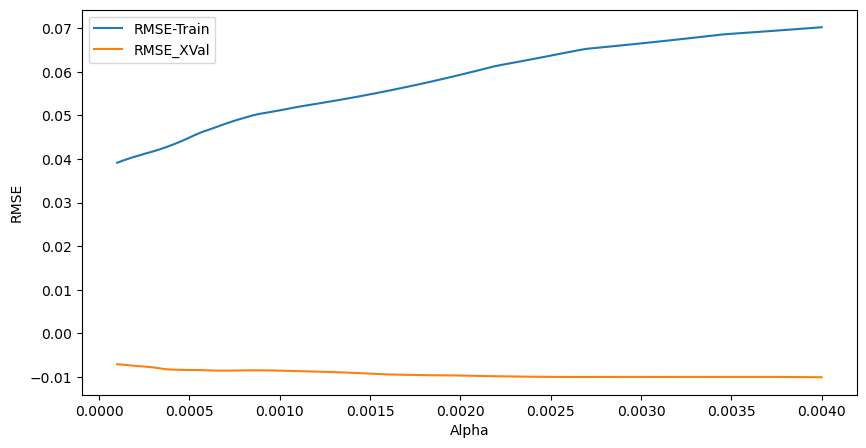

In [34]:
# Let's get a range of alphas to select the best alpha for the model

from sklearn.linear_model import Lasso
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt

print('Lasso Regression')

alpha = np.linspace(0.0001, 0.004, 100)
train_rmse = np.array([])
cv_rmse = np.array([])

min_gap = float('inf')  # Initializing min_gap with positive infinity

for a in alpha:
    lasso = Lasso(alpha=a)
    
    # computing the RMSE on training data
    lasso.fit(x_train, y_train)
    pr_train = lasso.predict(x_train)
    rmse_train = np.sqrt(mean_squared_error(pr_train, y_train))

    # Compute RMSE using 10-fold cross-validation
    rmse_10cv = np.mean(cross_val_score(lasso, x_train, y_train, cv=10, scoring='neg_mean_squared_error'))
    
    gap = rmse_10cv - rmse_train
    
    train_rmse = np.append(train_rmse, [rmse_train])
    cv_rmse = np.append(cv_rmse, [rmse_10cv]) 

    if gap < min_gap:
        min_gap = gap
        optimal_alpha = a

# Print the optimal alpha and the corresponding minimum gap
print(f"Optimal Alpha: {optimal_alpha}")
print(f"Minimum Gap: {min_gap}")

# Plotting the results
plt.figure(figsize=(10, 5))
plt.plot(alpha, train_rmse, label='RMSE-Train')
plt.plot(alpha, cv_rmse, label='RMSE_XVal')
plt.legend(['RMSE-Train', 'RMSE_XVal'])
plt.ylabel('RMSE')
plt.xlabel('Alpha')
plt.show()

alpha = 0.004 seems to be the optimal alpha that minimizes the gap in the RMSE between the training RMSE of the lasso regression and the Cross validation RMSE.

In [35]:
#using alpha = 0.004 to builds our lasso modela and train the model

lasso = Lasso(alpha=0.004)

lasso.fit(x_train, y_train)

pred2_train = lasso.predict(x_train) # p_train is the array of predicted training values
rmse_train_lasso = np.sqrt(mean_squared_error(pred2_train, y_train))

# Compute fitting test data snd computing RMSE on the set test data

pred2_test = lasso.predict(x_test) 
rmse_test_lasso = np.sqrt(mean_squared_error(pred2_test, y_test))

# Compute MAE on the training set
mae_train_lasso = mean_absolute_error(y_train, pred2_train)

# Compute MAE on the test set
mae_test_lasso = mean_absolute_error(y_test, pred2_test)

r_squared_train = lasso.score(x_train, y_train)
r_squared_test = lasso.score(x_test, y_test)

method_name = 'Lasso Regression'
print("\n")
print('Method: %s' %method_name)
print('RMSE on training: %.4f' %rmse_train_lasso)
print('RMSE on test data: %.4f' %rmse_test_lasso)
print("\n")
print("MAE on Training Set:", mae_train_lasso)
print("MAE on Test Set:", mae_test_lasso)
print("\n")
print("R-squared on Training Set:", r_squared_train)
print("R-squared on Test Set:", r_squared_test)



Method: Lasso Regression
RMSE on training: 0.0702
RMSE on test data: 0.0949


MAE on Training Set: 0.057431850943867525
MAE on Test Set: 0.07979180758183571


R-squared on Training Set: 0.42570122742299954
R-squared on Test Set: -0.5393196240019469


#### To check that the model is not overfitting the training data, as before we compute the diffence between the RMSE of the training and test sets and the difference between the MAE of the train and test sets for the lasso regression model.

In [36]:
### comparing RMSE and MAE on training and Test Sets

RMSE_dif_lasso = np.subtract(rmse_train_lasso, rmse_test_lasso)
MAE_diff_lasso = np.subtract(mae_train_lasso, mae_test_lasso)

print("Difference between RMSE_train and RMSE_test:", RMSE_dif_lasso)
print("Difference between MAE_train and MAE_test:", MAE_diff_lasso)

Difference between RMSE_train and RMSE_test: -0.02463315969517564
Difference between MAE_train and MAE_test: -0.022359956637968185


#### The negative difference betwen the RMSE on the train and test set of the lasso model and the negative diffrence between the MAE of the train and test sets of the lasso model indicate some overfitting. Even though it does better than the least squares regression model, it doesnt totally eliminate overftting.

#### Plotting the predicted vs the actual of the lasso regression model on the training and test data. 

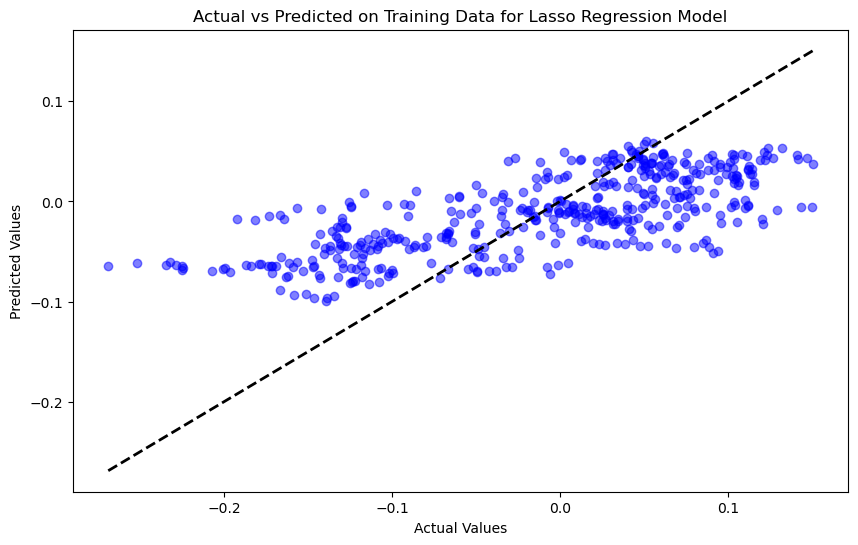

In [37]:

# Ploting predicted against actual (in the training data)
plt.figure(figsize=(10, 6))
plt.scatter(y_train, pred2_train, color='blue', alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)  # Diagonal line
plt.title('Actual vs Predicted on Training Data for Lasso Regression Model')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

### The model doesnt seem to perfom very well on the trian data and test Data with low R-sqaured values. The R-squared value on the train set is low(R-squared on Training Set: 0.4257) and the r-squared on the predicted test set of the lasso model is -0.539.

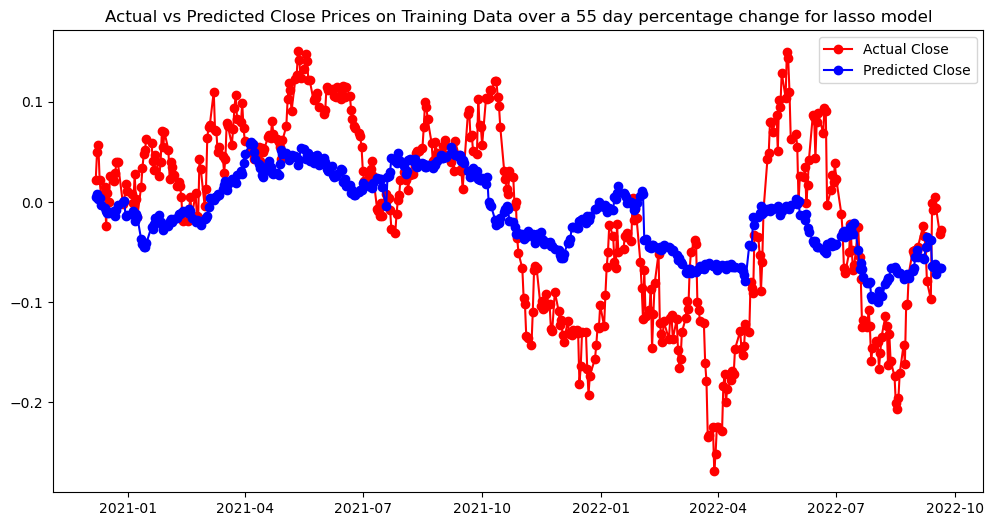

In [38]:
#Plotting the actual and predicted close of the QQQ  for the training dats for the lasso model
# Sorting the DataFrame by timestamp
x_train_sorted = x_train.sort_index()

# Sort the corresponding actual and predicted values accordingly
y_train_sorted = y_train.sort_index()
pred2_train_sorted = pd.Series(pred2_train, index=x_train.index).sort_index()


plt.figure(figsize=(12, 6))

# Plotting the actual close prices
plt.plot(x_train_sorted.index, y_train_sorted, label='Actual Close', color='red', marker='o')

# Plotting the predicted close prices below the actual
plt.plot(x_train_sorted.index, pred2_train_sorted, label='Predicted Close', color='blue', marker='o')
plt.legend(['Actual Close', 'Predicted Close'])
plt.title('Actual vs Predicted Close Prices on Training Data over a 55 day percentage change for lasso model')
plt.show()

### As we can see, the model follows the general patten of the highs and lows of the QQQ close on the training data.

In [39]:
#Plotting predicted vs actual for the test data for the lasso model. 

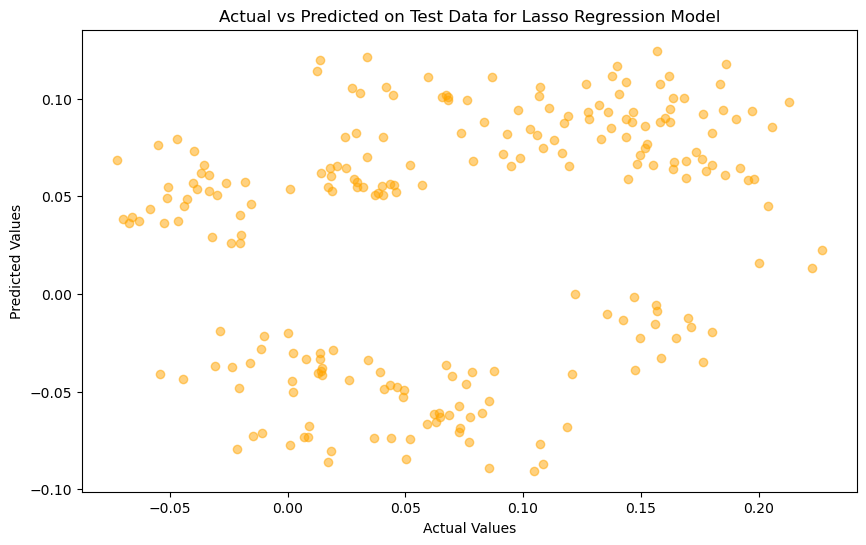

In [40]:
# Ploting predicted against actual (in the training data)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, pred2_test, color='orange', alpha=0.5)
#plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)  # Diagonal line
plt.title('Actual vs Predicted on Test Data for Lasso Regression Model')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

#### Showing the time series of the actual QQQ close vs the predicted close for the lasso model on the test data

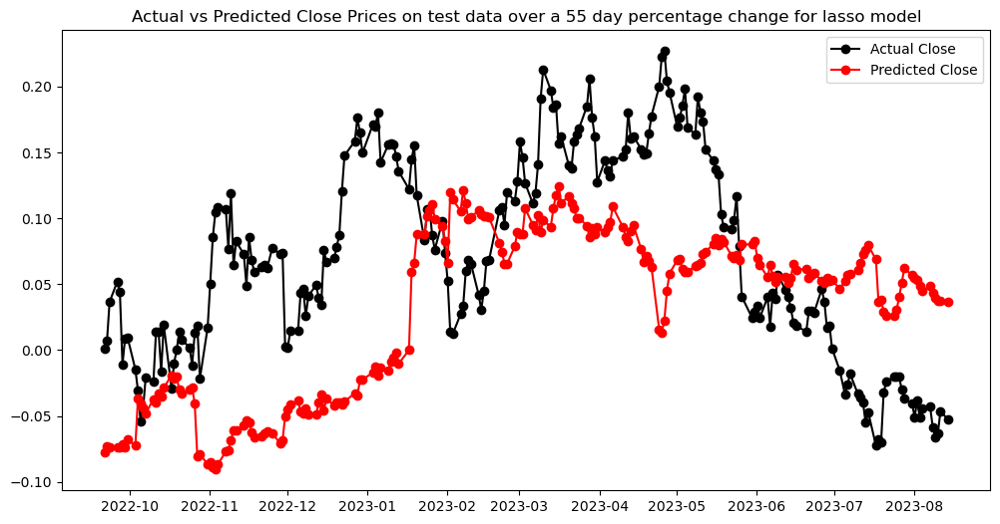

In [41]:
 #Sorting the DataFrame by timestamp
x_test_sorted = x_test.sort_index()

# Sort the corresponding actual and predicted values accordingly
y_test_sorted = y_test.sort_index()
pred2_test_sorted = pd.Series(pred2_test, index=x_test.index).sort_index()


plt.figure(figsize=(12, 6))

# Plotting the actual close prices
plt.plot(x_test_sorted.index, y_test_sorted, label='Actual Close', color='black', marker='o')

# Plotting the predicted close prices below the actual
plt.plot(x_test_sorted.index, pred2_test_sorted, label='Predicted Close', color='red', marker='o')
plt.legend(['Actual Close', 'Predicted Close'])
plt.title('Actual vs Predicted Close Prices on test data over a 55 day percentage change for lasso model')
plt.show()

### Because the lasso model doesn't seem to perform so well on the test data.  The R-sqaured value on the test set is also very low and is negative (R-squared on Test Set: -0.5393) I will use PCA to transform the data then run a reggression with the eigen vectors to deal with multicolineairty and see if we can get a better prediction model for the data. 

In [42]:
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression

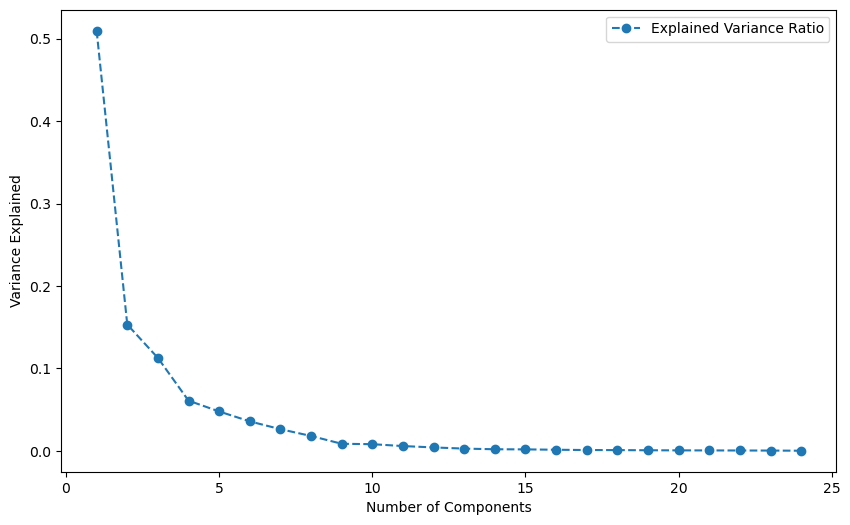

In [43]:
#First we get the number of components that capture the variance in the training data

pca = PCA()
X_train_pca = pca.fit_transform(x_train)

#explained variance ratio for each component
explained_variance_ratio = pca.explained_variance_ratio_

#the cumulative explained variance
#cumulative_explained_variance = np.cumsum(explained_variance_ratio)

#the scree plot
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--', label='Explained Variance Ratio')
plt.xlabel('Number of Components')
plt.ylabel('Variance Explained')
plt.legend()
plt.show()

In [44]:
#from the screeplot, 5 components are enough to cover over 50% of the data at the elbow point.

In [45]:
dfStockVars1.describe()

,AAPLclose,MSFTclose,AMZNclose,NVDAclose,METAclose,AVGOclose,GOOGLclose,TSLAclose,ADBEclose,ANSSclose,...,ILMNclose,ZMclose,ALGNclose,JDclose,ENPHclose,LCIDclose,SMHclose,TLTclose,SGOVclose,QQQClose(YVar)
count,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,...,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000,675.000000
mean,0.045548,0.044010,-0.075420,0.060759,0.039049,0.079687,-0.031293,0.041307,0.016967,0.009856,...,-0.021299,-0.127206,0.021759,-0.045861,0.088993,0.105162,0.001535,-0.034635,0.000326,0.015726
std,0.113026,0.110666,0.295399,0.359155,0.263865,0.144923,0.302489,0.397105,0.177450,0.138186,...,0.182620,0.173744,0.272842,0.184523,0.347573,0.712013,0.179450,0.068957,0.001055,0.096203
min,-0.273245,-0.264554,-0.969388,-0.747727,-0.495515,-0.224936,-0.958874,-0.800317,-0.349133,-0.305051,...,-0.501017,-0.509967,-0.492604,-0.417763,-0.503477,-0.675789,-0.508379,-0.219093,-0.002892,-0.268865
25%,-0.041250,-0.042936,-0.126326,-0.182404,-0.133805,-0.013989,-0.095054,-0.192468,-0.102131,-0.088043,...,-0.127440,-0.273334,-0.152327,-0.173007,-0.172516,-0.291879,-0.102215,-0.082701,-0.000050,-0.045891
50%,0.042855,0.061574,0.011812,0.058038,-0.007538,0.059890,0.052686,0.001749,0.013315,0.015852,...,-0.040258,-0.127728,0.001285,-0.045628,0.006333,-0.086902,0.033939,-0.034195,0.000050,0.029139
75%,0.142518,0.125590,0.062813,0.336107,0.177199,0.156230,0.149910,0.265499,0.122272,0.107239,...,0.082548,-0.002205,0.151398,0.081619,0.302967,0.124274,0.122043,0.010166,0.000250,0.080048
max,0.294096,0.332354,0.340902,0.899476,0.736106,0.504507,0.364559,1.177585,0.607530,0.368185,...,0.672221,0.354823,0.738275,0.723131,1.162198,4.905392,0.403544,0.166234,0.004396,0.226825


Explained Variance Ratio: [0.50969246 0.15315126 0.11259683 0.06076424 0.04762916]
Root Mean Squared Error: 0.10888719434159799
R-squared: -1.028349906296163


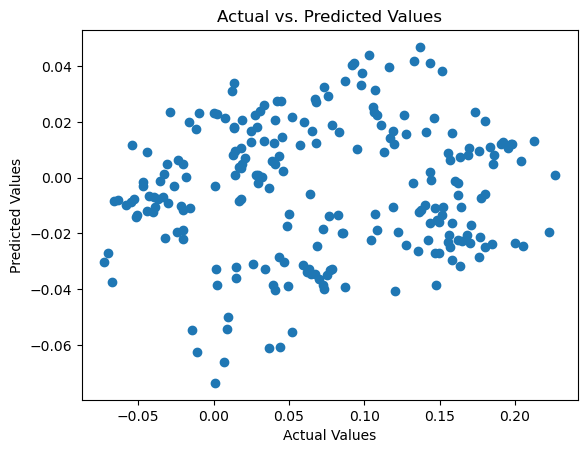

In [46]:

num_components = 5  
pca = PCA(n_components=5)
x_train_pca1 = pca.fit_transform(x_train)
x_test_pca1 = pca.transform(x_test)

# Checking the explained variance ratio
print("Explained Variance Ratio:", pca.explained_variance_ratio_)

# Now, using the PCA-transformed data to build a linear regression model
model3 = LinearRegression()

# Fit the model on the training data
model3.fit(x_train_pca1, y_train)

# Making predictions on the test data
y_pred3 = model3.predict(x_test_pca1)

# Evaluating the model
rmse = np.sqrt(mean_squared_error(y_pred3, y_test))
r_squared = r2_score(y_test, y_pred3)

print("Root Mean Squared Error:", rmse)
print("R-squared:", r_squared)

#coefficients = model.coef_
#intercept = model.intercept_

# Plot actual vs. predicted values
plt.scatter(y_test, y_pred3)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values")
plt.show()

In [47]:
#low R-squared value. Lets check vif for existence of multicolinearity

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data = pd.DataFrame()
vif_data["PC"] = range(1, x_train_pca1.shape[1] + 1)
vif_data["VIF"] = [variance_inflation_factor(x_train_pca1, i) for i in range(x_train_pca1.shape[1])]

print(vif_data)

   PC  VIF
0   1  1.0
1   2  1.0
2   3  1.0
3   4  1.0
4   5  1.0


In [48]:
#vif scores say there is no multicolinearity in the PCA transformed data. 

In [49]:
x=dfStockVars1.drop(columns=['QQQClose(YVar)'])
y=dfStockVars1['QQQClose(YVar)']

pca1 = PCA()
X_pca = pca1.fit_transform(x)

# Create a linear regression model
model4 = LinearRegression()

# Define scoring metrics
scoring = {
    'neg_mean_squared_error': 'neg_mean_squared_error',
    'neg_mean_absolute_error': 'neg_mean_absolute_error'
}

# Perform cross-validation
cv_rmse = -cross_val_score(model4, X_pca, y, cv=10, scoring=scoring['neg_mean_squared_error'])
cv_mae = -cross_val_score(model4, X_pca, y, cv=10, scoring=scoring['neg_mean_absolute_error'])

# mean RMSE and MAE
mean_cv_rmse = np.sqrt(np.mean(cv_rmse))
mean_cv_mae = np.mean(cv_mae)

print("Cross validation RMSE:", mean_cv_rmse)
print("Cross validation MAE:", mean_cv_mae)
print("\n")
print("Root Mean Squared Error on model3:", rmse)

Cross validation RMSE: 0.09207063849506573
Cross validation MAE: 0.07311604184257653


Root Mean Squared Error on model3: 0.10888719434159799


In [50]:
#comparing with cross validation RMSE with RMSE of the PCA transformed linear regression model

gap_ = mean_cv_rmse - rmse
    
print(f'DIffernce between cross val RMSE and RMSE for PCA transformed linear reg model: {gap_}')

DIffernce between cross val RMSE and RMSE for PCA transformed linear reg model: -0.016816555846532258


#the difference between the RMSE of the 10 cross validation on the PCA transformed data and The RMSE of Model3 (PCA trnasfomred lnear regression model) is low. Despite the low R-sqaured value of the model, it shows the model may performing better than the previous lasso regression model

In [51]:
#note these are the coefficients of the principal components. I was trying to bring out the scores but...
coefficients = model3.coef_

# Get the intercept
intercept = model3.intercept_

print("Coefficients:", coefficients)
print("Intercept:", intercept)

Coefficients: [ 0.00409814 -0.00799586 -0.09103486  0.10291288  0.00494021]
Intercept: -0.012276845744446424


In [52]:

# Get the loadings of the principal components on the original features
original_feature_loadings = pca.components_

# Identify the original features contributing to each principal component
contributing_features = []

for i in range(len(coefficients)):
    # Find indices of top features contributing to the i-th principal component
    top_feature_indices = np.argsort(np.abs(original_feature_loadings[i]))[::-1][:5]
    
    # Append the names of the top features to the list
    top_features = x.columns[top_feature_indices]
    contributing_features.append(top_features)

# Print the contributing features for each principal component
for i, features in enumerate(contributing_features):
    print(f"Coefficient {i + 1}: {coefficients[i]} (Principal Component) -> {features}")

Coefficient 1: 0.0040981447834120424 (Principal Component) -> Index(['LCIDclose', 'TSLAclose', 'ZSclose', 'ENPHclose', 'ILMNclose'], dtype='object')
Coefficient 2: -0.007995856178171359 (Principal Component) -> Index(['LCIDclose', 'ENPHclose', 'ZSclose', 'ALGNclose', 'DDOGclose'], dtype='object')
Coefficient 3: -0.09103485790652546 (Principal Component) -> Index(['GOOGLclose', 'ENPHclose', 'AMZNclose', 'METAclose', 'JDclose'], dtype='object')
Coefficient 4: 0.10291288365008247 (Principal Component) -> Index(['NVDAclose', 'TSLAclose', 'ZMclose', 'ADBEclose', 'DDOGclose'], dtype='object')
Coefficient 5: 0.004940208913778559 (Principal Component) -> Index(['TSLAclose', 'NVDAclose', 'GOOGLclose', 'AMZNclose', 'METAclose'], dtype='object')


#### I'll move on to the classification models

In [53]:

dfStockVars.iloc[:,24] = ( dfStockVars.iloc[:,1] > 0).astype(int)
dfStockVars=dfStockVars.dropna()
dfStockVars['QQQClose(YVar)'].value_counts()

QQQClose(YVar)
1.0    464
0.0    211
Name: count, dtype: int64

### KNN Classification

In [54]:
x_cls=dfStockVars.drop(columns=['QQQClose(YVar)'])
y_cls=dfStockVars['QQQClose(YVar)']

y_cls2=y_cls.copy()
y_cls.shape

(675,)

In [55]:

y_cls = y_cls.astype(int)
y_cls
#y_cls = pd.get_dummies(y_cls)
#y_cls

timestamp
2020-12-07 05:00:00+00:00    1
2020-12-08 05:00:00+00:00    1
2020-12-09 05:00:00+00:00    1
2020-12-10 05:00:00+00:00    1
2020-12-11 05:00:00+00:00    1
                            ..
2023-08-08 04:00:00+00:00    1
2023-08-09 04:00:00+00:00    1
2023-08-10 04:00:00+00:00    1
2023-08-11 04:00:00+00:00    1
2023-08-14 04:00:00+00:00    1
Name: QQQClose(YVar), Length: 675, dtype: int32

In [56]:

# Split the data into training and testing sets
xc_train, xc_test, yc_train, yc_test = train_test_split(x_cls, y_cls, train_size=2/3, shuffle=False)

# Display the training and testing sets
#print("Training Set:")
#print(xclss_train)

#print("\nTesting Set:")
#print(xclss_test)

display(xc_train.shape)
display(yc_train.shape)
display(yc_test.shape)


(450, 24)

(450,)

(225,)

In [57]:
from sklearn import preprocessing

In [58]:
min_max_scaler = preprocessing.MinMaxScaler().fit(xc_train)

x_train_norm = min_max_scaler.transform(xc_train)
x_train_norm = pd.DataFrame(x_train_norm, columns=xc_train.columns, index=xc_train.index)

x_test_norm = min_max_scaler.transform(xc_test)
x_test_norm = pd.DataFrame(x_test_norm, columns=xc_test.columns, index=xc_test.index)

In [59]:
x_train_norm.describe()

,AAPLclose,MSFTclose,AMZNclose,NVDAclose,METAclose,AVGOclose,GOOGLclose,TSLAclose,ADBEclose,ANSSclose,...,SIRIclose,ILMNclose,ZMclose,ALGNclose,JDclose,ENPHclose,LCIDclose,SMHclose,TLTclose,SGOVclose
count,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000,...,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000,450.000000
mean,0.560268,0.555904,0.693153,0.521300,0.555543,0.456154,0.725220,0.391805,0.502139,0.482298,...,0.345007,0.404634,0.410621,0.395490,0.544499,0.409550,0.165846,0.452394,0.490880,0.167359
std,0.195887,0.211191,0.264986,0.242188,0.224642,0.196911,0.260926,0.197231,0.216079,0.213402,...,0.149268,0.182292,0.217939,0.207376,0.193934,0.224324,0.147717,0.187583,0.224970,0.137551
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.422986,0.378800,0.699804,0.390982,0.450895,0.333923,0.690102,0.258044,0.344299,0.310920,...,0.239596,0.282226,0.249294,0.268933,0.390519,0.241429,0.078132,0.305717,0.310751,0.089452
50%,0.551358,0.609639,0.793099,0.548478,0.566578,0.440875,0.809691,0.352570,0.520168,0.494300,...,0.338420,0.375998,0.352766,0.409045,0.548141,0.385424,0.121812,0.460177,0.493191,0.138904
75%,0.722791,0.718704,0.829518,0.666807,0.736991,0.559794,0.886134,0.477176,0.628636,0.654575,...,0.425434,0.531334,0.571479,0.510088,0.704270,0.574311,0.192974,0.566585,0.648137,0.184466
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [60]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_score, make_scorer
from sklearn import neighbors, tree, naive_bayes

In [61]:
#getting the best k

def find_best_k(X, y, k_values, cv=5):

    param_grid = {'n_neighbors': k_values}

    # Create a KNN classifier
    knn = KNeighborsClassifier()

    # Perform grid search with cross-validation
    grid_search = GridSearchCV(knn, param_grid, cv=cv, scoring='accuracy')
    grid_search.fit(x_train_norm, yc_train)

    # Print the results
    print("Grid Search Results:")
    print(f"Best k value: {grid_search.best_params_['n_neighbors']}")
    print(f"Best accuracy: {grid_search.best_score_:.4f}")

    # Return the best k value and corresponding model
    best_k = grid_search.best_params_['n_neighbors']
    best_model = grid_search.best_estimator_

    return best_k, best_model


best_k, best_model = find_best_k(x_train_norm, yc_train, k_values=[3, 5, 7, 9, 11])

Grid Search Results:
Best k value: 3
Best accuracy: nan


In [62]:
#Using Best K= 3 for the knn classifier
n_neighbors = 3

knnclf = neighbors.KNeighborsClassifier(n_neighbors, weights='distance')
knnclf.fit(x_train_norm, yc_train)

KNeighborsClassifier(n_neighbors=3, weights='distance')

In [63]:
#predicting on the test set

knnpred_test = knnclf.predict(x_test_norm)
print(knnpred_test)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]


In [64]:
from sklearn.metrics import confusion_matrix

In [65]:
cm = confusion_matrix(yc_test, knnpred_test)
print(cm)

[[ 48  19]
 [  2 156]]


In [66]:
from sklearn.metrics import classification_report

In [67]:
print(classification_report(yc_test, knnpred_test))

              precision    recall  f1-score   support

           0       0.96      0.72      0.82        67
           1       0.89      0.99      0.94       158

    accuracy                           0.91       225
   macro avg       0.93      0.85      0.88       225
weighted avg       0.91      0.91      0.90       225



In [68]:
#average accuracy score among test instance
print(knnclf.score(x_test_norm, yc_test))

0.9066666666666666


In [69]:
#average accuracy score among train data
print(knnclf.score(x_train_norm, yc_train))

1.0


#### the classifier seems to work well with high accuracy and precision and can determine where a new instance(time stamp) of trade would go up (1) or (0) down. 

#### Adaboost

In [70]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [71]:
ab = AdaBoostClassifier()

In [72]:
parameters = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.6, 0.7, 0.8, 0.9, 1.0, 1.3, 1.5, 1.8, 2.0],
    'n_estimators': range(5, 101, 5),
}

gs = GridSearchCV(ab, parameters, cv=5)

In [73]:
%time _ = gs.fit(xc_train, yc_train)

CPU times: total: 17.5 s
Wall time: 22.2 s


In [75]:
gs.best_params_, gs.best_score_

({'learning_rate': 0.01, 'n_estimators': 5}, 1.0)

In [76]:
#Using the lr= 0.01 and num of estimators =5 to fit our model

ab = AdaBoostClassifier(n_estimators=5, learning_rate=0.01, random_state=42)
ab = ab.fit(xc_train, yc_train)
#measure_performance(xc_test, yc_test, ab, show_confussion_matrix=False, show_classification_report=False)

In [77]:
ya_pred_train = ab.predict(xc_train)
ya_pred_test = ab.predict(xc_test)

In [78]:
ya_pred_train

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [79]:
ya_pred_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1])

In [80]:
accuracy_train = accuracy_score(yc_train, ya_pred_train)
accuracy_test = accuracy_score(yc_test, ya_pred_test)

print(f'Accuracy (Train): {accuracy_train:.2f}')
print(f'Accuracy (Test): {accuracy_test:.2f}')

Accuracy (Train): 1.00
Accuracy (Test): 1.00


In [81]:
#The Adaboost classifier is doing very well on Accuracy.

In [82]:
print('Classification Report (Test):')
print(classification_report(yc_test, ya_pred_test))

Classification Report (Test):
              precision    recall  f1-score   support

           0       1.00      0.99      0.99        67
           1       0.99      1.00      1.00       158

    accuracy                           1.00       225
   macro avg       1.00      0.99      0.99       225
weighted avg       1.00      1.00      1.00       225



In [83]:
#The Precision is also very high. The Adaboost classifier seems to perform high.

In [84]:
print('Confusion Matrix (Test):')
print(confusion_matrix(yc_test, ya_pred_test))

Confusion Matrix (Test):
[[ 66   1]
 [  0 158]]


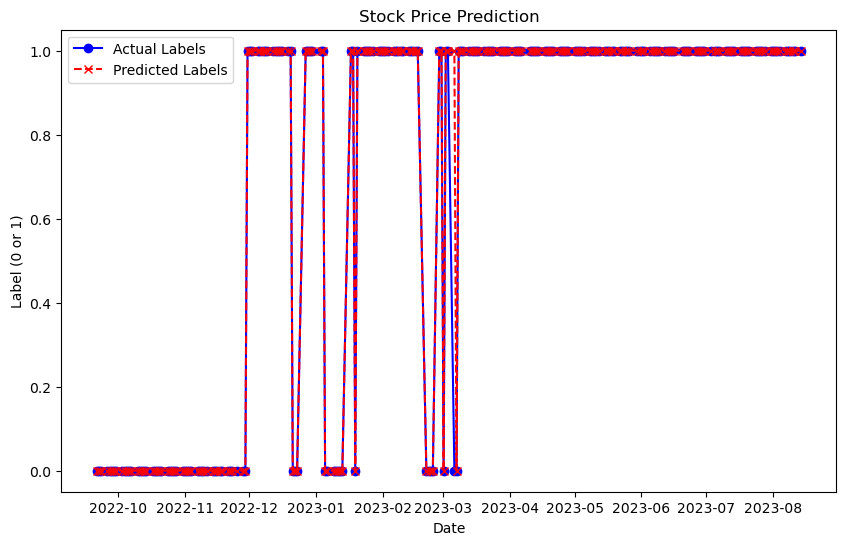

In [85]:
def plot_predictions(y_true, y_pred, title='Stock Price Prediction'):
    plt.figure(figsize=(10, 6))
    plt.plot(y_true.index, y_true.values, label='Actual Labels', color='blue', marker='o')
    plt.plot(y_true.index, y_pred, label='Predicted Labels', color='red', linestyle='dashed', marker='x')
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Label (0 or 1)')
    plt.legend()
    plt.show()
    
plot_predictions(pd.Series(yc_test.values, index=xc_test.index), ya_pred_test)

### Results

#### The project sought to find a relationship between the top 10 ten and bottom 10 technology company stocks in the NASDAQ index and their relationship to the proce of the QQQ ETF.
#### Models built were Least sqaures regression models, which performed very well on the trainging data but overfit the test data. weights that determine the model features and how they act to determine the price of the QQQ were showcased. Howere that model was not a very good one due to over fitting. A Lasso regression model was also built and it reduced overfitting but the low R-squared values in the train and test data, indicated a weak regression model.
#### PCA was used to transform the data and a regression model was built. Getting the coeficents/weights of the features to explain the modole , posed a challenge. The low R-squared value indicated that the model was not a very great one. it seemed to predict the rise and fal of the proces in the test data pretty well.
#### THe KNN classifier had high accuracy and precision scores. It performed well on the test data and indicated string potential in classifying a high or a low when for a new intance time . It could also be used to indicate stocks that will potentially rice with the QQQ.
#### THe Adaboost Classifier worked best.It had a perfect accuracy and Precision. It will indicate/classifier which stock will rice or fall with the QQQ as it rise. Other potential uses of the classifer in relation to the relationship of the stock prices can be applied, given more time on the project, this can be found out. As can be seen from graph on the test set,the Adaboost classifier model fits perfectly on the test set when the predicted vs actual labels are ploted on the time series.